# Membership Selection based on HDBSCAN and GMM

This is the groundwork of using HDBSCAN and GMM to perform a membership selection, with diagnostics. Further, there is a analysis and theoretical isochrone fitting with MIST and PARSEC v2.0.

Structure: 1. Needed Packages / 2. Defintions / 3. Run / 4. Results

This workflow makes use of Astropython on Python 3.11.12

To check the entire workflow memory use: %whos

# Import data

In [2]:
from astropy.io import fits
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

##===== Note =====##
# region
    # Make sure, that the downloaded data contains all the needed parameters for subsequent filtering
        # Plx, Gmag, BPmag, PRmag, BP-RP, e_Gmag, e_BPmag, e_RPmag
# endregion

In [3]:
##===== Preparing Data =====##
# region
##Define path
LORI_path = r"C:\Users\lenna\Documents\Bachelor_Thesis\Preperation_LORI\GaiaDR3_LORI_5deg_J2000.fit"

##Read in FITS
FITS_LORI = fits.open(LORI_path)
# FITS_Pleiades.info()

##Extract Data
LORI_data = FITS_LORI[1].data
ds_LORI = pd.DataFrame(LORI_data)

# endregion

###Note
# region Note
    # This Workflow runs on "Little-Endian" <i8 (Like Gaia DR3).
    # Catalogues like Gaia DR2 use "Big-Endian" >i8
    # For correction use: FILE_Name["Source"] = FILE_name["Source"].astype("<i8")
    #   Use column that gives the Endain style (eg. "Source")
    #   Only chages the indian of the respective column
    ##If you want to convert all at once use:
    # for col in ds_LORI.columns:
    #if ds_LORI[col].dtype.byteorder == ">":
    #    ds_LORI[col] = ds_LORI[col].astype(ds_LORI[col].dtype.newbyteorder("<"))
# endregion

for col in ds_LORI.columns:
    if ds_LORI[col].dtype.byteorder == ">":
        ds_LORI[col] = ds_LORI[col].astype(ds_LORI[col].dtype.newbyteorder("<"))

# region Print DATASET
##Print shap + columns and check for infinite values
Import_datasets = {
    "LORI": ds_LORI,
    #"M67": ds_M67,
}

for name, df in Import_datasets.items():
    print(f"{name}:")
    print(df.shape)
    print(df.columns.tolist())

for name, df in Import_datasets.items():
    numeric_df = df.select_dtypes(include=[np.number])
    has_infinite = np.isinf(numeric_df).values.any()
    print(f"{name} contains infinite values: {has_infinite}")

# endregion

LORI:
(1764408, 42)
['_r', '_RAJ2000', '_DEJ2000', 'RA_ICRS', 'e_RA_ICRS', 'DE_ICRS', 'e_DE_ICRS', 'Source', 'Plx', 'e_Plx', 'PM', 'pmRA', 'e_pmRA', 'pmDE', 'e_pmDE', 'RUWE', 'FG', 'e_FG', 'Gmag', 'e_Gmag', 'FBP', 'e_FBP', 'BPmag', 'e_BPmag', 'FRP', 'e_FRP', 'RPmag', 'e_RPmag', 'BP-RP', 'RVDR2', 'e_RVDR2', 'Tefftemp', 'loggtemp', 'PS1', 'SDSSDR13', 'SkyMapper2', 'URAT1', 'GmagCorr', 'e_GmagCorr', 'FGCorr', 'RAJ2000', 'DEJ2000']
LORI contains infinite values: False


### Merge more data

In [4]:
##===== Preparing Data =====##
# region
##Define path
LORI_path_param = r"C:\Users\lenna\Documents\Bachelor_Thesis\Preperation_LORI\GaiaDR3_LORI_5deg_J2000_param_v3.fit"

##Read in FITS
FITS_LORI_param = fits.open(LORI_path_param)
LORI_data_param = FITS_LORI_param[1].data

##Extract Data
LORI_param = pd.DataFrame(LORI_data_param)
# endregion

for col in LORI_param.columns:
    if LORI_param[col].dtype.byteorder == ">":
        LORI_param[col] = LORI_param[col].astype(LORI_param[col].dtype.newbyteorder("<"))

# region Print DATASET
##Print shap + columns and check for infinite values
Import_datasets = {
    "LORI param": LORI_param
    #"M67": ds_M67,
}

for name, df in Import_datasets.items():
    print(f"{name}:")
    print(df.shape)
    print(df.columns.tolist())

for name, df in Import_datasets.items():
    numeric_df = df.select_dtypes(include=[np.number])
    has_infinite = np.isinf(numeric_df).values.any()
    print(f"{name} contains infinite values: {has_infinite}")

# endregion

LORI param:
(658549, 21)
['_r', '_RAJ2000', '_DEJ2000', 'Source', 'RA_ICRS', 'DE_ICRS', 'Teff', 'logg', '__Fe_H_', 'Dist', 'A0', 'AG', 'ABP', 'E_BP-RP_', 'GMAG', 'Rad', 'Rad-Flame', 'Lum-Flame', 'Mass-Flame', 'Age-Flame', 'z-Flame']
LORI param contains infinite values: False


In [5]:
##Merge on "Source" to keep all Gaia entries, even if luminosity is missing
luminosity_df = LORI_param[["Source", "Lum-Flame", "Teff"]]
ds_LORI_merged = pd.merge(ds_LORI, luminosity_df, on="Source", how="left")

ds_LORI_merged["logTeff"] = np.where(ds_LORI_merged["Teff"] > 0, np.log10(ds_LORI_merged["Teff"]), np.nan)
print(ds_LORI_merged.columns.tolist())

print(ds_LORI_merged[["Source", "Teff", "logTeff", "Lum-Flame"]].head())
print(f"Missing Lum-Flame: {ds_LORI_merged['Lum-Flame'].isnull().sum()}")
print(f"Missing logTeff: {ds_LORI_merged['logTeff'].isnull().sum()}")


['_r', '_RAJ2000', '_DEJ2000', 'RA_ICRS', 'e_RA_ICRS', 'DE_ICRS', 'e_DE_ICRS', 'Source', 'Plx', 'e_Plx', 'PM', 'pmRA', 'e_pmRA', 'pmDE', 'e_pmDE', 'RUWE', 'FG', 'e_FG', 'Gmag', 'e_Gmag', 'FBP', 'e_FBP', 'BPmag', 'e_BPmag', 'FRP', 'e_FRP', 'RPmag', 'e_RPmag', 'BP-RP', 'RVDR2', 'e_RVDR2', 'Tefftemp', 'loggtemp', 'PS1', 'SDSSDR13', 'SkyMapper2', 'URAT1', 'GmagCorr', 'e_GmagCorr', 'FGCorr', 'RAJ2000', 'DEJ2000', 'Lum-Flame', 'Teff', 'logTeff']
                Source     Teff   logTeff  Lum-Flame
0  3333754237926479488      NaN       NaN        NaN
1  3333753825609624704      NaN       NaN        NaN
2  3333752172048186112      NaN       NaN        NaN
3  3333754371071498752      NaN       NaN        NaN
4  3333753718236432256  4614.08  3.664085        NaN
Missing Lum-Flame: 1586938
Missing logTeff: 1496777


### Merge RVs

In [6]:
##===== Preparing Data =====##
# region
##Define path
SOS_path_RV = r"C:\Users\lenna\Documents\Bachelor_Thesis\Preperation_LORI\SOS.LORI_5deg_RV.fit"

##Read in FITS
FITS_SOS_RV = fits.open(SOS_path_RV)
SOS_data_RV = FITS_SOS_RV[1].data

##Extract Data
SOS_RV = pd.DataFrame(SOS_data_RV)
# endregion

for col in SOS_RV.columns:
    if SOS_RV[col].dtype.byteorder == ">":
        SOS_RV[col] = SOS_RV[col].astype(SOS_RV[col].dtype.newbyteorder("<"))

# region Print DATASET
##Print shap + columns and check for infinite values
Import_datasets = {
    "SOS RV": SOS_RV
    #"M67": ds_M67,
}

for name, df in Import_datasets.items():
    print(f"{name}:")
    print(df.shape)
    print(df.columns.tolist())

for name, df in Import_datasets.items():
    numeric_df = df.select_dtypes(include=[np.number])
    has_infinite = np.isinf(numeric_df).values.any()
    print(f"{name} contains infinite values: {has_infinite}")

# endregion

SOS RV:
(30203, 12)
['SoS', 'RA_ICRS', 'DE_ICRS', 'RVcormerg', 'e_RVcormerg', 's_RVcormerg', 'N', 'flagXM', 'flagRV', 'flagBinary', 'Gmag', 'Survey']
SOS RV contains infinite values: False


In [7]:
import pandas as pd
from astropy.coordinates import SkyCoord
from astropy import units as u

##Convert RA/Dec to SkyCoord
LORI_coords = SkyCoord(ra=ds_LORI_merged['RA_ICRS'].values * u.deg,
                       dec=ds_LORI_merged['DE_ICRS'].values * u.deg)

sos_coords = SkyCoord(ra=SOS_RV['RA_ICRS'].values * u.deg,
                      dec=SOS_RV['DE_ICRS'].values * u.deg)

##Match your dataset to the SoS catalog
idx, d2d, _ = LORI_coords.match_to_catalog_sky(sos_coords)

##Define a matching radius 
match_radius = 1 * u.arcsec
matched = d2d < match_radius

##Fill in matched data
ds_LORI_merged['RVcormerg'] = pd.NA
ds_LORI_merged['e_RVcormerg'] = pd.NA
ds_LORI_merged['s_RVcormerg'] = pd.NA

ds_LORI_merged.loc[matched, 'RVcormerg'] = SOS_RV.loc[idx[matched], 'RVcormerg'].values
ds_LORI_merged.loc[matched, 'e_RVcormerg'] = SOS_RV.loc[idx[matched], 'e_RVcormerg'].values
ds_LORI_merged.loc[matched, 's_RVcormerg'] = SOS_RV.loc[idx[matched], 's_RVcormerg'].values


## *Visualize raw data*

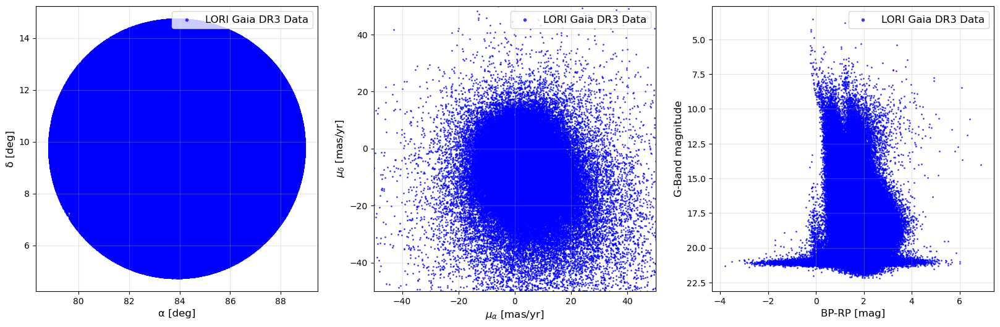

In [8]:
fig, axes = plt.subplots(1, 3, figsize = (20,6))

##First plot
axes[0].scatter(ds_LORI["_RAJ2000"], ds_LORI["_DEJ2000"], marker = "o", s = 1, color = "blue", edgecolor = "blue", alpha = 0.7, label = "LORI Gaia DR3 Data")
#axes[0].scatter(PF_LORI["_RAJ2000"], PF_LORI["_DEJ2000"], marker = "o", s = 1, color = "black", edgecolor = "black", alpha = 0.9, label = "Pre-filtered LORI Gaia DR3 Data")

axes[0].set_xlabel("\u03B1 [deg]", size = 12)
axes[0].set_ylabel("\u03B4 [deg]", size = 12)
#axes[0].set_title("Spatial Distribution", size = 12)
#axes[0].set_xlim(131.75, 134)
#axes[0].set_ylim(10.75, 13)
#axes[0].set_xticks(np.arange(132, 134.5, 0.5))
#axes[0].set_yticks(np.arange(11, 13, 0.5))
axes[0].tick_params(axis = "both", labelsize = 10)
axes[0].legend(prop = {"size": 12}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[0].grid(True, linestyle = "-", alpha = 0.3)

##Second Plot
axes[1].scatter(ds_LORI["pmRA"], ds_LORI["pmDE"], marker = "o", s = 1, color = "blue", edgecolor = "blue", alpha = 0.7, label = "LORI Gaia DR3 Data")
#axes[1].scatter(PF_LORI["pmRA"], PF_LORI["pmDE"], marker = "o", s = 1, color = "black", edgecolor = "black", alpha = 0.9, label = "Pre-filtered LORI Gaia DR3 Data")

axes[1].set_xlabel(r"$\mu_{\alpha}$ [mas/yr]", size = 12)
axes[1].set_ylabel(r"$\mu_{\delta}$ [mas/yr]", size = 12)
#axes[1].set_title("Proper Motion Diagram", size = 12)
axes[1].set_xlim(-50, 50)
axes[1].set_ylim(-50, 50)
#axes[1].set_xticks(np.arange(-40, 50, 10))
#axes[1].set_yticks(np.arange(-40, 50, 10))
axes[1].tick_params(axis = "both", labelsize = 10)
axes[1].legend(prop = {"size": 12}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[1].grid(True, linestyle = "-", alpha = 0.3)

##Plot 3
axes[2].scatter(ds_LORI["BP-RP"], ds_LORI["Gmag"], marker = "o", s = 1, color = "blue", edgecolor = "blue", alpha = 0.7, label = "LORI Gaia DR3 Data")
#axes[2].scatter(PF_LORI["BP-RP"], PF_LORI["Gmag"], marker = "o", s = 1, color = "black", edgecolor = "black", alpha = 0.9, label = "Pre-filtered LORI Gaia DR3 Data")

axes[2].set_xlabel("BP-RP [mag]", size = 12)
axes[2].set_ylabel("G-Band magnitude", size = 12)
#axes[2].set_title("CMD", size = 12)
#axes[2].set_xlim(x, x)
#axes[2].set_ylim(x, x)
#axes[2].set_xticks(np.arange(x, x, x))
#axes[2].set_yticks(np.arange(x, x, x))
axes[2].tick_params(axis = "both", labelsize = 10)
axes[2].invert_yaxis()
axes[2].legend(prop = {"size": 12}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[2].grid(True, linestyle = "-", alpha = 0.3)

plt.tight_layout
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/xxx.pdf")
plt.show()


# Pre-filter DataSet

The pre-filtering is used, to refine the outcome of subsequent memberhip selection, as the data contains outliers and missig astrometric data.

In [9]:
##Needed columns for the Clean Up
PF_Data_TBC = ["Plx", "Gmag", "BPmag", "RPmag", "e_Gmag", "e_BPmag", "e_RPmag"]
    # make sure, that these variables are called the same in each dataset, otherwise, call them individually

##===== Abbriviations =====##
# region Abbriviations
    # PF    - Pre-Filtered
    # TBC   - To Be Considered
    # STNR  - Signal To Noise Ratio
    # P(C)  - Parallax (Calculated)
# endregion

##===== Notes =====##
# region Notes
    # .query    - makes it easier to list several agruments, as you do not need to call the dataset every time
# endregion

In [10]:
##===== Pre-filtering =====##
# region
##Apply Signal-To-Noise Ratio to Plx (if not already included in dataset)
PF_Cluster_STNR_PC = ds_LORI_merged[ds_LORI_merged["Plx"] / ds_LORI_merged["e_Plx"] > 5].copy()
# Safty: Convert to numeric and defined non-numeric rows as NaN
PF_Cluster_STNR_PC["Plx"] = pd.to_numeric(PF_Cluster_STNR_PC["Plx"], errors = "coerce")

##Drop data with invalid/ missing astrometric data + meet requirements
PF_Cluster = PF_Cluster_STNR_PC.dropna(subset = PF_Data_TBC)
PF_Cluster = PF_Cluster.query("Plx >= 0 & e_Gmag < 0.01")
# e_Gmag < 0.005 -> for bright sources / but for less bright use 0.01

###Note: Parameters like "RUWE", can also be exccluded/ identified after HDBSCAN and GMM, if needed for the analysis
# However, below included is a RUWE evaluation
#PF_Cluster = PF_Cluster.query("RUWE < 1.4")

##Drop photometric data for Gmag and Color
# Relative Gmag error
PF_Cluster["rel_error_Gmag"] = PF_Cluster["e_Gmag"] / PF_Cluster["Gmag"]
PF_Cluster = PF_Cluster.query("rel_error_Gmag <= 0.05")
# Relative Colour error
# Estimate error in BP–RP using error propagation
PF_Cluster["e_BP_RP"] = np.sqrt(PF_Cluster["e_BPmag"]**2 + PF_Cluster["e_RPmag"]**2)
PF_Cluster["rel_error_BP_RP"] = PF_Cluster["e_BP_RP"] / (PF_Cluster["BP-RP"] + 1e-3)
## PROBLEM WHEN DIVIDED BY 0, so add a variation like 1e^(-3)
PF_Cluster = PF_Cluster.query("rel_error_BP_RP <= 0.05")

##Reset index if needed (due to cuts, the index most certainly shuffeled)
PF_Cluster = PF_Cluster.reset_index(drop = True)
# endregion

print(f"Inital Dataset size:                {len(ds_LORI)}")
print(f"After S/N > 5 cut:                  {len(PF_Cluster_STNR_PC)}")
print(f"After final filtering:              {len(PF_Cluster)}")

print(PF_Cluster.columns.tolist())

Inital Dataset size:                1764408
After S/N > 5 cut:                  323225
After final filtering:              315964
['_r', '_RAJ2000', '_DEJ2000', 'RA_ICRS', 'e_RA_ICRS', 'DE_ICRS', 'e_DE_ICRS', 'Source', 'Plx', 'e_Plx', 'PM', 'pmRA', 'e_pmRA', 'pmDE', 'e_pmDE', 'RUWE', 'FG', 'e_FG', 'Gmag', 'e_Gmag', 'FBP', 'e_FBP', 'BPmag', 'e_BPmag', 'FRP', 'e_FRP', 'RPmag', 'e_RPmag', 'BP-RP', 'RVDR2', 'e_RVDR2', 'Tefftemp', 'loggtemp', 'PS1', 'SDSSDR13', 'SkyMapper2', 'URAT1', 'GmagCorr', 'e_GmagCorr', 'FGCorr', 'RAJ2000', 'DEJ2000', 'Lum-Flame', 'Teff', 'logTeff', 'RVcormerg', 'e_RVcormerg', 's_RVcormerg', 'rel_error_Gmag', 'e_BP_RP', 'rel_error_BP_RP']


In [11]:
##====== Add Absolute Magntiude =====##
PF_Cluster["AbsMag"] = PF_Cluster["Gmag"]-5*np.log10(1000/PF_Cluster["Plx"])+5

##Error
PF_Cluster["e_AbsMag"] = np.sqrt(PF_Cluster["e_Gmag"]**2 + (5/np.log(10) * PF_Cluster["e_Plx"] / PF_Cluster["Plx"])**2)

print(PF_Cluster.columns.tolist())

['_r', '_RAJ2000', '_DEJ2000', 'RA_ICRS', 'e_RA_ICRS', 'DE_ICRS', 'e_DE_ICRS', 'Source', 'Plx', 'e_Plx', 'PM', 'pmRA', 'e_pmRA', 'pmDE', 'e_pmDE', 'RUWE', 'FG', 'e_FG', 'Gmag', 'e_Gmag', 'FBP', 'e_FBP', 'BPmag', 'e_BPmag', 'FRP', 'e_FRP', 'RPmag', 'e_RPmag', 'BP-RP', 'RVDR2', 'e_RVDR2', 'Tefftemp', 'loggtemp', 'PS1', 'SDSSDR13', 'SkyMapper2', 'URAT1', 'GmagCorr', 'e_GmagCorr', 'FGCorr', 'RAJ2000', 'DEJ2000', 'Lum-Flame', 'Teff', 'logTeff', 'RVcormerg', 'e_RVcormerg', 's_RVcormerg', 'rel_error_Gmag', 'e_BP_RP', 'rel_error_BP_RP', 'AbsMag', 'e_AbsMag']


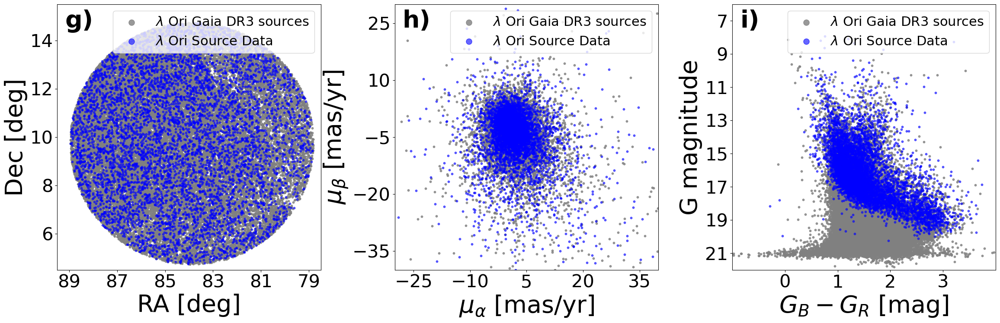

In [ ]:
fig, axes = plt.subplots(1, 3, figsize = (28,8))
# region
##First plot
#axes[0].scatter(ds_LORI["_RAJ2000"], ds_LORI["_DEJ2000"], marker = "o", s = 1, color = "grey", edgecolor = "grey", alpha = 0.7, label = r"$\lambda$ Ori Gaia DR3 sources")
#axes[0].scatter(PF_Cluster["_RAJ2000"], PF_Cluster["_DEJ2000"], marker = "o", s = 1, color = "blue", edgecolor = "blue", alpha = 0.7, label = "Source Data", zorder = 2)

T = 35200
indices2 = np.random.choice(len(ds_LORI), size=T, replace=False)
axes[0].scatter(ds_LORI["_RAJ2000"].values[indices2],
                ds_LORI["_DEJ2000"].values[indices2],
                marker = "o", s=10, color = "gray", edgecolor = "gray",
                alpha = 0.8, label = r"$\lambda$ Ori Gaia DR3 sources")

N = 6320 # number of points to plot
indices = np.random.choice(len(PF_Cluster), size=N, replace=False)
axes[0].scatter(PF_Cluster["_RAJ2000"].values[indices],
                PF_Cluster["_DEJ2000"].values[indices],
                marker = "o", s=10, color = "blue", edgecolor = "blue",
                alpha = 0.6, label = r"$\lambda$ Ori Source Data", zorder = 2)

axes[0].text(0.03, 0.98, "g)", transform=axes[0].transAxes, fontsize = 40, fontweight = "bold", va = "top", ha = "left")

axes[0].set_xlabel("RA [deg]", size = 40)
axes[0].set_ylabel("Dec [deg]", size = 40)
#axes[0].set_title("Spatial Distribution", size = 12)
axes[0].set_xlim(78.5, 89.5)
axes[0].set_ylim(4.5, 15.5)
axes[0].set_xticks(np.arange(79, 90, 2))
#axes[0].set_yticks(np.arange(11, 13, 0.5))
axes[0].tick_params(axis = "both", labelsize = 30)
axes[0].legend(prop = {"size": 22}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 25)
axes[0].invert_xaxis()
#axes[0].grid(True, linestyle = "-", alpha = 0.3)

##Second Plot
# region Second Plot
#axes[1].scatter(ds_LORI["pmRA"], ds_LORI["pmDE"], marker = "o", s = 1, color = "grey", edgecolor = "grey", alpha = 1, label = r"$\lambda$ Ori Gaia DR3 sources")
#axes[1].scatter(PF_Cluster["pmRA"], PF_Cluster["pmDE"], marker = "o", s = 1, color = "blue", edgecolor = "blue", alpha = 0.7, label ="Source Data")

axes[1].scatter(ds_LORI["pmRA"].values[indices2],
                ds_LORI["pmDE"].values[indices2],
                marker = "o", s=10, color = "gray", edgecolor = "gray",
                alpha = 0.8, label = r"$\lambda$ Ori Gaia DR3 sources")

axes[1].scatter(PF_Cluster["pmRA"].values[indices],
                PF_Cluster["pmDE"].values[indices],
                marker = "o", s=10, color = "blue", edgecolor = "blue",
                alpha = 0.6, label = r"$\lambda$ Ori Source Data")

axes[1].text(0.03, 0.98, "h)", transform=axes[1].transAxes, fontsize = 40, fontweight = "bold", va = "top", ha = "left")

axes[1].set_xlabel(r"$\mu_{\alpha}$ [mas/yr]", size = 40)
axes[1].set_ylabel(r"$\mu_{\beta}$ [mas/yr]", size = 40)
#axes[1].set_title("Proper Motion Diagram", size = 12)
axes[1].set_xlim(-30, 40)
axes[1].set_ylim(-40, 30)
axes[1].set_xticks(np.arange(-25, 45, 15))
axes[1].set_yticks(np.arange(-35, 30, 15))
axes[1].tick_params(axis = "both", labelsize = 30)
axes[1].legend(prop = {"size": 22}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 25)
#axes[1].grid(True, linestyle = "-", alpha = 0.3)

# endregion
##Plot 3
# region
#axes[2].scatter(ds_LORI["BP-RP"], ds_LORI["Gmag"], marker = "o", s = 1, color = "gray", edgecolor = "gray", alpha = 0.7, label = r"$\lambda$ Ori Gaia DR3 sources")
#axes[2].scatter(PF_Cluster["BP-RP"], PF_Cluster["Gmag"], marker = "o", s = 1, color = "blue", edgecolor = "blue", alpha = 0.9, label = "Source Data")

axes[2].scatter(ds_LORI["BP-RP"].values[indices2],
                ds_LORI["Gmag"].values[indices2],
                marker = "o", s=10, color = "gray", edgecolor = "gray",
                alpha = 0.8, label = r"$\lambda$ Ori Gaia DR3 sources")

axes[2].scatter(PF_Cluster["BP-RP"].values[indices],
                PF_Cluster["Gmag"].values[indices],
                marker = "o", s=10, color = "blue", edgecolor = "blue",
                alpha = 0.6, label = r"$\lambda$ Ori Source Data")

axes[2].text(0.03, 0.98, "i)", transform=axes[2].transAxes, fontsize = 40, fontweight = "bold", va = "top", ha = "left")

axes[2].set_xlabel(r"$G_B - G_R$ [mag]", size = 40)
axes[2].set_ylabel("G magnitude", size = 40)
#axes[2].set_title("CMD", size = 12)
axes[2].set_xlim(-1, 4)
axes[2].set_ylim(6, 22)
axes[2].set_xticks(np.arange(-0, 4, 1))
axes[2].set_yticks(np.arange(7, 22, 2))
axes[2].tick_params(axis = "both", labelsize = 30)
axes[2].invert_yaxis()
axes[2].legend(prop = {"size": 22}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 25)
#axes[2].grid(True, linestyle = "-", alpha = 0.3)
# endregion

#plt.tight_layout
plt.subplots_adjust(wspace=0.28) 
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/LORI_SourceDataPreview.png", bbox_inches = "tight")
plt.show()


### RUWE evaluation

In [13]:
##===== RUWE Labeling =====##
PF_Cluster["RUWE_hardlabel"] = np.where(PF_Cluster["RUWE"] < 1.4, "S", "B")

NUMBER_Binaries = (PF_Cluster["RUWE_hardlabel"] == "B").sum()
print(f"Number of binary canidates: {NUMBER_Binaries}")

##===== NOTE =====##
# region
    #This is a hardlabel for possible binaries based on a hard cut on the RUWE value of 1.4.
    # S = Sinlge (stars) / B = binary (stars)

    # If one want to only plot one category, use PF_Cluster[PF_Cluster["RUWE_hardlabel"] == "B"]["insert_column_name"]
# endregion

Number of binary canidates: 15804


In [14]:
##===== RUWE Bins ====##
# region
##Define bins from 1.0 to 2.0 (most common)
RUWE_bins = np.arange(1.0, 2.1, 0.1)
RUWE_labels = [f"{RUWE_bins[i]:.1f} < x ≤ {RUWE_bins[i+1]:.1f}" for i in range(len(RUWE_bins)-1)]

##Put into Dataset
PF_Cluster["RUWE_bin_RawData"] = pd.cut(PF_Cluster["RUWE"], bins = RUWE_bins, labels = RUWE_labels, include_lowest = True)

##Count objects in each bin
bin_counts = PF_Cluster["RUWE_bin_RawData"].value_counts().sort_index()

##Add count of RUWE ≥ 2.0 and 0 < RUWE <= 1
RUWE_ge_2_count = (PF_Cluster["RUWE"] > 2.0).sum()
RUWE_ge_0_count = ((PF_Cluster["RUWE"] > 0.0) & (PF_Cluster["RUWE"] < 1.0)).sum()
bin_counts["x > 2.0"] = RUWE_ge_2_count
bin_counts["x > 0.0"] = RUWE_ge_0_count
# endregion
print(bin_counts)


RUWE_bin_RawData
1.0 < x ≤ 1.1    162569
1.1 < x ≤ 1.2     16507
1.2 < x ≤ 1.3      4921
1.3 < x ≤ 1.4      3069
1.4 < x ≤ 1.5      2144
1.5 < x ≤ 1.6      1647
1.6 < x ≤ 1.7      1273
1.7 < x ≤ 1.8      1026
1.8 < x ≤ 1.9       899
1.9 < x ≤ 2.0       732
x > 2.0            8083
x > 0.0          113094
Name: count, dtype: int64


# HDBSCAN Algorithm

Main Source: https://hdbscan.readthedocs.io/en/latest/api.html

In [32]:
import numpy as np
import pandas as pd
import hdbscan
import seaborn as sns
import warnings
from hdbscan.prediction import PredictionData
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=FutureWarning)
# These are for scaling the parameter space, however a normal Standart Score is enough
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

In [33]:
##===== Note =====##
##Scaling in HDBSCAN and GMM:

# region Scaling
    # Scaling the parameters before applying HDBSCAN or GMM is more of a safty-net,
    # as it prevents potential problems if the data is not clean or the parameters
    # have diffetent units / statistical properties.

    # Thus, any scaler only shift and strecht the data, but also preverse the relative ordering between points (eg. Plx).
    # And both HDBSCAN and GMM work wiht these relative properties, thus the internal structure of the data
    # remains basically identical after any scaling operations.

    ## Thus, slight differences in the scaling operations (eg. quantile range for RobustScaler),
    #   does not affect the local relationships between the datapoints.

    ## Therefore, to keep it simple, I use a modified Standard Score, as both RobustScaler and StandartScaler, create a new
    #   space in which the data lives. The Standard Score only scales the data in respect to the data itself, thus no new space is being created.
# endregion

## Execute HDBSCAN algorithm

In [34]:

ra0 = 83.8
dec0 = 9.78
# Extract RA, Dec from your dataframe
prefilter_ra = PF_Cluster["_RAJ2000"].values
prefilter_dec = PF_Cluster["_DEJ2000"].values

# Convert RA/Dec to offsets (in arcmin)
# Apply cos(dec0) correction for RA
dx = (prefilter_ra - ra0) * np.cos(np.deg2rad(dec0)) * 60.0  # arcmin
dy = (prefilter_dec - dec0) * 60.0                          # arcmin

# Add back into dataframe
PF_Cluster["dx_arcmin"] = dx
PF_Cluster["dy_arcmin"] = dy


In [35]:
##===== Prepare Data =====##
##Needed columns for the function hdbscan.HDBSCAN
HDBSCAN_Data_TBC = ["RA_ICRS", "DE_ICRS", "Plx", "pmRA", "pmDE"]
#HDBSCAN_Data_TBC = ["dy_arcmin", "dx_arcmin", "Plx", "pmRA", "pmDE"]
#HDBSCAN_Data_TBC = ["Plx", "pmRA", "pmDE"]

##===== Abbriviations =====##
# region Abbriviations
    # PS    - Parameter Selection
    # NE    - Noise Ejection
    # CL    - Cluster Labels
# endregion

##===== Notes =====##
# region Note
    # HDBSCAN searches for clusters based on density variations regarding the parameters
    # Cluster Labeling: -1 := noise membrs / 0, 1, 2, ... := name of found clusters
    # min_samples   - minimum #of Objects to form a cluster
        # low-values typically catch small sub-groups and smaller dynamics in a cluster (more detailed)
        # high-values focus more on the core, and do not catch smaller dynamics, thus it might lead to the lost of a few outside members
    # min_smaples   - minimum # of objects (or neighbours) around the core distance
        # if any objects does not fullfill the criteria, it is not considered a member of the cluster
# endregion

In [36]:
##===== Running the model =====##
##Extracting + Scale needed data
HDBSCAN_Cluster_PS = PF_Cluster[HDBSCAN_Data_TBC].copy()
HDBSCAN_Cluster_PS = (HDBSCAN_Cluster_PS - HDBSCAN_Cluster_PS.median()) / HDBSCAN_Cluster_PS.std()

###Note:
# region Scale-options
    # V2_HDBSCAN_Cluster_PS = RobustScaler(quantile_range = (5.0, 95.0)).fit_transform(V2_HDBSCAN_Cluster_PS)
    # V2_HDBSCAN_Cluster_PS = StandardScaler().fit_transform(V2_HDBSCAN_Cluster_PS)
# endregion

##Fit HDBSCAN algorithm
# Select parameter choice for HDBSCAN 
HDBSCAN_Cluster_clusterer = hdbscan.HDBSCAN(min_cluster_size = 50, min_samples = 50)
# Fits HDBSCAN on Data and extracts labels
HDBSCAN_Cluster_CL = HDBSCAN_Cluster_clusterer.fit_predict(HDBSCAN_Cluster_PS)

##Put HDBSCAN's data back into dataframe
PF_Cluster = PF_Cluster.reset_index(drop = True).copy()
PF_Cluster["HDBSCAN_labels"] = HDBSCAN_Cluster_CL

print(PF_Cluster["HDBSCAN_labels"].value_counts())

HDBSCAN_labels
 2    209100
-1    105683
 1      1114
 0        67
Name: count, dtype: int64


In [37]:
##===== Extract identified sources =====##
##Saving a specific cluster and drop Noise
HDBSCAN_Cluster_NE = PF_Cluster[PF_Cluster["HDBSCAN_labels"] != -1]["HDBSCAN_labels"].value_counts()
#print(HDBSCAN_Cluster_NE)

dsHDBSCAN_Cluster = PF_Cluster[PF_Cluster["HDBSCAN_labels"] == HDBSCAN_Cluster_NE.index[1]].copy()
print(dsHDBSCAN_Cluster.shape)

##Theoretically, you do not need to filter the data again, but I makes the subsequent data handling much easier

(1114, 58)


### RUWE Evaluation

In [38]:
##===== RUWE Bins ====##
# region
##Define bins from 1.0 to 2.0 (most common)
RUWE_bins_HDBSCAN = np.arange(1.0, 2.1, 0.1)
RUWE_labels_HDBCSAN = [f"{RUWE_bins_HDBSCAN[i]:.1f} < x ≤ {RUWE_bins_HDBSCAN[i+1]:.1f}" for i in range(len(RUWE_bins_HDBSCAN)-1)]

##Put into Dataset
dsHDBSCAN_Cluster["RUWE_bin_HDBSCAN"] = pd.cut(dsHDBSCAN_Cluster["RUWE"], bins = RUWE_bins, labels = RUWE_labels, include_lowest = True)

##Count objects in each bin
bin_counts = dsHDBSCAN_Cluster["RUWE_bin_HDBSCAN"].value_counts().sort_index()

##Add count of RUWE ≥ 2.0 and 0 < RUWE <= 1
RUWE_ge_2_HDBSCAN = (dsHDBSCAN_Cluster["RUWE"] > 2.0).sum()
RUWE_ge_0_HDBCAN = ((dsHDBSCAN_Cluster["RUWE"] > 0.0) & (dsHDBSCAN_Cluster["RUWE"] <= 1.0)).sum()
bin_counts["2.0 < x"] = RUWE_ge_2_HDBSCAN
bin_counts["0.0 < x <= 1"] = RUWE_ge_0_HDBCAN

print(bin_counts)
# endregion

RUWE_bin_HDBSCAN
1.0 < x ≤ 1.1    595
1.1 < x ≤ 1.2    104
1.2 < x ≤ 1.3     29
1.3 < x ≤ 1.4     17
1.4 < x ≤ 1.5     16
1.5 < x ≤ 1.6     10
1.6 < x ≤ 1.7      5
1.7 < x ≤ 1.8      8
1.8 < x ≤ 1.9      8
1.9 < x ≤ 2.0      3
2.0 < x           48
0.0 < x <= 1     271
Name: count, dtype: int64


In [39]:
##===== RUWE evaluation =====##
# region
NUMBER_Binaries_HDBSCAN = (dsHDBSCAN_Cluster["RUWE_hardlabel"] == "B").sum()
print(f"Number of binary canidates: {NUMBER_Binaries_HDBSCAN}")

dsHDBSCAN_Cluster_binaries = dsHDBSCAN_Cluster[dsHDBSCAN_Cluster["RUWE_hardlabel"] == "B"]
print(f"Shape of extracted binaries: {dsHDBSCAN_Cluster_binaries.shape}")

dsHDBSCAN_Cluster_nonBinaries = dsHDBSCAN_Cluster[dsHDBSCAN_Cluster["RUWE_hardlabel"] == "S"]
print(f"Shape of non Binaries included: {dsHDBSCAN_Cluster_nonBinaries.shape}")
# endregion


Number of binary canidates: 98
Shape of extracted binaries: (98, 59)
Shape of non Binaries included: (1016, 59)


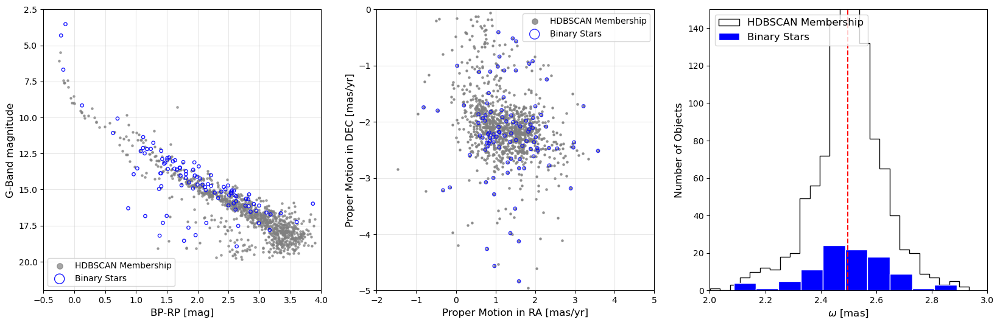

Parallax mean: 2.498019
Parallax mean std: 0.1270
Parallax ERROR: 0.1034


In [40]:
fig, axes = plt.subplots(1, 3, figsize = (20, 6))

##First Plot
# region First Plot
#axes[0].scatter(dsHDBSCAN_Cluster["BP-RP"], dsHDBSCAN_Cluster["Gmag"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.7, label = "HDBSCAN Membership")
axes[0].scatter(dsHDBSCAN_Cluster_nonBinaries["BP-RP"], dsHDBSCAN_Cluster_nonBinaries["Gmag"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.7, label = "HDBSCAN Membership")
axes[0].scatter(dsHDBSCAN_Cluster_binaries["BP-RP"], dsHDBSCAN_Cluster_binaries["Gmag"], marker = "o", s = 15, facecolor = "none", edgecolor = "blue", alpha = 0.9, label = "Binary Stars")

axes[0].set_xlabel("BP-RP [mag]", size = 12)
axes[0].set_ylabel("G-Band magnitude", size = 12)
#axes[0].set_title("CMD", size = 12)
axes[0].set_xlim(-0.5, 4)
axes[0].set_ylim(2.5, 22)
#axes[0].set_xticks(np.arange(0.5, 3.0, 0.5))
#axes[0].set_yticks(np.arange(9.0, 20.0, 2))
axes[0].tick_params(axis = "both", labelsize = 10)
axes[0].invert_yaxis()
axes[0].legend(prop = {"size": 10}, loc = "lower left", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[0].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Second Plot
# region Second Plot
#axes[1].scatter(PF_Cluster["pmRA"], PF_Cluster["pmDE"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "HDBSCAN Membership")
axes[1].scatter(dsHDBSCAN_Cluster["pmRA"], dsHDBSCAN_Cluster["pmDE"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.8, zorder = 0, label = "HDBSCAN Membership")
axes[1].scatter(dsHDBSCAN_Cluster_binaries["pmRA"], dsHDBSCAN_Cluster_binaries["pmDE"], marker = "o", s = 15, facecolor = "none", edgecolor = "blue", alpha = 0.8, zorder = 2, label = "Binary Stars")

axes[1].set_xlabel("Proper Motion in RA [mas/yr]", fontsize = 12)
axes[1].set_ylabel("Proper Motion in DEC [mas/yr]", fontsize = 12)
axes[1].set_xlim(-2, 5)
axes[1].set_ylim(0, -5)
#axes[1].set_xticks(np.arange(-1, 3, 0.5))
#axes[1].set_yticks(np.arange(-4, -1, 0.5))
axes[1].invert_yaxis()

axes[1].tick_params(axis = "both", labelsize = 10)
axes[1].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[1].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Third Plot
# region Thrid Plot
axes[2].hist(dsHDBSCAN_Cluster["Plx"], bins = 30, histtype = "step" , color = "black", edgecolor = "black", zorder = 0, label = "HDBSCAN Membership")
axes[2].hist(dsHDBSCAN_Cluster_binaries["Plx"], bins = 10, color = "blue", edgecolor = "white", zorder = 1, label = "Binary Stars")

axes[2].set_xlabel(r"$\omega$ [mas]", size = 12)
axes[2].set_ylabel("Number of Objects", size = 12)

axes[2].legend(prop={"size": 12}, loc ="upper left", ncol = 1)
axes[2].tick_params(axis="both", labelsize=10)

# Derive the median Plx in Plot
Cluster_PARALLAX_median = np.nanmean(dsHDBSCAN_Cluster["Plx"])
axes[2].axvline(Cluster_PARALLAX_median, color = "red", linestyle = "--", linewidth = 1.5)
Cluster_PARALLAX_median_std = np.std(dsHDBSCAN_Cluster["Plx"], ddof = 1)
Cluster_PARALLAX_ERROR_MEDIAN = np.nanmean(dsHDBSCAN_Cluster["e_Plx"])

##Set limit to x- and y-axis (to zoom in)
axes[2].set_xlim(2, 3)
axes[2].set_ylim(0, 150)
#axes[2].set_xticks(np.arange(6.25, 8.75, 0.25))
#axes[2].set_yticks(np.arange(0, 250, 50))
# endregion

plt.tight_layout
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/xxx.pdf")
plt.show()

print(f"Parallax mean: {Cluster_PARALLAX_median:.6f}")
print(f"Parallax mean std: {Cluster_PARALLAX_median_std:.4f}")
print(f"Parallax ERROR: {Cluster_PARALLAX_ERROR_MEDIAN:.4f}")

#### *RUWE Bins*

In [41]:
import matplotlib.cm as cm

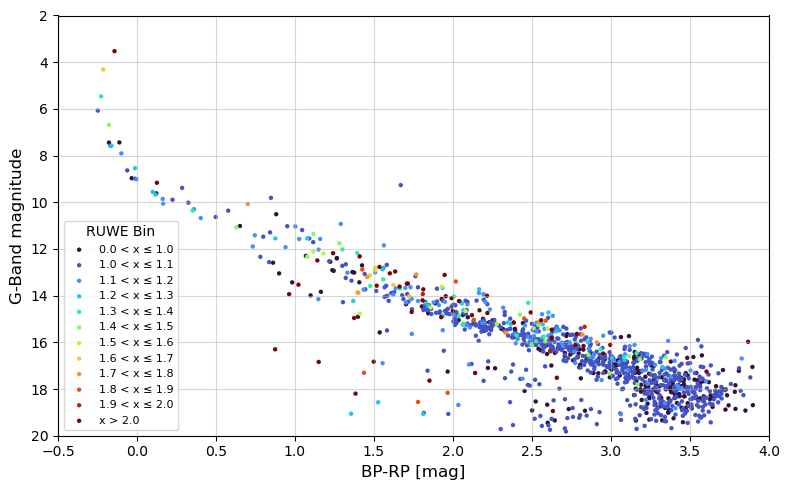

In [42]:
##===== RUWE Bins Ranges =====##
##Define bins
PLT_RUWE_bins = np.concatenate(([0.0], np.arange(1.0, 2.1, 0.1), [np.inf]))
PLT_RUW_labels = (
    ["0.0 < x ≤ 1.0"] +
    [f"{PLT_RUWE_bins[i]:.1f} < x ≤ {PLT_RUWE_bins[i+1]:.1f}" for i in range(1, len(PLT_RUWE_bins)-2)] +
    ["x > 2.0"]
)

##Assign bins to RUWE values
dsHDBSCAN_Cluster["RUWE_bin_HDBSCAN"] = pd.cut(dsHDBSCAN_Cluster["RUWE"], bins = PLT_RUWE_bins, labels = PLT_RUW_labels, include_lowest = True, right = True)

# Sort bins for plotting
PLT_RUWE_bins_sorted = [label for label in PLT_RUW_labels if label in dsHDBSCAN_Cluster["RUWE_bin_HDBSCAN"].unique()]
colors = cm.turbo(np.linspace(0, 1, len(PLT_RUWE_bins_sorted)))

# Start the plot
plt.figure(figsize=(8, 5))

# Loop through each bin and plot
for i, ruwe_bin in enumerate(PLT_RUWE_bins_sorted):
    subset = dsHDBSCAN_Cluster[dsHDBSCAN_Cluster["RUWE_bin_HDBSCAN"] == ruwe_bin]
    plt.scatter(
        subset["BP-RP"], subset["Gmag"],
        color=colors[i], s=10, alpha=1.0, edgecolor='none', label=ruwe_bin
    )

# Axes and labels
plt.xlabel("BP-RP [mag]", size=12)
plt.ylabel("G-Band magnitude", size=12)
plt.xlim(-0.5, 4.0)
plt.ylim(2, 20)
plt.gca().invert_yaxis()
plt.tick_params(axis="both", labelsize=10)
plt.grid(True, linestyle="-", alpha=0.5)

# Legend
plt.legend(title="RUWE Bin", prop={"size": 8}, loc="lower left")

plt.tight_layout()
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_Pleiades/Figures/xxx.pdf")
plt.show()


## *HDBSCAN Visualisation (MST)*

In order to visulaize the "minimum spanning tree", you need to run the model again on the selected data, as source data can contain to many objects.

In [43]:
##===== Abbriviations =====##
# region Abbriviations
    # HMST  - HDBSCAN MST
    # MST   - Minimum Spanning Tree
# endregion

##===== Notes =====##
# region Notes
    # MST       - the MST build in HDBSCAN is just a quick visualization, however, it cannot plot it against astrometric data
    #               as HDBSCAN uses a scaled features space, in which eg. pmRA is dimensionless
    ## Therefore, I also use the minimum_spanning_tree function fro scipy.sparese.csgraph.
    # Leaf size - determines, how many points remain in the smallest division in a tree
        # high values for higher number of objects per cluster
        # low values for lower cluster size
# endregion

### Rerun HDBSCAN on selected data

This step is needed, to "gen_min_span_tree", as the original DataSet could be to large for the referred function.

In [44]:
HMST_Cluster = dsHDBSCAN_Cluster[HDBSCAN_Data_TBC].copy()
HMST_Cluster = HMST_Cluster.fillna(HMST_Cluster.median())

HMST_Cluster = (HMST_Cluster - HMST_Cluster.median()) / HMST_Cluster.std()

HMST_Cluster_clusterer = hdbscan.HDBSCAN(min_cluster_size = 50, min_samples = 50,
                                          gen_min_span_tree = True,
                                          approx_min_span_tree = False,
                                          leaf_size = 40)

HMST_Cluster_clusterer.fit_predict(HMST_Cluster)

array([-1, -1, -1, ..., -1, -1, -1], shape=(1114,))

### Minimum Spanning Tree

#### From HDBSCAN library

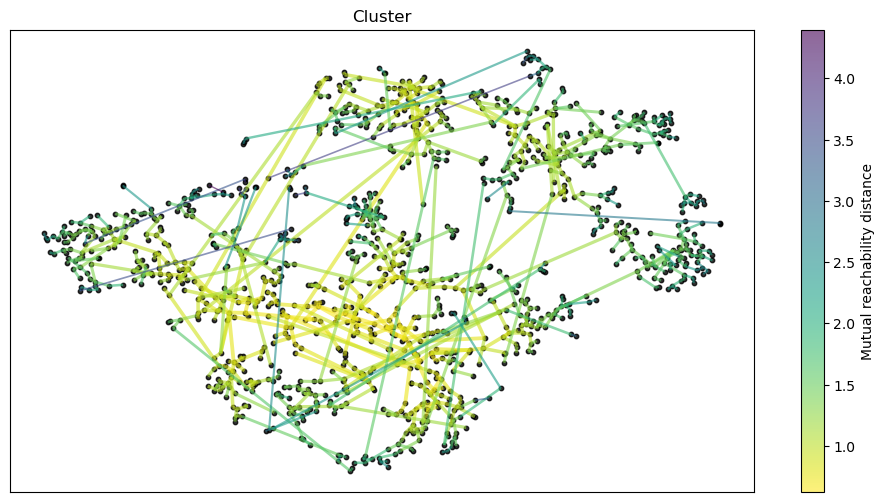

In [45]:
plt.figure(figsize=(12, 6))
HMST_Cluster_clusterer.minimum_spanning_tree_.plot(edge_linewidth = 1.0, edge_alpha = 0.6, node_size = 10)
plt.title("Cluster")
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/xxx.pdf")
plt.show()

#### From SciPy

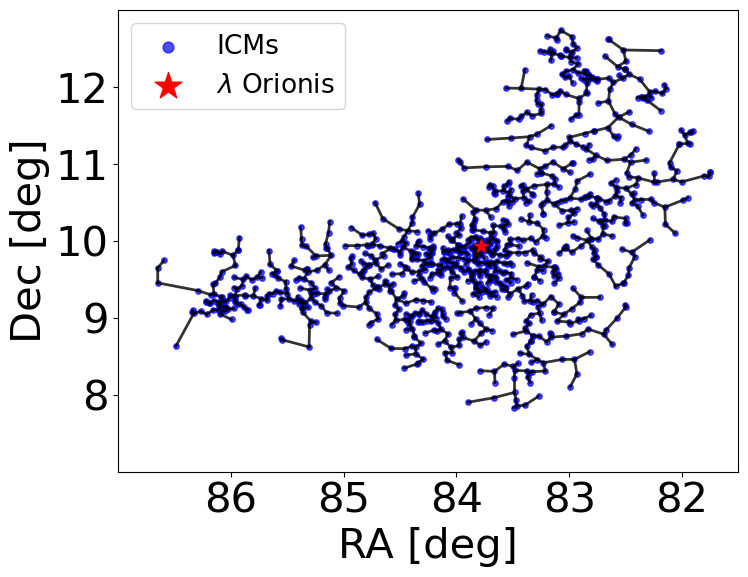

In [476]:
from scipy.spatial.distance import pdist, squareform
from scipy.sparse.csgraph import minimum_spanning_tree
import numpy as np
import matplotlib.pyplot as plt

##Extract the unscaled data
pm_data = dsHDBSCAN_Cluster[["RA_ICRS", "DE_ICRS"]].dropna().to_numpy()

##Compute Eucludian distance between every pair of stars, based on provided data
# pdist         - computes 1D array
# squareform    - turns array into symmetric matrix of pairwise distances -> dist_matrix[i,j] is Euclidian distance between stars
dist_matrix = squareform(pdist(pm_data))

##Build the MST
# It minimizes the total distance across all edges
mst_sparse = minimum_spanning_tree(dist_matrix)

##Convert the MST to a lost of connections (edges)
# makes it easier to draw edes between stars
coo = mst_sparse.tocoo()

##Plot
plt.figure(figsize=(8, 6))
plt.scatter(pm_data[:, 0], pm_data[:, 1], s = 15, color = "blue", alpha = 0.7, label = "ICMs")
for i, j in zip(coo.row, coo.col):
    plt.plot([pm_data[i, 0], pm_data[j, 0]],
             [pm_data[i, 1], pm_data[j, 1]],
             color = "black", linewidth = 2, alpha = 0.8)

plt.xlabel("RA [deg]", fontsize=30)
plt.ylabel("Dec [deg]", fontsize=30)
plt.grid(False)
plt.scatter(083.78449673651, 09.93415011072, facecolor = "red", edgecolors='red', s=100, marker = "*", zorder = 5, label = "$\lambda$ Orionis")

plt.tick_params(axis = "both", labelsize = 30)

plt.xlim(87,81.5)
plt.ylim(7, 13)

plt.xticks(np.arange(82, 87, 1))
plt.yticks(np.arange(8, 13, 1))

plt.legend(prop = {"size": 19}, loc = "upper left", scatterpoints = 1, markerscale = 2, fontsize = 20)
#plt.tight_layout()
plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/LORI_MSTv2.pdf", bbox_inches = "tight")
plt.show()

##This code was created by CHATGPT


C:\Users\lenna\AppData\Local\Temp\ipykernel_21488\3122700944.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20c')


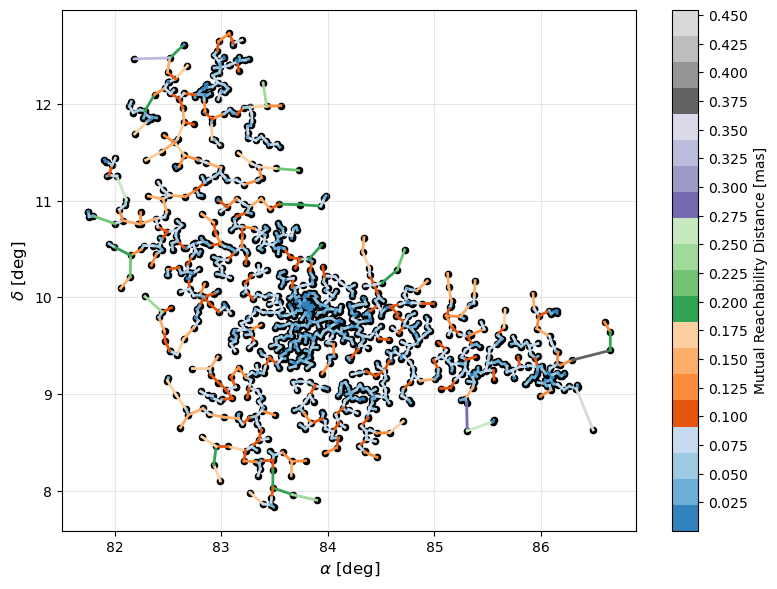

In [47]:
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import Normalize
from scipy.sparse.csgraph import minimum_spanning_tree
from scipy.spatial.distance import pdist, squareform
import numpy as np

# Proper motion data
pm_data = dsHDBSCAN_Cluster[["RA_ICRS", "DE_ICRS"]].dropna().to_numpy()

# Compute pairwise distances and MST
dist_matrix = squareform(pdist(pm_data))
mst_sparse = minimum_spanning_tree(dist_matrix)
coo = mst_sparse.tocoo()

# Normalize distances for color mapping
distances = coo.data
norm = Normalize(vmin=np.min(distances), vmax=np.max(distances))
cmap = cm.get_cmap('tab20c')

from matplotlib.colors import ListedColormap
# Generate a high-resolution version of your colormap
new_cmap = ListedColormap(cmap(np.linspace(0, 1, 200)))


# Create figure and axis explicitly
fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(pm_data[:, 0], pm_data[:, 1], s=20, color="black", label = "ICM")

# Plot edges with color according to length
for i, j, dist in zip(coo.row, coo.col, distances):
    color = new_cmap(norm(dist))
    ax.plot([pm_data[i, 0], pm_data[j, 0]],
            [pm_data[i, 1], pm_data[j, 1]],
            color=color, linewidth=2.0)

# Add colorbar linked to the figure and scalar mappable
sm = cm.ScalarMappable(cmap=new_cmap, norm=norm)
sm.set_array(distances)
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label("Mutual Reachability Distance [mas]")

from matplotlib.ticker import MaxNLocator
cbar.locator = MaxNLocator(nbins=20)  # Try 10–15 for finer steps
cbar.update_ticks()


# Final plot settings
#ax.set_xlabel(r"$\mu_{\alpha}$ [mas/yr]", fontsize=12)
ax.set_xlabel(r"$\alpha$ [deg]", fontsize=12)
#ax.set_ylabel(r"$\mu_{\delta}$ [mas/yr]", fontsize=12)
ax.set_ylabel(r"$\delta$ [deg]", fontsize=12)
ax.grid(True, alpha = 0.3)

#plt.xlim(10, 30)
#plt.ylim(-55,-30)
#plt.xticks(np.arange(16, 25, 1))
#plt.yticks(np.arange(-49, -40, 1))

plt.tight_layout()
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/xxx.pdf")
plt.show()

### Condensed Tree

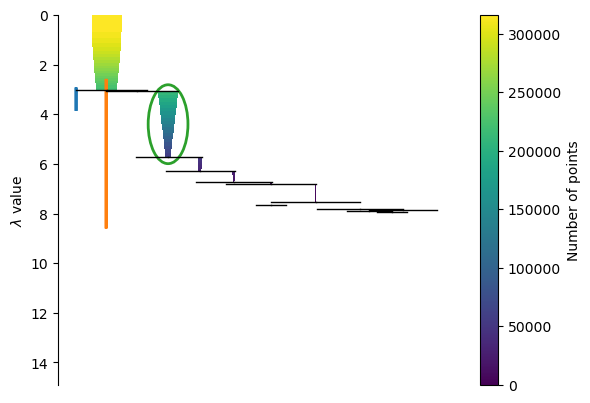

In [48]:
HDBSCAN_Cluster_clusterer.condensed_tree_.plot(select_clusters=True, selection_palette = sns.color_palette())
#plt.ylim(3,0)
#plt.xlim(-1000,30000)

plt.tight_layout
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/xxx.pdf")
plt.show()

# Gaussian Mixture Models (GMM)

In [49]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm
from sklearn.mixture import GaussianMixture
from matplotlib.patches import Ellipse
from matplotlib.colors import LogNorm
from scipy.spatial.distance import mahalanobis

### These are for scaling the parameter space, however a normal Standart Score is enough
from sklearn.preprocessing import RobustScaler

import warnings
warnings.filterwarnings("ignore")

## Execute GMM

In [50]:
##===== Pepare Data =====##
##Define the parameters you want to use for the model
#GMM_Data_TBC = ["pmRA", "pmDE", "Plx"]
GMM_Data_TBC = ["pmRA", "pmDE", "Plx", "RA_ICRS", "DE_ICRS"]
#GMM_Data_TBC = ["pmRA", "pmDE", "Plx", "dx_arcmin", "dy_arcmin"]

##===== Abbriviations =====##
# region Abbriviations
    # GMM   - Gaussian Mixture Model
    # TBC   - To Be Considered
    # PS    - Parameter Selection
    # CL    - Cluster Labels
# endregion

##===== Notes =====##
# region Notes
    # n_components  - #of gaussian distribution the model should work with
        # Must be >= 2, if GMM should find new membership, as with = 1 it just would assume that it is only
        # one cluster, and calcualte the probabilities
    # n_init        - #of walkers with different starting points, that explore the space and look for the best "fit"

    #np.argmin(...) - the function basically looks through the covariance matricies of the GMM run and computes the
    #                   the determinant of each matrix (basically it evaluates the Volume of each component)
    #                   The output is then the index of the component with the smallest volume (higher density)
# endregion

##===== Note: GMM Proba. Assignment =====##
# region
    # The GMM assigns the probabilities two both components, not knowing which one is eg. the field star or cluster.
    # Thus, when calling the probable cluster based on the lowest determinante, it basically assigns then the prob. based on this compnent
    # Important to know is, that is always sums up to 1 eg. P=0.95 for com1 -> P=0.05 for comp0.
        # Thus, if p>0.6 does not show the "cluster", maybe the system got the components mixed, so you would need to call p<0.4 to get cluster stars with p>0.6.
# endregion

In [487]:
##=============================##
##===== Running the Model =====##
##=============================##

##=== Prepare data + scale ===##
GMM_Cluster_PS = dsHDBSCAN_Cluster[GMM_Data_TBC].copy()
#GMM_Cluster_PS = (GMM_Cluster_PS - GMM_Cluster_PS.median()) / GMM_Cluster_PS.std()

##=== Fit GMM ===##
# Set Convariance type: "tied", "full", "diag", or "spherical"
cov_type = "full"
GMM_Cluster_clusterer = GaussianMixture(n_components = 2, n_init = 1000, covariance_type=cov_type).fit(GMM_Cluster_PS)

##=== Predict + extract labels and Probabilities ===##
GMM_Cluster_CL = GMM_Cluster_clusterer.predict(GMM_Cluster_PS)
GMM_Cluster_prob = GMM_Cluster_clusterer.predict_proba(GMM_Cluster_PS)

##=== Indentify denser component ===##
##Determine, which component is your main cluster by "density"
# Assumption: Membership Cluster has a higher density aka. lower covariance
if cov_type == "full":
    # Each covariance is a full matrix
    densities = [np.linalg.det(cov) for cov in GMM_Cluster_clusterer.covariances_]
elif cov_type == "diag":
    # Each covariance is a 1D array of variances
    densities = [np.prod(cov) for cov in GMM_Cluster_clusterer.covariances_]
elif cov_type == "tied":
    # Shared covariance matrix for all components
    # Use weights as proxy for density
    densities = [w for w in GMM_Cluster_clusterer.weights_]
else:
    # Fallback for spherical or unknown types
    densities = [np.prod([cov]) for cov in GMM_Cluster_clusterer.covariances_]

GMM_Cluster_CComp = np.argmin(densities)
#GMM_Cluster_CComp = np.argmax(densities)
GMM_Cluster_MemberProbabilities = GMM_Cluster_prob[:, GMM_Cluster_CComp]

##=== Assign Labels + Probabilities to DataSet ===##
dsHDBSCAN_Cluster["GMM_MembProb"] = GMM_Cluster_MemberProbabilities
dsHDBSCAN_Cluster["GMM_labels"] = GMM_Cluster_CL

print(f"Selected component: {GMM_Cluster_CComp}")
print("Columns in dataset:", dsHDBSCAN_Cluster.columns.tolist())


Selected component: 1
Columns in dataset: ['_r', '_RAJ2000', '_DEJ2000', 'RA_ICRS', 'e_RA_ICRS', 'DE_ICRS', 'e_DE_ICRS', 'Source', 'Plx', 'e_Plx', 'PM', 'pmRA', 'e_pmRA', 'pmDE', 'e_pmDE', 'RUWE', 'FG', 'e_FG', 'Gmag', 'e_Gmag', 'FBP', 'e_FBP', 'BPmag', 'e_BPmag', 'FRP', 'e_FRP', 'RPmag', 'e_RPmag', 'BP-RP', 'RVDR2', 'e_RVDR2', 'Tefftemp', 'loggtemp', 'PS1', 'SDSSDR13', 'SkyMapper2', 'URAT1', 'GmagCorr', 'e_GmagCorr', 'FGCorr', 'RAJ2000', 'DEJ2000', 'Lum-Flame', 'Teff', 'logTeff', 'RVcormerg', 'e_RVcormerg', 's_RVcormerg', 'rel_error_Gmag', 'e_BP_RP', 'rel_error_BP_RP', 'AbsMag', 'e_AbsMag', 'RUWE_hardlabel', 'RUWE_bin_RawData', 'dx_arcmin', 'dy_arcmin', 'HDBSCAN_labels', 'RUWE_bin_HDBSCAN', 'GMM_MembProb', 'GMM_labels', 'BGMM_MembProb', 'BGMM_labels']


In [488]:
##===== Define possible members =====##
##Refine membership based on member probabilities
GMM_Cluster_NonMembers = dsHDBSCAN_Cluster[dsHDBSCAN_Cluster["GMM_MembProb"] < 0.2]
GMM_Cluster_ModerateMembers = dsHDBSCAN_Cluster.query("0.2 <= GMM_MembProb < 0.6")
GMM_Cluster_HighMembers = dsHDBSCAN_Cluster[dsHDBSCAN_Cluster["GMM_MembProb"] >= 0.70]
GMM_Cluster_MegaHighMembers = dsHDBSCAN_Cluster[dsHDBSCAN_Cluster["GMM_MembProb"] >= 0.90]

print("DataSet Components:", GMM_Cluster_HighMembers.columns.tolist())

print("NonMembers:", len(GMM_Cluster_NonMembers), "\nModerateMembers:", len(GMM_Cluster_ModerateMembers), "\nHighMembers:", len(GMM_Cluster_HighMembers), "\nMegaHighMembers:",len(GMM_Cluster_MegaHighMembers))
print(dsHDBSCAN_Cluster.shape)

DataSet Components: ['_r', '_RAJ2000', '_DEJ2000', 'RA_ICRS', 'e_RA_ICRS', 'DE_ICRS', 'e_DE_ICRS', 'Source', 'Plx', 'e_Plx', 'PM', 'pmRA', 'e_pmRA', 'pmDE', 'e_pmDE', 'RUWE', 'FG', 'e_FG', 'Gmag', 'e_Gmag', 'FBP', 'e_FBP', 'BPmag', 'e_BPmag', 'FRP', 'e_FRP', 'RPmag', 'e_RPmag', 'BP-RP', 'RVDR2', 'e_RVDR2', 'Tefftemp', 'loggtemp', 'PS1', 'SDSSDR13', 'SkyMapper2', 'URAT1', 'GmagCorr', 'e_GmagCorr', 'FGCorr', 'RAJ2000', 'DEJ2000', 'Lum-Flame', 'Teff', 'logTeff', 'RVcormerg', 'e_RVcormerg', 's_RVcormerg', 'rel_error_Gmag', 'e_BP_RP', 'rel_error_BP_RP', 'AbsMag', 'e_AbsMag', 'RUWE_hardlabel', 'RUWE_bin_RawData', 'dx_arcmin', 'dy_arcmin', 'HDBSCAN_labels', 'RUWE_bin_HDBSCAN', 'GMM_MembProb', 'GMM_labels', 'BGMM_MembProb', 'BGMM_labels']
NonMembers: 332 
ModerateMembers: 87 
HighMembers: 658 
MegaHighMembers: 503
(1114, 63)


### RUWE evaluation

In [479]:
# ===== RUWE Bins =====##
##Count objects in each bin
bin_counts_GMM_HM = GMM_Cluster_HighMembers["RUWE_bin_HDBSCAN"].value_counts().sort_index()

# Add count of RUWE > 2.0 and RUWE between 0.0 and 1.0
#RUWE_ge_2_GMM_HM = (GMM_Cluster_HighMembers["RUWE"] > 2.0).sum()
#RUWE_ge_0_GMM_HM = ((GMM_Cluster_HighMembers["RUWE"] > 0.0) & (GMM_Cluster_HighMembers["RUWE"] <= 1.0)).sum()


# Access existing bins directly
RUWE_ge_0_GMM_HM = bin_counts_GMM_HM.get("0.0 < x ≤ 1.0", 0)
RUWE_ge_2_GMM_HM = bin_counts_GMM_HM.get("x > 2.0", 0)

print(bin_counts_GMM_HM)
#print("RUWE between 0.0 and 1.0:", RUWE_ge_0_GMM_HM)
#print("RUWE greater than 2.0:", RUWE_ge_2_GMM_HM)


RUWE_bin_HDBSCAN
0.0 < x ≤ 1.0    165
1.0 < x ≤ 1.1    358
1.1 < x ≤ 1.2     63
1.2 < x ≤ 1.3     11
1.3 < x ≤ 1.4     11
1.4 < x ≤ 1.5     10
1.5 < x ≤ 1.6      6
1.6 < x ≤ 1.7      1
1.7 < x ≤ 1.8      5
1.8 < x ≤ 1.9      3
1.9 < x ≤ 2.0      2
x > 2.0           18
Name: count, dtype: int64


In [480]:
##===== RUWE evaluation =====##
# region
NUMBER_Binaries_HDBSCAN = (GMM_Cluster_HighMembers["RUWE_hardlabel"] == "B").sum()
print(f"Number of binary canidates: {NUMBER_Binaries_HDBSCAN}")

GMM_Cluster_HighMembers_binaries = GMM_Cluster_HighMembers[GMM_Cluster_HighMembers["RUWE_hardlabel"] == "B"]
print(f"Shape of extracted binaries: {GMM_Cluster_HighMembers_binaries.shape}")

GMM_Cluster_HighMembers_nonBinaries = GMM_Cluster_HighMembers[GMM_Cluster_HighMembers["RUWE_hardlabel"] == "S"]
print(f"Shape of non Binaries included: {GMM_Cluster_HighMembers_nonBinaries.shape}")
# endregion

print(GMM_Cluster_HighMembers.columns.tolist())

Number of binary canidates: 45
Shape of extracted binaries: (45, 63)
Shape of non Binaries included: (608, 63)
['_r', '_RAJ2000', '_DEJ2000', 'RA_ICRS', 'e_RA_ICRS', 'DE_ICRS', 'e_DE_ICRS', 'Source', 'Plx', 'e_Plx', 'PM', 'pmRA', 'e_pmRA', 'pmDE', 'e_pmDE', 'RUWE', 'FG', 'e_FG', 'Gmag', 'e_Gmag', 'FBP', 'e_FBP', 'BPmag', 'e_BPmag', 'FRP', 'e_FRP', 'RPmag', 'e_RPmag', 'BP-RP', 'RVDR2', 'e_RVDR2', 'Tefftemp', 'loggtemp', 'PS1', 'SDSSDR13', 'SkyMapper2', 'URAT1', 'GmagCorr', 'e_GmagCorr', 'FGCorr', 'RAJ2000', 'DEJ2000', 'Lum-Flame', 'Teff', 'logTeff', 'RVcormerg', 'e_RVcormerg', 's_RVcormerg', 'rel_error_Gmag', 'e_BP_RP', 'rel_error_BP_RP', 'AbsMag', 'e_AbsMag', 'RUWE_hardlabel', 'RUWE_bin_RawData', 'dx_arcmin', 'dy_arcmin', 'HDBSCAN_labels', 'RUWE_bin_HDBSCAN', 'GMM_MembProb', 'GMM_labels', 'BGMM_MembProb', 'BGMM_labels']


#### Visualization

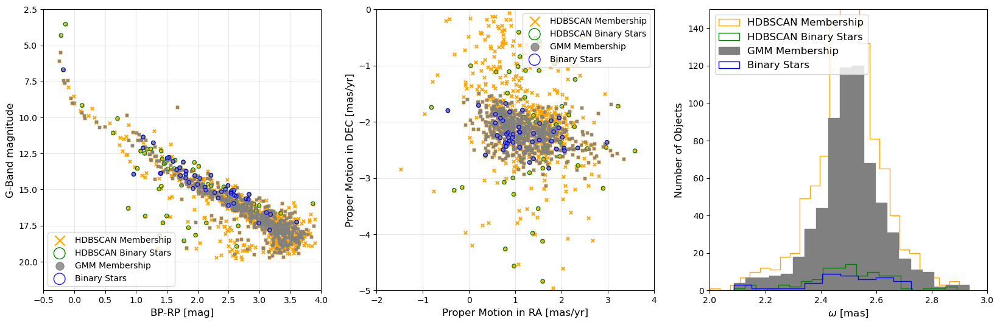

In [481]:
fig, axes = plt.subplots(1, 3, figsize = (20, 6))

##First Plot
# region First Plot
axes[0].scatter(dsHDBSCAN_Cluster["BP-RP"], dsHDBSCAN_Cluster["Gmag"], marker = "x", s = 15, color = "orange", edgecolor = "ornage", alpha = 1, label = "HDBSCAN Membership")
axes[0].scatter(dsHDBSCAN_Cluster_binaries["BP-RP"], dsHDBSCAN_Cluster_binaries["Gmag"], marker = "o", s = 20, facecolor = "none", edgecolor = "green", alpha = 1, label = "HDBSCAN Binary Stars")
axes[0].scatter(GMM_Cluster_HighMembers["BP-RP"], GMM_Cluster_HighMembers["Gmag"], marker = "o", s = 10, color = "gray", edgecolor = "gray", alpha = 0.8, label = "GMM Membership")
axes[0].scatter(GMM_Cluster_HighMembers_binaries["BP-RP"], GMM_Cluster_HighMembers_binaries["Gmag"], marker = "o", s = 20, facecolor = "none", edgecolor = "blue", alpha = 0.9, label = "Binary Stars")

axes[0].set_xlabel("BP-RP [mag]", size = 12)
axes[0].set_ylabel("G-Band magnitude", size = 12)
#axes[0].set_title("CMD", size = 12)
axes[0].set_xlim(-0.5, 4)
axes[0].set_ylim(2.5, 22)
#axes[0].set_xticks(np.arange(0.5, 3.0, 0.5))
#axes[0].set_yticks(np.arange(9.0, 20.0, 2))
axes[0].tick_params(axis = "both", labelsize = 10)
axes[0].invert_yaxis()
axes[0].legend(prop = {"size": 10}, loc = "lower left", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[0].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Second Plot
# region Second Plot
axes[1].scatter(dsHDBSCAN_Cluster["pmRA"], dsHDBSCAN_Cluster["pmDE"], marker = "x", s = 15, color = "orange", edgecolor = "ornage", alpha = 1, label = "HDBSCAN Membership")
axes[1].scatter(dsHDBSCAN_Cluster_binaries["pmRA"], dsHDBSCAN_Cluster_binaries["pmDE"], marker = "o", s = 20, facecolor = "none", edgecolor = "green", alpha = 1, label = "HDBSCAN Binary Stars")
axes[1].scatter(GMM_Cluster_HighMembers["pmRA"], GMM_Cluster_HighMembers["pmDE"], marker = "o", s = 10, color = "gray", edgecolor = "gray", alpha = 0.8, label = "GMM Membership")
axes[1].scatter(GMM_Cluster_HighMembers_binaries["pmRA"], GMM_Cluster_HighMembers_binaries["pmDE"], marker = "o", s = 20, facecolor = "none", edgecolor = "blue", alpha = 0.9, label = "Binary Stars")

axes[1].set_xlabel("Proper Motion in RA [mas/yr]", fontsize = 12)
axes[1].set_ylabel("Proper Motion in DEC [mas/yr]", fontsize = 12)
axes[1].set_xlim(-2, 4)
axes[1].set_ylim(0, -5)
#axes[1].set_xticks(np.arange(16, 26, 2))
#axes[1].set_yticks(np.arange(-54, -30, 3))
axes[1].invert_yaxis()

axes[1].tick_params(axis = "both", labelsize = 10)
axes[1].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[1].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Third Plot
# region Thrid Plot
axes[2].hist(dsHDBSCAN_Cluster["Plx"], bins = 30, histtype = "step" , color = "orange", edgecolor = "orange", zorder = 0, label = "HDBSCAN Membership")
axes[2].hist(dsHDBSCAN_Cluster_binaries["Plx"], bins = 20, histtype = "step", color = "green", edgecolor = "green", zorder = 2, label = "HDBSCAN Binary Stars")
axes[2].hist(GMM_Cluster_HighMembers["Plx"], bins = 20, color = "gray", edgecolor = "gray", zorder = 1, label = "GMM Membership")
axes[2].hist(GMM_Cluster_HighMembers_binaries["Plx"], bins = 10, histtype = "step", facecolor = "none", edgecolor = "blue", zorder = 2, label = "Binary Stars")

axes[2].set_xlabel(r"$\omega$ [mas]", size = 12)
axes[2].set_ylabel("Number of Objects", size = 12)

axes[2].legend(prop={"size": 12}, loc ="upper left", ncol = 1)
axes[2].tick_params(axis="both", labelsize=10)

##Set limit to x- and y-axis (to zoom in)
axes[2].set_xlim(2, 3)
axes[2].set_ylim(0, 150)
#axes[2].set_xticks(np.arange(6.25, 8.75, 0.25))
#axes[2].set_yticks(np.arange(0, 250, 50))
# endregion

plt.tight_layout
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/xxx.pdf")
plt.show()

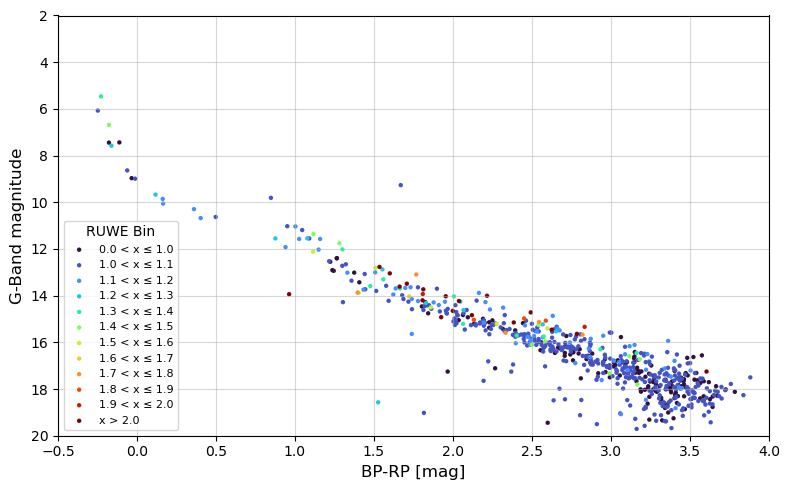

In [482]:
##===== RUWE Bins Ranges =====##
##Define bins
PLT_RUWE_bins_GMM_HM = np.concatenate(([0.0], np.arange(1.0, 2.1, 0.1), [np.inf]))
PLT_RUW_labels = (
    ["0.0 < x ≤ 1.0"] +
    [f"{PLT_RUWE_bins_GMM_HM[i]:.1f} < x ≤ {PLT_RUWE_bins_GMM_HM[i+1]:.1f}" for i in range(1, len(PLT_RUWE_bins_GMM_HM)-2)] +
    ["x > 2.0"]
)

##Assign bins to RUWE values
dsHDBSCAN_Cluster["RUWE_bin_HDBSCAN"] = pd.cut(dsHDBSCAN_Cluster["RUWE"], bins = PLT_RUWE_bins_GMM_HM, labels = PLT_RUW_labels, include_lowest = True, right = True)

# Sort bins for plotting
PLT_RUWE_bins_GMM_HM_sorted = [label for label in PLT_RUW_labels if label in GMM_Cluster_HighMembers["RUWE_bin_HDBSCAN"].unique()]
colors = cm.turbo(np.linspace(0, 1, len(PLT_RUWE_bins_GMM_HM_sorted)))

# Start the plot
plt.figure(figsize=(8, 5))

# Loop through each bin and plot
for i, ruwe_bin in enumerate(PLT_RUWE_bins_GMM_HM_sorted):
    subset = GMM_Cluster_HighMembers[GMM_Cluster_HighMembers["RUWE_bin_HDBSCAN"] == ruwe_bin]
    plt.scatter(
        subset["BP-RP"], subset["Gmag"],
        color=colors[i], s = 10, alpha = 1.0, edgecolor = 'none', label = ruwe_bin
    )

# Axes and labels
plt.xlabel("BP-RP [mag]", size=12)
plt.ylabel("G-Band magnitude", size=12)
plt.xlim(-0.5, 4.0)
plt.ylim(2, 20)
plt.gca().invert_yaxis()
plt.tick_params(axis = "both", labelsize = 10)
plt.grid(True, linestyle = "-", alpha = 0.5)

# Legend
plt.legend(title = "RUWE Bin", prop = {"size": 8}, loc = "lower left")

plt.tight_layout()
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_Pleiades/Figures/xxx.pdf")
plt.show()


### Examine GMM results

#### Component Ellipses

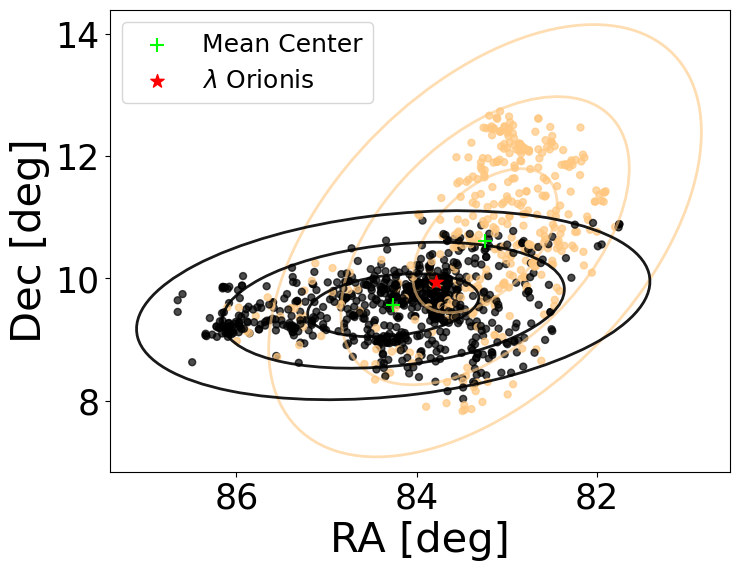

In [508]:
##===== Universal covariance extractor =====##
# region
def get_covariance_matrix(covariances, cov_type, component_index, n_features):
    if cov_type == "full":
        return covariances[component_index]
    elif cov_type == "diag":
        return np.diag(covariances[component_index])
    elif cov_type == "tied":
        return covariances  # shared full matrix
    elif cov_type == "spherical":
        return np.eye(n_features) * covariances[component_index]
    else:
        raise ValueError(f"Unsupported covariance type: {cov_type}")

# === Ellipse drawer
def draw_ellipse(position, covariance, ax=None, dims=(3,4), **kwargs):
    ax = ax or plt.gca()
    position = np.asarray(position); covariance = np.asarray(covariance)
    sub_pos = position[list(dims)]
    sub_cov = covariance[np.ix_(dims, dims)]
    U, s, _ = np.linalg.svd(sub_cov)
    angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
    width, height = 2 * np.sqrt(s)    # 1-sigma
    for nsig in (1, 2, 3):
        ax.add_patch(Ellipse(
            xy=(sub_pos[0], sub_pos[1]),
            width=nsig * width,
            height=nsig * height,
            angle=angle,
            fill=False, lw=2, **kwargs))

# === Extract values from your pipeline
# region
Ellipses_values      = GMM_Cluster_PS.values
Ellipses_labels      = GMM_Cluster_CL
Ellipses_member_prob = GMM_Cluster_MemberProbabilities
Ellipses_means       = GMM_Cluster_clusterer.means_
Ellipses_covariances = GMM_Cluster_clusterer.covariances_
Ellipses_weights     = GMM_Cluster_clusterer.weights_
CONF                 = 0.99
member_comp          = GMM_Cluster_CComp
core_mask            = Ellipses_member_prob > CONF
n_features           = GMM_Cluster_PS.shape[1]
# endregion
# === Choose RA–Dec column indices (adjust if needed)
ra_idx, dec_idx = 3, 4

# === Plot
fig, ax = plt.subplots(figsize=(8, 6))
cmap = cm.get_cmap("copper_r", GMM_Cluster_clusterer.n_components)

# Plot all points colored by GMM label
ax.scatter(Ellipses_values[:, ra_idx], Ellipses_values[:, dec_idx],
           c=Ellipses_labels, s=25, cmap=cmap, alpha=0.7)

# Overlay core members (p > CONF)
#ax.scatter(Ellipses_values[core_mask, ra_idx], Ellipses_values[core_mask, dec_idx],
#           facecolor='none', edgecolor='black', s=80, linewidth=1.2,
#           label=f"Core p>{CONF:.2f} (comp {member_comp})")

# Draw ellipses and centers
for k in range(GMM_Cluster_clusterer.n_components):
    if Ellipses_weights[k] < 1e-3:
        continue
    color = cmap(k)
    cov = get_covariance_matrix(Ellipses_covariances, cov_type, k, n_features)
    draw_ellipse(Ellipses_means[k], cov, ax=ax, dims=(ra_idx, dec_idx),
                 edgecolor=color, alpha=0.9 if k == member_comp else 0.6)
    ax.scatter(Ellipses_means[k][ra_idx], Ellipses_means[k][dec_idx],
               color="lime", marker="+", s=100,
               label="Mean Center" if k == member_comp else None, zorder = 3)
ax.scatter(083.78449673651, 09.93415011072, facecolor = "red", edgecolors='red', s=100, marker = "*", zorder = 5, label = "$\lambda$ Orionis")


#ax.set_xlabel(r"$\alpha$ [deg]", fontsize = 20)
ax.set_xlabel("RA [deg]", fontsize = 30)
#ax.set_ylabel(r"$\beta$ [deg]", fontsize = 20)
ax.set_ylabel("Dec [deg]", fontsize = 30)

ax.tick_params(axis = "both", labelsize = 25)
#ax.set_xlim(-4, 4)
#ax.set_ylim(7, 13)
#ax.set_xticks(np.arange(-4, 4, 1))
#ax.set_yticks(np.arange(7.5, 13, 1))

ax.legend(prop = {"size": 18}, loc = "upper left", scatterpoints = 1, markerscale = 1, fontsize = 20)
ax.invert_xaxis()

# endregion
#plt.tight_layout()
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/LORI_GMMEllipses_v2.pdf", bbox_inches = "tight")
plt.show()


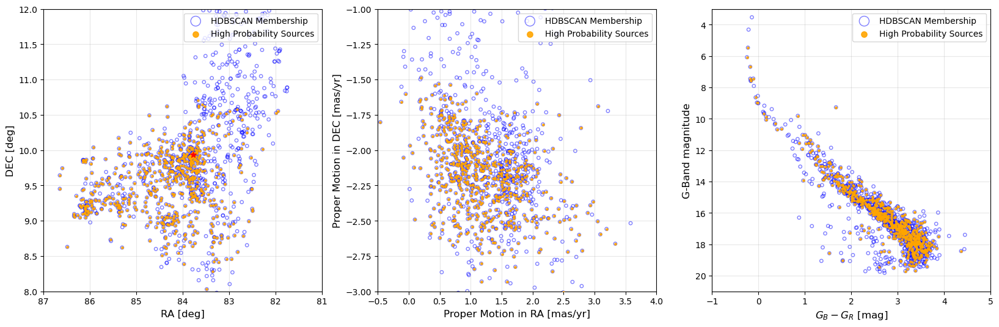

In [58]:
##===== Position + PM + CMD Plot =====##
# region
fig, axes = plt.subplots(1, 3, figsize = (20, 6))

##First Plot
# region First Plot
#axes[0].scatter(ds_LORI["_RAJ2000"], ds_LORI["_DEJ2000"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Original Soruce Data")
axes[0].scatter(dsHDBSCAN_Cluster["_RAJ2000"], dsHDBSCAN_Cluster["_DEJ2000"], marker = "o", s = 15, color = "none", edgecolor = "blue", alpha = 0.5, zorder = 1, label = "HDBSCAN Membership")
axes[0].scatter(GMM_Cluster_HighMembers["_RAJ2000"], GMM_Cluster_HighMembers["_DEJ2000"], marker = "o", s = 5, color = "orange", edgecolor = "orange", alpha = 0.9, zorder = 2, label = "High Probability Sources")
axes[0].scatter(083.78449673651, 09.93415011072, facecolor = "red", edgecolors='red', s=50, marker = "*", zorder = 5)


axes[0].set_xlabel("RA [deg]", fontsize = 12)
axes[0].set_ylabel("DEC [deg]", fontsize = 12)
axes[0].set_xlim(87, 81)
axes[0].set_ylim(12, 8)
#axes[0].set_xticks(np.arange(3500, 6000, 500))
#axes[0].set_yticks(np.arange(2, 8, 1))
axes[0].invert_yaxis()

axes[0].tick_params(axis = "both", labelsize = 10)
axes[0].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[0].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Second Plot
# region Second Plot
#axes[1].scatter(ds_LORI["pmRA"], ds_LORI["pmDE"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Original Source Data")
axes[1].scatter(dsHDBSCAN_Cluster["pmRA"], dsHDBSCAN_Cluster["pmDE"], marker = "o", s = 15, facecolor = "none", edgecolor = "blue", alpha = 0.5, zorder = 1, label = "HDBSCAN Membership")
axes[1].scatter(GMM_Cluster_HighMembers["pmRA"], GMM_Cluster_HighMembers["pmDE"], marker = "o", s = 5, facecolor = "orange", edgecolor = "orange", alpha = 0.9, zorder = 3, label = "High Probability Sources")

axes[1].set_xlabel("Proper Motion in RA [mas/yr]", fontsize = 12)
axes[1].set_ylabel("Proper Motion in DEC [mas/yr]", fontsize = 12)
axes[1].set_xlim(-0.5, 4)
axes[1].set_ylim(-1, -3)
#axes[1].set_xticks(np.arange(3500, 6000, 500))
#axes[1].set_yticks(np.arange(2, 8, 1))
axes[1].invert_yaxis()

axes[1].tick_params(axis = "both", labelsize = 10)
axes[1].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[1].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Third Plot
# region Thrid Plot
#axes[2].scatter(ds_LORI["BP-RP"], ds_LORI["Gmag"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Origianl Source Data")
axes[2].scatter(dsHDBSCAN_Cluster["BP-RP"], dsHDBSCAN_Cluster["Gmag"], marker = "o", s = 15, color = "none", edgecolor = "blue", alpha = 0.5, zorder = 1, label = "HDBSCAN Membership")
axes[2].scatter(GMM_Cluster_HighMembers["BP-RP"], GMM_Cluster_HighMembers["Gmag"], marker = "o", s = 5, color = "orange", edgecolor = "orange", alpha = 0.9, zorder = 2, label = "High Probability Sources")

axes[2].set_xlabel(r"$G_B - G_R$ [mag]", size = 12)
axes[2].set_ylabel("G-Band magnitude", size = 12)
axes[2].set_xlim(-1, 5)
axes[2].set_ylim(3, 21)
#axes[2].set_xticks(np.arange(0.5, 3.0, 0.5))
#axes[2].set_yticks(np.arange(8, 20, 2))
axes[2].invert_yaxis()

axes[2].tick_params(axis = "both", labelsize = 10)
axes[2].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[2].grid(True, linestyle = "-", alpha = 0.3)
# endregion

# endregion
plt.tight_layout
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/xxx.pdf")
plt.show()

#### Density estimation and Mahalanobis Distance

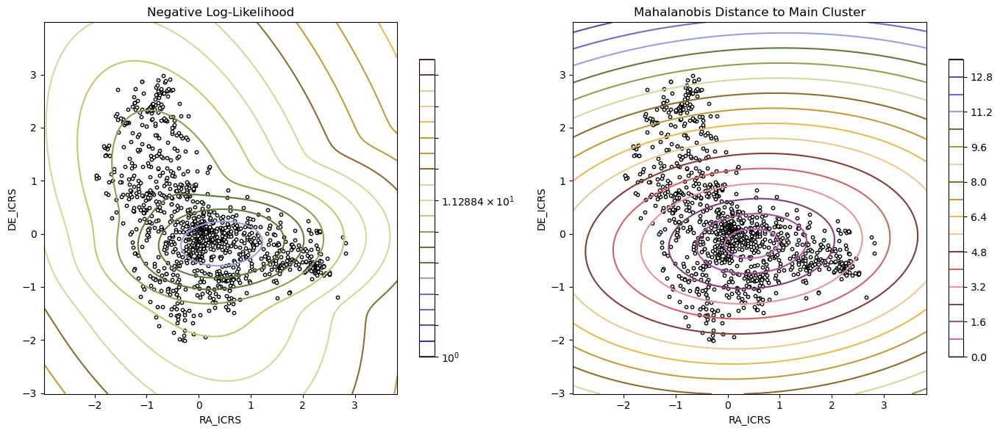

In [59]:
##===== Density Estimation and Mahalanobis Distance =====##
# #Columns for 2D visualization
x_col = GMM_Cluster_PS.columns[3]
y_col = GMM_Cluster_PS.columns[4]
other_cols = [c for c in GMM_Cluster_PS.columns if c not in [x_col, y_col]]

# Grid for plotting
x = np.linspace(GMM_Cluster_PS[x_col].min() - 1, GMM_Cluster_PS[x_col].max() + 1, 200)
y = np.linspace(GMM_Cluster_PS[y_col].min() - 1, GMM_Cluster_PS[y_col].max() + 1, 200)
X, Y = np.meshgrid(x, y)
grid = np.zeros((X.size, GMM_Cluster_PS.shape[1]))
grid[:, GMM_Cluster_PS.columns.get_loc(x_col)] = X.ravel()
grid[:, GMM_Cluster_PS.columns.get_loc(y_col)] = Y.ravel()
for col in other_cols:
    grid[:, GMM_Cluster_PS.columns.get_loc(col)] = GMM_Cluster_PS[col].median()

# Negative log-likelihood
nll = -GMM_Cluster_clusterer.score_samples(grid).reshape(X.shape)

# Mahalanobis distance to main cluster
mu_main = GMM_Cluster_clusterer.means_[GMM_Cluster_CComp]
cov_main = GMM_Cluster_clusterer.covariances_[GMM_Cluster_CComp]
inv_cov_main = np.linalg.inv(cov_main)
mahal_dist = np.array([mahalanobis(point, mu_main, inv_cov_main) for point in grid]).reshape(X.shape)

# Plot side-by-side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Negative log-likelihood
CS1 = axes[0].contour(X, Y, nll, norm=LogNorm(vmin=1.0, vmax=1000.0), levels=np.logspace(0, 2, 20), cmap="tab20b")
fig.colorbar(CS1, ax=axes[0], shrink=0.8)
axes[0].scatter(GMM_Cluster_PS[x_col], GMM_Cluster_PS[y_col], s=10, c='white', edgecolor='k')
#axes[0].scatter(083.78449673651, 09.93415011072, facecolor = "red", edgecolors='red', s=50, marker = "*", zorder = 5)
axes[0].set_title("Negative Log-Likelihood")
axes[0].set_xlabel(x_col)
axes[0].set_ylabel(y_col)

# Mahalanobis distance
CS2 = axes[1].contour(X, Y, mahal_dist, levels=20, cmap='tab20b_r')
fig.colorbar(CS2, ax=axes[1], shrink=0.8)
axes[1].scatter(GMM_Cluster_PS[x_col], GMM_Cluster_PS[y_col], s=10, c='white', edgecolor='k')
axes[1].set_title("Mahalanobis Distance to Main Cluster")
#axes[1].scatter(083.78449673651, 09.93415011072, facecolor = "red", edgecolors='red', s=50, marker = "*", zorder = 5)
axes[1].set_xlabel(x_col)
axes[1].set_ylabel(y_col)

plt.tight_layout()
plt.show()


## Visualization GMM

### Membership Selection (Compnents)

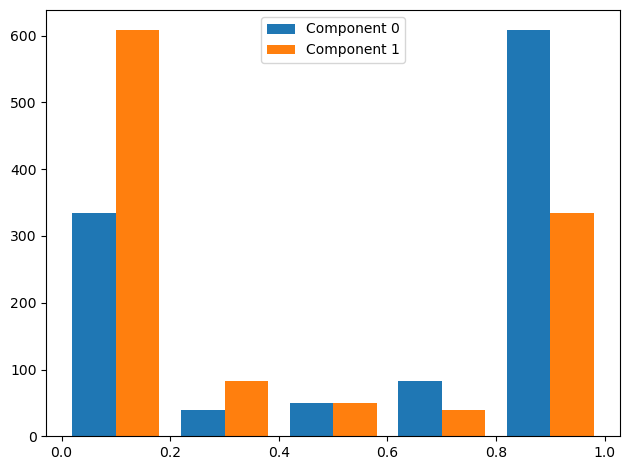

In [60]:
plt.hist([GMM_Cluster_prob[:, 0], GMM_Cluster_prob[:, 1]], bins = 5, label=["Component 0", "Component 1"])
plt.legend()
plt.tight_layout()
plt.show()

### Memership Probabilties (pm Spcae)

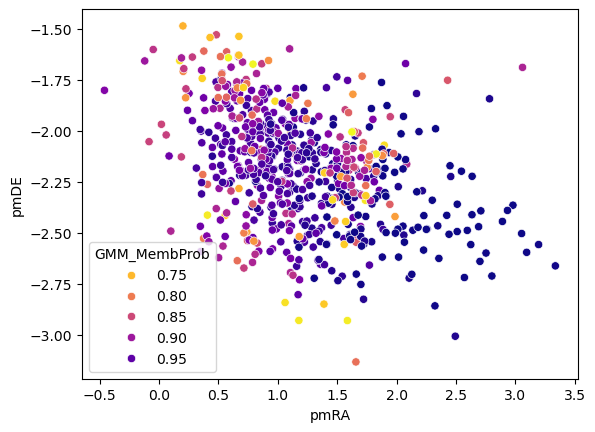

In [61]:
palette = sns.color_palette("plasma_r", as_cmap=True)
sns.scatterplot(x="pmRA", y="pmDE", palette = palette, hue = "GMM_MembProb", data = GMM_Cluster_HighMembers[GMM_Cluster_HighMembers.GMM_MembProb > 0.2])
plt.show()


## Bayesian GMM

In [62]:
from sklearn.mixture import BayesianGaussianMixture
import numpy as np

##=== Prepare data + scale ===##
BGM_Cluster_PS = dsHDBSCAN_Cluster[GMM_Data_TBC].copy()
BGM_Cluster_PS = (BGM_Cluster_PS - BGM_Cluster_PS.median()) / BGM_Cluster_PS.std()

##=== Fit Bayesian GMM ===##
cov_type = "diag"
BGM_clusterer = BayesianGaussianMixture(
    n_components=2,
    covariance_type=cov_type,
    weight_concentration_prior_type="dirichlet_process",
    weight_concentration_prior=0.3,
    max_iter=1000,
    reg_covar=1e-6,
    init_params="kmeans",
    random_state=42
).fit(BGM_Cluster_PS)

##=== Predict + extract labels and Probabilities ===##
BGM_labels = BGM_clusterer.predict(BGM_Cluster_PS)
BGM_prob = BGM_clusterer.predict_proba(BGM_Cluster_PS)

##=== Identify denser component ===##
if cov_type == "full":
    densities = [np.linalg.det(cov) for cov in BGM_clusterer.covariances_]
elif cov_type == "diag":
    densities = [np.prod(cov) for cov in BGM_clusterer.covariances_]
elif cov_type == "tied":
    densities = [w for w in BGM_clusterer.weights_]
else:
    densities = [np.prod([cov]) for cov in BGM_clusterer.covariances_]

BGM_CComp = np.argmin(densities)
BGM_MemberProbabilities = BGM_prob[:, BGM_CComp]

##=== Assign Labels + Probabilities to DataSet ===##
dsHDBSCAN_Cluster["BGMM_MembProb"] = BGM_MemberProbabilities
dsHDBSCAN_Cluster["BGMM_labels"] = BGM_labels

print(f"Selected Bayesian component: {BGM_CComp}")
print("Columns in dataset:", dsHDBSCAN_Cluster.columns.tolist())


Selected Bayesian component: 0
Columns in dataset: ['_r', '_RAJ2000', '_DEJ2000', 'RA_ICRS', 'e_RA_ICRS', 'DE_ICRS', 'e_DE_ICRS', 'Source', 'Plx', 'e_Plx', 'PM', 'pmRA', 'e_pmRA', 'pmDE', 'e_pmDE', 'RUWE', 'FG', 'e_FG', 'Gmag', 'e_Gmag', 'FBP', 'e_FBP', 'BPmag', 'e_BPmag', 'FRP', 'e_FRP', 'RPmag', 'e_RPmag', 'BP-RP', 'RVDR2', 'e_RVDR2', 'Tefftemp', 'loggtemp', 'PS1', 'SDSSDR13', 'SkyMapper2', 'URAT1', 'GmagCorr', 'e_GmagCorr', 'FGCorr', 'RAJ2000', 'DEJ2000', 'Lum-Flame', 'Teff', 'logTeff', 'RVcormerg', 'e_RVcormerg', 's_RVcormerg', 'rel_error_Gmag', 'e_BP_RP', 'rel_error_BP_RP', 'AbsMag', 'e_AbsMag', 'RUWE_hardlabel', 'RUWE_bin_RawData', 'dx_arcmin', 'dy_arcmin', 'HDBSCAN_labels', 'RUWE_bin_HDBSCAN', 'GMM_MembProb', 'GMM_labels', 'BGMM_MembProb', 'BGMM_labels']


In [63]:
##===== Define possible members =====##
##Refine membership based on member probabilities
BGMM_Cluster_NonMembers = dsHDBSCAN_Cluster[dsHDBSCAN_Cluster["BGMM_MembProb"] < 0.2]
BGMM_Cluster_ModerateMembers = dsHDBSCAN_Cluster.query("0.2 <= BGMM_MembProb < 0.6")
BGMM_Cluster_HighMembers = dsHDBSCAN_Cluster[dsHDBSCAN_Cluster["BGMM_MembProb"] >= 0.60]
BGMM_Cluster_MegaHighMembers = dsHDBSCAN_Cluster[dsHDBSCAN_Cluster["BGMM_MembProb"] >= 0.7]

print("DataSet Components:", BGMM_Cluster_HighMembers.columns.tolist())

print("NonMembers:", len(BGMM_Cluster_NonMembers), "\nModerateMembers:", len(BGMM_Cluster_ModerateMembers), "\nHighMembers:", len(BGMM_Cluster_HighMembers), "\nMegaHighMembers:",len(BGMM_Cluster_MegaHighMembers))
print(dsHDBSCAN_Cluster.shape)

DataSet Components: ['_r', '_RAJ2000', '_DEJ2000', 'RA_ICRS', 'e_RA_ICRS', 'DE_ICRS', 'e_DE_ICRS', 'Source', 'Plx', 'e_Plx', 'PM', 'pmRA', 'e_pmRA', 'pmDE', 'e_pmDE', 'RUWE', 'FG', 'e_FG', 'Gmag', 'e_Gmag', 'FBP', 'e_FBP', 'BPmag', 'e_BPmag', 'FRP', 'e_FRP', 'RPmag', 'e_RPmag', 'BP-RP', 'RVDR2', 'e_RVDR2', 'Tefftemp', 'loggtemp', 'PS1', 'SDSSDR13', 'SkyMapper2', 'URAT1', 'GmagCorr', 'e_GmagCorr', 'FGCorr', 'RAJ2000', 'DEJ2000', 'Lum-Flame', 'Teff', 'logTeff', 'RVcormerg', 'e_RVcormerg', 's_RVcormerg', 'rel_error_Gmag', 'e_BP_RP', 'rel_error_BP_RP', 'AbsMag', 'e_AbsMag', 'RUWE_hardlabel', 'RUWE_bin_RawData', 'dx_arcmin', 'dy_arcmin', 'HDBSCAN_labels', 'RUWE_bin_HDBSCAN', 'GMM_MembProb', 'GMM_labels', 'BGMM_MembProb', 'BGMM_labels']
NonMembers: 234 
ModerateMembers: 61 
HighMembers: 819 
MegaHighMembers: 802
(1114, 63)


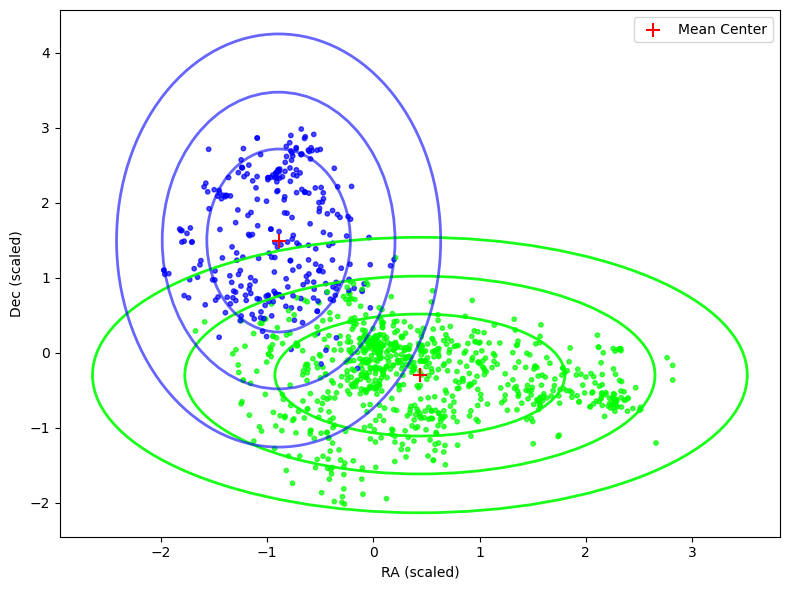

In [64]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from matplotlib import cm
from scipy.stats import chi2

# === Helper function to draw 2D projection of a high-dim. Gaussian ===
def draw_ellipse(position, covariance, ax=None, dims=(0, 1), **kwargs):
    ax = ax or plt.gca()
    position = np.asarray(position)
    covariance = np.asarray(covariance)

    # Defensive reshape if covariance is 1D
    if covariance.ndim == 1:
        covariance = np.diag(covariance)

    sub_pos = position[list(dims)]
    sub_cov = covariance[np.ix_(dims, dims)]

    # SVD for ellipse orientation
    U, s, _ = np.linalg.svd(sub_cov)
    angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
    width, height = 2 * np.sqrt(s)  # 1-sigma scaling

    # Draw ellipses for 1σ, 2σ, 3σ
    for nsig in (1, 2, 3):
        scale = np.sqrt(chi2.ppf(0.68 if nsig == 1 else 0.95 if nsig == 2 else 0.997, df=2))
        ax.add_patch(Ellipse(
            xy=(sub_pos[0], sub_pos[1]),
            width=scale * width,
            height=scale * height,
            angle=angle,
            fill=False, lw=2, **kwargs))

# === Extract data from fitted Bayesian GMM ===
Ellipses_values = BGM_Cluster_PS.values
Ellipses_labels = BGM_labels
Ellipses_member_prob = BGM_MemberProbabilities
Ellipses_means = BGM_clusterer.means_
Ellipses_covariances = BGM_clusterer.covariances_
Ellipses_weights = BGM_clusterer.weights_

CONF = 0.7  # Membership threshold
member_comp = BGM_CComp
core_mask = Ellipses_member_prob > CONF

# === Choose RA–Dec columns (adjust if needed)
ra_idx, dec_idx = 3, 4

# === Plot ===
fig, ax = plt.subplots(figsize=(8, 6))
cmap = cm.get_cmap('brg_r', BGM_clusterer.n_components)

# Stars colored by BGMM label
ax.scatter(Ellipses_values[:, ra_idx], Ellipses_values[:, dec_idx],
           c=Ellipses_labels, s=10, cmap=cmap, alpha=0.7)

# Overlay core members (p > CONF)
#ax.scatter(Ellipses_values[core_mask, ra_idx], Ellipses_values[core_mask, dec_idx],
#           facecolor='none', edgecolor='black', s=80, linewidth=1.2,
#           label=f"Core p>{CONF:.2f} (comp {member_comp})")

# Draw ellipses and cluster centers
for k, (mu, cov, w) in enumerate(zip(Ellipses_means, Ellipses_covariances, Ellipses_weights)):
    if w < 1e-3:
        continue
    color = cmap(k)
    draw_ellipse(mu, cov, ax=ax, dims=(ra_idx, dec_idx),
                 edgecolor=color, alpha=0.9 if k == member_comp else 0.6)
    ax.scatter(mu[ra_idx], mu[dec_idx], color="red", marker="+", s=100,
               label="Mean Center" if k == member_comp else None)

# Final plot settings
ax.set_xlabel("RA (scaled)")
ax.set_ylabel("Dec (scaled)")
ax.legend()
plt.tight_layout()
plt.show()


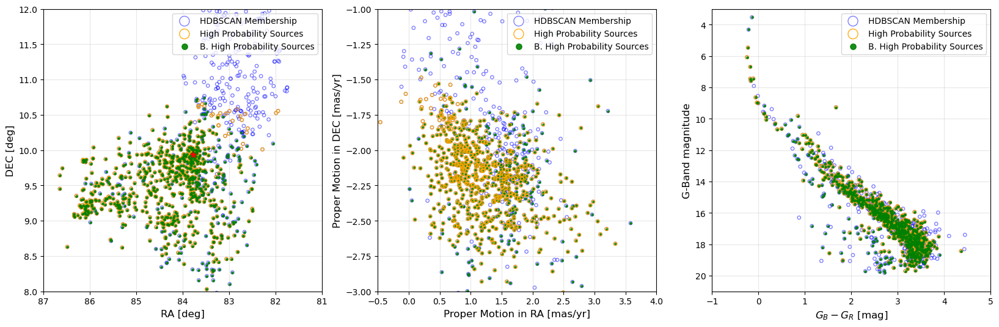

In [65]:
##===== Position + PM + CMD Plot =====##
# region
fig, axes = plt.subplots(1, 3, figsize = (20, 6))

##First Plot
# region First Plot
#axes[0].scatter(ds_LORI["_RAJ2000"], ds_LORI["_DEJ2000"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Original Soruce Data")
axes[0].scatter(dsHDBSCAN_Cluster["_RAJ2000"], dsHDBSCAN_Cluster["_DEJ2000"], marker = "o", s = 15, color = "none", edgecolor = "blue", alpha = 0.5, zorder = 1, label = "HDBSCAN Membership")
axes[0].scatter(GMM_Cluster_HighMembers["_RAJ2000"], GMM_Cluster_HighMembers["_DEJ2000"], marker = "o", s = 15, color = "none", edgecolor = "orange", alpha = 0.9, zorder = 2, label = "High Probability Sources")
axes[0].scatter(BGMM_Cluster_HighMembers["_RAJ2000"], BGMM_Cluster_HighMembers["_DEJ2000"], marker = "o", s = 5, facecolor = "green", edgecolor = "green", alpha = 0.9, zorder = 2, label = "B. High Probability Sources")
axes[0].scatter(083.78449673651, 09.93415011072, facecolor = "red", edgecolors='red', s=50, marker = "*", zorder = 5)


axes[0].set_xlabel("RA [deg]", fontsize = 12)
axes[0].set_ylabel("DEC [deg]", fontsize = 12)
axes[0].set_xlim(87, 81)
axes[0].set_ylim(12, 8)
#axes[0].set_xticks(np.arange(3500, 6000, 500))
#axes[0].set_yticks(np.arange(2, 8, 1))
axes[0].invert_yaxis()

axes[0].tick_params(axis = "both", labelsize = 10)
axes[0].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[0].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Second Plot
# region Second Plot
#axes[1].scatter(ds_LORI["pmRA"], ds_LORI["pmDE"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Original Source Data")
axes[1].scatter(dsHDBSCAN_Cluster["pmRA"], dsHDBSCAN_Cluster["pmDE"], marker = "o", s = 15, facecolor = "none", edgecolor = "blue", alpha = 0.5, zorder = 1, label = "HDBSCAN Membership")
axes[1].scatter(GMM_Cluster_HighMembers["pmRA"], GMM_Cluster_HighMembers["pmDE"], marker = "o", s = 15, facecolor = "none", edgecolor = "orange", alpha = 0.9, zorder = 3, label = "High Probability Sources")
axes[1].scatter(BGMM_Cluster_HighMembers["pmRA"], BGMM_Cluster_HighMembers["pmDE"], marker = "o", s = 5, facecolor = "green", edgecolor = "green", alpha = 0.9, zorder = 2, label = "B. High Probability Sources")

axes[1].set_xlabel("Proper Motion in RA [mas/yr]", fontsize = 12)
axes[1].set_ylabel("Proper Motion in DEC [mas/yr]", fontsize = 12)
axes[1].set_xlim(-0.5, 4)
axes[1].set_ylim(-1, -3)
#axes[1].set_xticks(np.arange(3500, 6000, 500))
#axes[1].set_yticks(np.arange(2, 8, 1))
axes[1].invert_yaxis()

axes[1].tick_params(axis = "both", labelsize = 10)
axes[1].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[1].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Third Plot
# region Thrid Plot
#axes[2].scatter(ds_LORI["BP-RP"], ds_LORI["Gmag"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Origianl Source Data")
axes[2].scatter(dsHDBSCAN_Cluster["BP-RP"], dsHDBSCAN_Cluster["Gmag"], marker = "o", s = 15, color = "none", edgecolor = "blue", alpha = 0.5, zorder = 1, label = "HDBSCAN Membership")
axes[2].scatter(GMM_Cluster_HighMembers["BP-RP"], GMM_Cluster_HighMembers["Gmag"], marker = "o", s = 15, color = "none", edgecolor = "orange", alpha = 0.9, zorder = 2, label = "High Probability Sources")
axes[2].scatter(BGMM_Cluster_HighMembers["BP-RP"], BGMM_Cluster_HighMembers["Gmag"], marker = "o", s = 5, facecolor = "green", edgecolor = "green", alpha = 0.9, zorder = 2, label = "B. High Probability Sources")

axes[2].set_xlabel(r"$G_B - G_R$ [mag]", size = 12)
axes[2].set_ylabel("G-Band magnitude", size = 12)
axes[2].set_xlim(-1, 5)
axes[2].set_ylim(3, 21)
#axes[2].set_xticks(np.arange(0.5, 3.0, 0.5))
#axes[2].set_yticks(np.arange(8, 20, 2))
axes[2].invert_yaxis()

axes[2].tick_params(axis = "both", labelsize = 10)
axes[2].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[2].grid(True, linestyle = "-", alpha = 0.3)
# endregion

# endregion
plt.tight_layout
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/xxx.pdf")
plt.show()

# Analysis (Basic)

## Merged datasets comparison

In [66]:
n_total = len(GMM_Cluster_HighMembers)
n_with_lum = GMM_Cluster_HighMembers["Lum-Flame"].notnull().sum()
n_with_teff = GMM_Cluster_HighMembers["Teff"].notnull().sum()
n_with_both = GMM_Cluster_HighMembers[
    GMM_Cluster_HighMembers["Lum-Flame"].notnull() & 
    GMM_Cluster_HighMembers["Teff"].notnull()
].shape[0]

print(f"Total sources in GMM_Cluster_HighMembers: {n_total}")
print(f"Sources with Lum-Flame: {n_with_lum}")
print(f"Sources with Teff: {n_with_teff}")
print(f"Sources with both Lum-Flame and Teff: {n_with_both}")
print(f"Coverage (both): {n_with_both / n_total:.2%}")


Total sources in GMM_Cluster_HighMembers: 653
Sources with Lum-Flame: 336
Sources with Teff: 367
Sources with both Lum-Flame and Teff: 336
Coverage (both): 51.45%


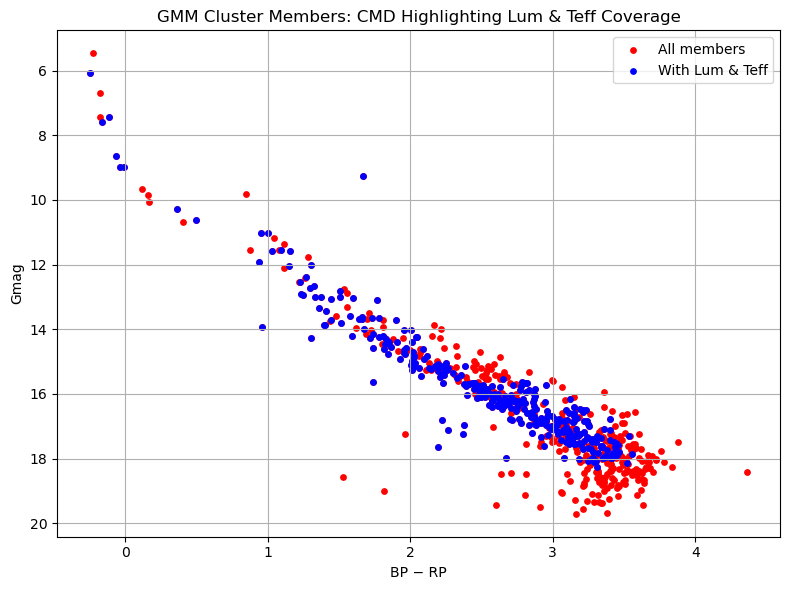

In [67]:
import matplotlib.pyplot as plt

# Define full set
all_members = GMM_Cluster_HighMembers

# Define subset with both Lum-Flame and Teff
subset_with_lum_teff = all_members[
    all_members["Lum-Flame"].notnull() & all_members["Teff"].notnull()
]

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(all_members["BPmag"] - all_members["RPmag"], all_members["Gmag"],
            color="red", s=15, label="All members")
plt.scatter(subset_with_lum_teff["BPmag"] - subset_with_lum_teff["RPmag"],
            subset_with_lum_teff["Gmag"],
            color="blue", s=15, label="With Lum & Teff")

plt.gca().invert_yaxis()  # Brighter stars at top
plt.xlabel("BP − RP")
plt.ylabel("Gmag")
plt.title("GMM Cluster Members: CMD Highlighting Lum & Teff Coverage")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [68]:
dEx_Cluster_HighProbMembers = pd.DataFrame(GMM_Cluster_HighMembers)
dEx_Cluster_HighProbMembers.to_csv(r"C:\Users\lenna\Documents\Bachelor_Thesis\Preperation_LORI\LORI_HighProbMembers.csv", index=False)

## *Literature Data*

In [69]:
from astropy.table import Table
from astropy.io import fits
import pandas as pd
import numpy as np

In [70]:
##===== Load Literture Data =====##
##Paths
# region
Gao2019              = r"C:\Users\lenna\Documents\Bachelor_Thesis\TopCat.Data.Preperation\Literatrue_Data\Gao2019.fit"
Cantat_Gaudin2020    = r"C:\Users\lenna\Documents\Bachelor_Thesis\TopCat.Data.Preperation\Literatrue_Data\Cantat_Gaudin2020.fit"
Cantat_Gaudin2018    = r"C:\Users\lenna\Documents\Bachelor_Thesis\TopCat.Data.Preperation\Literatrue_Data\Cantat_Gaudin2018.fit"
Hunt2024             = r"C:\Users\lenna\Documents\Bachelor_Thesis\TopCat.Data.Preperation\Literatrue_Data\Hunt2024.fit"
Liu2025              = r"C:\Users\lenna\Documents\Bachelor_Thesis\TopCat.Data.Preperation\Literatrue_Data\LiteratureData_Pleiades.txt"
# endregion

##Read it data (FITS)
# region
FITS_Gao2019            = fits.open(Gao2019)
FITS_Cantat_Gaudin2020  = fits.open(Cantat_Gaudin2020)
FITS_Cantat_Gaudin2018  = fits.open(Cantat_Gaudin2018)
FITS_Hunt2024           = fits.open(Hunt2024)
# endregion

##Extract Data
# region
Gao2019_data            = FITS_Gao2019[1].data
Cantat_Gaudin2020_data  = FITS_Cantat_Gaudin2020[1].data
Cantat_Gaudin2018_data  = FITS_Cantat_Gaudin2018[1].data
Hunt2024_data           = FITS_Hunt2024[1].data
# endregion

##Convert Data
# region
dsLD_Gao2019 = pd.DataFrame(Gao2019_data)
dsLD_Cantat_Gaudin2020 = pd.DataFrame(Cantat_Gaudin2020_data)
dsLD_Cantat_Gaudin2018 = pd.DataFrame(Cantat_Gaudin2018_data)
dsLD_Hunt2024 = pd.DataFrame(Hunt2024_data)
# endregion



In [71]:
##===== Display Information =====##
Dataframes = {
    "Gao2019": dsLD_Gao2019,
    "Cantat_Gaudin2020": dsLD_Cantat_Gaudin2020,
    "Cantat_Gaudin2018": dsLD_Cantat_Gaudin2018,
    "Hunt2024": dsLD_Hunt2024,
}

for name, dsLD in Dataframes.items():
    print(f"{name}:")
    print(f"  Columns: {dsLD.columns.tolist()}")
    print(f"  Shape: {dsLD.shape}\n")


Gao2019:
  Columns: ['_RAJ2000', '_DEJ2000', 'Gaia', 'RA_ICRS', 'DE_ICRS', 'Pmemb', 'Simbad', '_RA_icrs', '_DE_icrs']
  Shape: (1454, 9)

Cantat_Gaudin2020:
  Columns: ['_RAJ2000', '_DEJ2000', 'RA_ICRS', 'DE_ICRS', 'GaiaDR2', 'Plx', 'pmRA_', 'pmDE', 'RV', 'o_Gmag', 'Gmag', 'BP-RP', 'proba', 'Cluster', 'Teff50', 'Simbad', '_RA_icrs', '_DE_icrs']
  Shape: (234128, 18)

Cantat_Gaudin2018:
  Columns: ['_RAJ2000', '_DEJ2000', 'RA_ICRS', 'DE_ICRS', 'Source', 'GLON', 'GLAT', 'plx', 'pmRA', 'pmDE', 'o_Gmag', 'Gmag', 'BP-RP', 'PMemb', 'Cluster', 'SimbadName', '_RA_icrs', '_DE_icrs']
  Shape: (401448, 18)

Hunt2024:
  Columns: ['_RAJ2000', '_DEJ2000', 'Name', 'ID', 'GaiaDR3', 'inrt', 'Prob', 'RA_ICRS', 'DE_ICRS', 'pmRA', 'pmDE', 'Plx', 'Gmag', 'BPmag', 'RPmag', 'RV', '_RA_icrs', '_DE_icrs', 'recno']
  Shape: (1291929, 19)



### Extract needed Clusters

In [72]:
##Function to clean "endian style" of datasets
# this workflow need "little endian" dtype encoding
def sanitize_dataframe(df):
    df_clean = df.copy()
    for col in df_clean.columns:
        try:
            ##Check if column is a NumPy array with big-endian dtype
            if hasattr(df_clean[col].dtype, 'byteorder') and df_clean[col].dtype.byteorder == '>':
                df_clean[col] = df_clean[col].astype(df_clean[col].dtype.newbyteorder('='))  # switch to native
            ##Force string conversion for object columns (especially from FITS)
            if df_clean[col].dtype == object:
                df_clean[col] = df_clean[col].map(lambda x: str(x) if x is not None else "")
        except Exception as e:
            print(f"Column '{col}' could not be sanitized: {e}")
    return df_clean

##Clean datasets
df_cleaned_Cantat_Gaudin2020 = sanitize_dataframe(dsLD_Cantat_Gaudin2020)
df_cleaned_Hunt2024 = sanitize_dataframe(dsLD_Hunt2024)

In [73]:
print(df_cleaned_Cantat_Gaudin2020["Cluster"].tolist())

['Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melotte_25', 'Melo

In [74]:
print(df_cleaned_Cantat_Gaudin2020.columns.tolist())

['_RAJ2000', '_DEJ2000', 'RA_ICRS', 'DE_ICRS', 'GaiaDR2', 'Plx', 'pmRA_', 'pmDE', 'RV', 'o_Gmag', 'Gmag', 'BP-RP', 'proba', 'Cluster', 'Teff50', 'Simbad', '_RA_icrs', '_DE_icrs']


In [75]:
##Extract Pleiades and M67
#dsLD_Cantat_Gaudin2020_Pleiades = df_cleaned_Cantat_Gaudin2020[df_cleaned_Cantat_Gaudin2020["Cluster"] == "Melotte_22"]
#dsLD_Hunt2024_Pleiades = df_cleaned_Hunt2024[df_cleaned_Hunt2024["Name"] == "Melotte_22"]
#dsLD_Liu2025_Pleiades = df_cleaned_Liu2025[df_cleaned_Liu2025["Name"] == "Melotte_22"]

#dsLD_Cantat_Gaudin2020_M67 = df_cleaned_Cantat_Gaudin2020[df_cleaned_Cantat_Gaudin2020["Cluster"] == "NGC_2682"]
#dsLD_Hunt2024_M67 = df_cleaned_Hunt2024[df_cleaned_Hunt2024["Name"] == "NGC_2682"]

#print(dsLD_Cantat_Gaudin2020_Pleiades.shape)
#print(dsLD_Cantat_Gaudin2020_M67.shape)
#print(dsLD_Hunt2024_Pleiades.shape)
#print(dsLD_Hunt2024_M67.shape)
#print(dsLD_Liu2025_Pleiades.shape)

dsLD_Hunt2024_LORI = df_cleaned_Hunt2024[df_cleaned_Hunt2024["Name"] == "Collinder_69"]
dsLD_Cantat_Gaudin2020_LORI = df_cleaned_Cantat_Gaudin2020[df_cleaned_Cantat_Gaudin2020["Cluster"] == "Collinder_69"]
print(dsLD_Cantat_Gaudin2020_LORI.shape)
print(dsLD_Hunt2024_LORI.shape)

(620, 18)
(1247, 19)


In [76]:
mean_distance = dsLD_Hunt2024_LORI['Plx'].mean()
mean_age = dsLD_Hunt2024_LORI['pmRA'].mean()

print(f"Mean Distance: {mean_distance:.2f}")
print(f"Mean Age: {mean_age:.2f}")


Mean Distance: 2.50
Mean Age: 1.27


In [77]:
##===== Make corrections =====##
##Convert between abs. Gmag and Gmag
# for Liu: GMag := abs. Gmag
# thus creating Gmag
#dsLD_Liu2025_Pleiades["Gmag"] = dsLD_Liu2025_Pleiades["GMag"]+5*np.log10(1000/ dsLD_Liu2025_Pleiades["plx"])-5


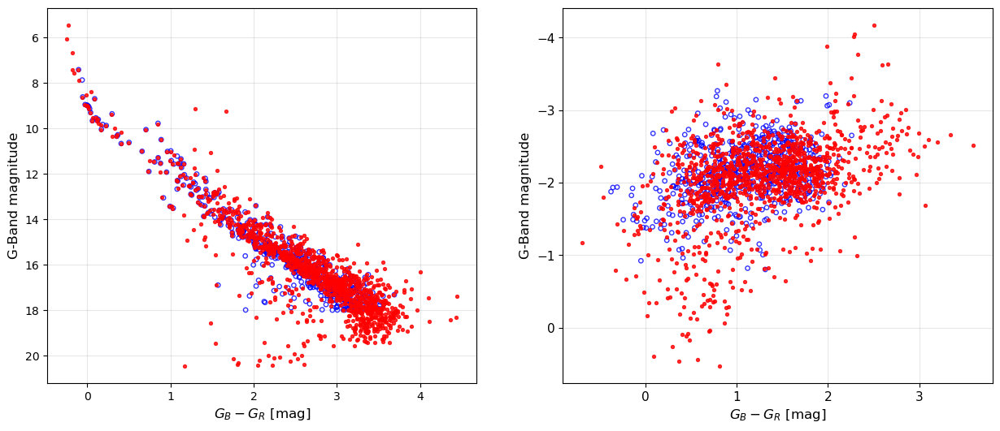

In [78]:
##Check the CMD (for Gmag correction)
fig, axes = plt.subplots(1, 2, figsize = (15, 6))

##First Plot
# region First Plot
axes[0].scatter(dsLD_Cantat_Gaudin2020_LORI["BP-RP"], dsLD_Cantat_Gaudin2020_LORI["Gmag"], marker = "o", s = 15, facecolor = "none", edgecolor = "blue", alpha = 0.8, zorder = 3, label = "Pleiades HDBSCAN Membership")
axes[0].scatter(dsLD_Hunt2024_LORI["BPmag"] - dsLD_Hunt2024_LORI["RPmag"] , dsLD_Hunt2024_LORI["Gmag"], marker = "o", s = 8, facecolor = "red", edgecolor = "red", alpha = 0.8, zorder = 3, label = "Pleiades HDBSCAN Membership")
#axes[0].scatter(GMM_Cluster_HighMembers["BP-RP"], GMM_Cluster_HighMembers["Gmag"], marker = "x", s = 2, facecolor = "red", edgecolor = "red", alpha = 0.9, zorder = 6, label = "Pleiades High Probability Sources")

axes[0].set_xlabel(r"$G_B - G_R$ [mag]", size = 12)
axes[0].set_ylabel("G-Band magnitude", size = 12)
axes[0].invert_yaxis()

axes[0].tick_params(axis = "both", labelsize = 10)
#axes[0].legend(prop = {"size": 11}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[0].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Second Plot
# region Second Plot
axes[1].scatter(dsLD_Cantat_Gaudin2020_LORI["pmRA_"], dsLD_Cantat_Gaudin2020_LORI["pmDE"], marker = "o", s = 15, facecolor = "none", edgecolor = "blue", alpha = 0.8, zorder = 3, label = "Pleiades HDBSCAN Membership")
axes[1].scatter(dsLD_Hunt2024_LORI["pmRA"], dsLD_Hunt2024_LORI["pmDE"], marker = "o", s = 8, facecolor = "red", edgecolor = "red", alpha = 0.8, zorder = 3, label = "Pleiades HDBSCAN Membership")
#axes[1].scatter(GMM_Cluster_HighMembers["pmRA"], GMM_Cluster_HighMembers["pmDE"], marker = "x", s = 2, facecolor = "red", edgecolor = "red", alpha = 0.9, zorder = 6, label = "Pleiades High Probability Sources")

axes[1].set_xlabel(r"$G_B - G_R$ [mag]", size = 12)
axes[1].set_ylabel("G-Band magnitude", size = 12)
axes[1].invert_yaxis()

axes[1].tick_params(axis = "both", labelsize = 11)
#axes[1].legend(prop = {"size": 11}, loc = "lower left", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[1].grid(True, linestyle = "-", alpha = 0.3)
# endregion

plt.tight_layout
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/xxx.pdf")
plt.show()

### Match Datasets

In [79]:
##Matching
# region Match
MATCHED_Cluster_Cantat_Gaudi2020 = pd.merge(GMM_Cluster_HighMembers, dsLD_Cantat_Gaudin2020_LORI, left_on = "Source", right_on = "GaiaDR2", how = "inner")
MATCHED_Cluster_Hunt2024 = pd.merge(GMM_Cluster_HighMembers, dsLD_Hunt2024_LORI, left_on = "Source", right_on = "GaiaDR3", how = "inner")
# endregion

In [80]:
##SharedStars
# region 
MERGED_sets = {
    "Pleiades_Cantat_Gaudin2020":    MATCHED_Cluster_Cantat_Gaudi2020,
    "Pleiades_Hunt2024":             MATCHED_Cluster_Hunt2024,
}

for name, df in MERGED_sets.items():
    print(f"{name} → {df.shape}")
# endregion
print(GMM_Cluster_HighMembers.shape)

Pleiades_Cantat_Gaudin2020 → (395, 79)
Pleiades_Hunt2024 → (630, 80)
(653, 61)


## Mean astrometic values

In [81]:
##===== Functions for Convertion =====##
# region
def decimal_deg_to_hms(deg):
    hours = deg / 15
    h = int(hours)
    m = int((hours - h) * 60)
    s = ((hours - h) * 60 - m) * 60
    return h, m, s

def decimal_deg_to_dms(deg):
    sign = -1 if deg < 0 else 1
    deg = abs(deg)
    d = int(deg)
    m = int((deg - d) * 60)
    s = ((deg - d) * 60 - m) * 60
    return sign * d, m, s
# endregion

##===== Calculate Function =====##
# region
def summarize_cluster(df, cluster_name):
    print(f"\n=== Zusammenfassung: {cluster_name} ===")

    variables = {
        "RA (α)": "_RAJ2000",
        "DE (δ)": "_DEJ2000",
        "ra": "RA_ICRS",
        "de": "DE_ICRS",
        "pmRA": "pmRA",
        "pmDE": "pmDE",
        "Parallax": "Plx"
    }

    for label, column in variables.items():
        values = df[column]
        mean = values.mean()
        std = values.std(ddof=1)
        sem = std / np.sqrt(len(values))

        print(f"\n— {label} —")
        print(f"Mittelwert         : {mean:.6f}")
        print(f"Standardabweichung : {std:.6f}")
        print(f"Standardfehler     : {sem:.6f}")

        if "RA" in label:
            h, m, s = decimal_deg_to_hms(mean)
            h_std, m_std, s_std = decimal_deg_to_hms(std)
            h_sem, m_sem, s_sem = decimal_deg_to_hms(sem)
            print(f"→ α (hms): {h}h {m}m {s:.2f}s")
            print(f"   ± Stdabw. : {h_std}h {m_std}m {s_std:.2f}s")
            print(f"   ± Stdfehler: {h_sem}h {m_sem}m {s_sem:.2f}s")

        elif "DE" in label:
            d, dm, ds = decimal_deg_to_dms(mean)
            d_std, dm_std, ds_std = decimal_deg_to_dms(std)
            d_sem, dm_sem, ds_sem = decimal_deg_to_dms(sem)
            print(f"→ δ (dms): {d}° {dm}' {ds:.2f}\"")
            print(f"   ± Stdabw. : {d_std}° {dm_std}' {ds_std:.2f}\"")
            print(f"   ± Stdfehler: {d_sem}° {dm_sem}' {ds_sem:.2f}\"")

# endregion

In [82]:
summarize_cluster(GMM_Cluster_HighMembers, "LORI")



=== Zusammenfassung: LORI ===

— RA (α) —
Mittelwert         : 84.328496
Standardabweichung : 0.920038
Standardfehler     : 0.036004
→ α (hms): 5h 37m 18.84s
   ± Stdabw. : 0h 3m 40.81s
   ± Stdfehler: 0h 0m 8.64s

— DE (δ) —
Mittelwert         : 9.543837
Standardabweichung : 0.460950
Standardfehler     : 0.018038
→ δ (dms): 9° 32' 37.81"
   ± Stdabw. : 0° 27' 39.42"
   ± Stdfehler: 0° 1' 4.94"

— ra —
Mittelwert         : 84.328501
Standardabweichung : 0.920040
Standardfehler     : 0.036004

— de —
Mittelwert         : 9.543827
Standardabweichung : 0.460951
Standardfehler     : 0.018038

— pmRA —
Mittelwert         : 1.203549
Standardabweichung : 0.588089
Standardfehler     : 0.023014
→ α (hms): 0h 4m 48.85s
   ± Stdabw. : 0h 2m 21.14s
   ± Stdfehler: 0h 0m 5.52s

— pmDE —
Mittelwert         : -2.185230
Standardabweichung : 0.273913
Standardfehler     : 0.010719
→ δ (dms): -2° 11' 6.83"
   ± Stdabw. : 0° 16' 26.09"
   ± Stdfehler: 0° 0' 38.59"

— Parallax —
Mittelwert         : 2.504

## Basic Plots

### Membership Probability

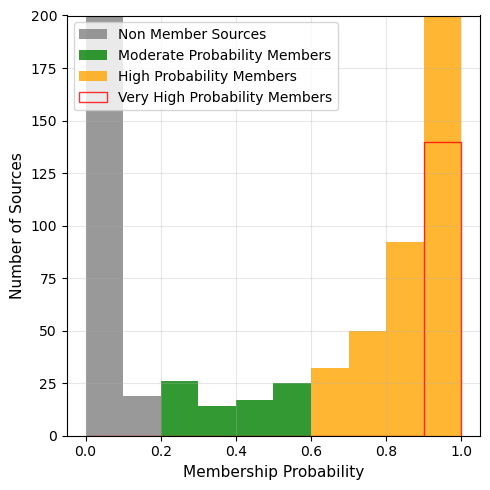

In [68]:
##===== Membership Probability =====##
# region 
##Define mask (needs to be the same as the initial definition)
non_mask        = dsHDBSCAN_Cluster["GMM_MembProb"] < 0.2
moderate_mask   = (dsHDBSCAN_Cluster["GMM_MembProb"] >= 0.2) & (dsHDBSCAN_Cluster["GMM_MembProb"] < 0.6)
high_mask       = dsHDBSCAN_Cluster["GMM_MembProb"] >= 0.6
Megahigh_mask   = dsHDBSCAN_Cluster["GMM_MembProb"] >= 0.99

# Define bin sizes
bins = np.linspace(0, 1, 11)

##Start plotting
# region Plot
plt.figure(figsize=(5, 5))

plt.hist(dsHDBSCAN_Cluster.loc[non_mask, "GMM_MembProb"],
         bins = bins,
         density = False,
         color = "gray",
         label = "Non Member Sources",
         alpha = 0.8, histtype = "stepfilled")

plt.hist(dsHDBSCAN_Cluster.loc[moderate_mask, "GMM_MembProb"],
         bins = bins,
         density = False,
         color = "green",
         label = "Moderate Probability Members",
         alpha = 0.8, histtype = "stepfilled")

plt.hist(dsHDBSCAN_Cluster.loc[high_mask, "GMM_MembProb"],
         bins = bins,
         density = False,
         color = "orange",
         label = "High Probability Members",
         alpha = 0.8, histtype = "stepfilled")

plt.hist(dsHDBSCAN_Cluster.loc[Megahigh_mask, "GMM_MembProb"],
         bins = bins,
         density = False,
         color = "red",
         label = "Very High Probability Members",
         alpha = 0.8, histtype = "step")

plt.xlabel("Membership Probability", size = 11)
plt.ylabel("Number of Sources", size = 11)

plt.ylim(0, 200)
#plt.yticks(np.arange(8, 20, 2))

plt.tick_params(axis = "both", labelsize = 10)
plt.legend(prop = {"size": 10}, loc = "upper left", scatterpoints = 1, markerscale = 3, fontsize = 12)
plt.grid(True, linestyle = "-", alpha = 0.3)
# endregion

# endregion

plt.tight_layout()
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/xxx.pdf")
plt.show()


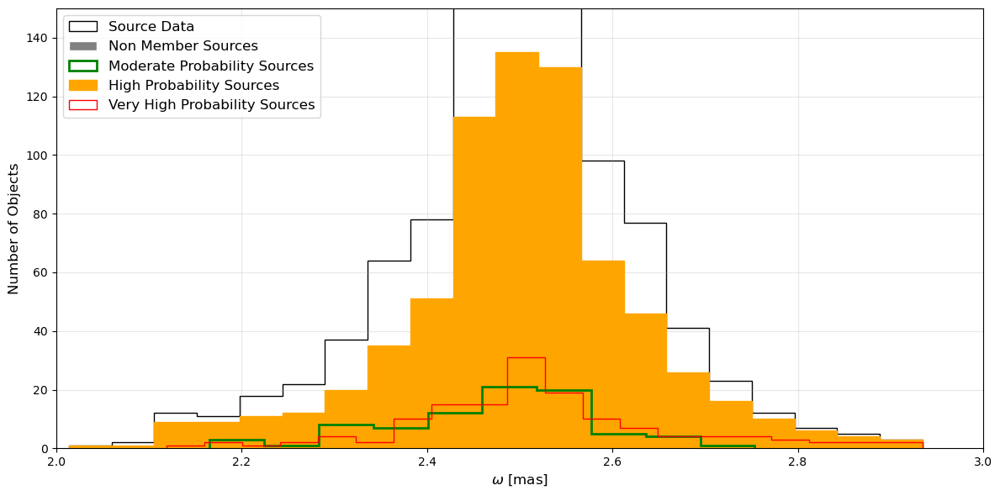

In [69]:
##===== Membership Probabilty Parallax =====##
# region
plt.figure(figsize = (12,6))

##Plot
# region Plot
plt.hist(dsHDBSCAN_Cluster["Plx"], bins = 20, histtype = "step" , color = "black", edgecolor = "black", zorder = 0, label = "Source Data")
plt.hist(GMM_Cluster_NonMembers["Plx"], bins = 20, color = "gray", edgecolor = "white", zorder = 1, label = "Non Member Sources")
plt.hist(GMM_Cluster_ModerateMembers ["Plx"], bins = 10, histtype = "step", color = "green", edgecolor = "green", linewidth = 2, zorder = 3, label = "Moderate Probability Sources")
plt.hist(GMM_Cluster_HighMembers["Plx"], bins = 20, color = "orange", edgecolor = "orange", zorder = 2, label = "High Probability Sources")
plt.hist(GMM_Cluster_MegaHighMembers["Plx"], bins = 20, histtype = "step", color = "red", edgecolor = "red", linewidth = 1, zorder = 3, label = "Very High Probability Sources")

plt.xlabel(r"$\omega$ [mas]", size = 12)
plt.ylabel("Number of Objects", size = 12)

plt.legend(prop={"size": 12}, loc ="upper left", ncol = 1)
plt.tick_params(axis="both", labelsize=10)

##Set limit to x- and y-axis (to zoom in)
plt.xlim(2, 3)
plt.ylim(0, 150)
#plt.xticks(np.arange(6.25, 8.75, 0.25))
#plt.yticks(np.arange(0, 250, 50))
plt.grid(True, alpha = 0.3, zorder = 0)
# endregion Plot

# endregion
plt.tight_layout()
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/xxx.pdf")
plt.show()

### Position / PM / Plx / CMD

#### Position + PM + Plx

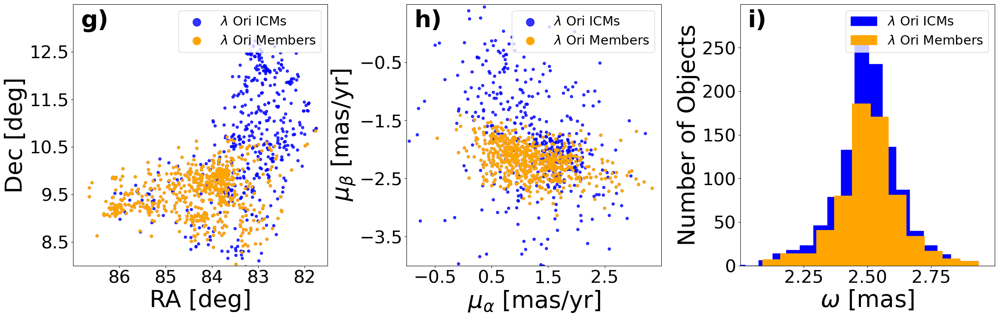

In [ ]:
##===== Position + Pm + Plx Plot =====##
# region
fig, axes = plt.subplots(1, 3, figsize = (28, 8))

##First Plot
# region First Plot
#axes[0].scatter(ds_$\lambda$ Ori["_RAJ2000"], ds_$\lambda$ Ori["_DEJ2000"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "$\lambda$ Ori Soruce Data")
axes[0].scatter(dsHDBSCAN_Cluster["_RAJ2000"], dsHDBSCAN_Cluster["_DEJ2000"], marker = "o", s = 20, color = "blue", edgecolor = "blue", alpha = 0.8, zorder = 2, label = r"$\lambda$ Ori ICMs")
axes[0].scatter(GMM_Cluster_HighMembers["_RAJ2000"], GMM_Cluster_HighMembers["_DEJ2000"], marker = "o", s = 20, color = "orange", edgecolor = "orange", alpha = 1, zorder = 2, label = r"$\lambda$ Ori Members")
#axes[0].scatter(dsLD_Cluster["RAdeg"], dsLD_Cluster["DEdeg"], marker = "o", s = 5, color = "cyan", edgecolor = "cyan", alpha = 0.8, zorder = 1, label = "Cluster Literature Sources")

axes[0].text(0.03, 0.98, "g)", transform=axes[0].transAxes, fontsize = 40, fontweight = "bold", va = "top", ha = "left")

axes[0].set_xlabel("RA [deg]", fontsize = 40)
axes[0].set_ylabel("Dec [deg]", fontsize = 40)
axes[0].set_xlim(81.5, 87)
axes[0].set_ylim(8, 13.5)
axes[0].set_xticks(np.arange(82, 87, 1))
axes[0].set_yticks(np.arange(8.5, 13.5, 1))
axes[0].invert_xaxis()

axes[0].tick_params(axis = "both", labelsize = 30)
axes[0].legend(prop = {"size": 22}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 25)
#axes[0].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Second Plot
# region Second Plot
#axes[1].scatter(ds_$\lambda$ Ori["pmRA"], ds_$\lambda$ Ori["pmDE"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Cluster Source Data")
axes[1].scatter(dsHDBSCAN_Cluster["pmRA"], dsHDBSCAN_Cluster["pmDE"], marker = "o", s = 20, facecolor = "blue", edgecolor = "blue", alpha = 0.8, zorder = 2, label = r"$\lambda$ Ori ICMs")
axes[1].scatter(GMM_Cluster_HighMembers["pmRA"], GMM_Cluster_HighMembers["pmDE"], marker = "o", s = 20, facecolor = "orange", edgecolor = "orange", alpha = 1, zorder = 2, label = r"$\lambda$ Ori Members")

axes[1].text(0.03, 0.98, "h)", transform=axes[1].transAxes, fontsize = 40, fontweight = "bold", va = "top", ha = "left")

axes[1].set_xlabel(r"$\mu_{\alpha}$ [mas/yr]", size = 40)
axes[1].set_ylabel(r"$\mu_{\beta}$ [mas/yr]", size = 40)
axes[1].set_xlim(-1, 3.5)
axes[1].set_ylim(-4, 0.5)
axes[1].set_xticks(np.arange(-0.5, 3.5, 1))
axes[1].set_yticks(np.arange(-3.5, 0.5, 1))
#axes[1].invert_yaxis()

axes[1].tick_params(axis = "both", labelsize = 30)
axes[1].legend(prop = {"size": 22}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 25)
#axes[1].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Third Plot
# region Thrid Plot
#axes[2].hist(PF_Cluster["Plx"], bins = 10000, histtype = "step" , color = "black", edgecolor = "black", zorder = 0, label = r"$\lambda$ Ori Source Data", linewidth = 2)
axes[2].hist(dsHDBSCAN_Cluster["Plx"], bins = 20, histtype = "stepfilled", color = "blue", edgecolor = "blue", zorder = 5, label = r"$\lambda$ Ori ICMs")
#axes[2].hist(GMM_Cluster_NonMembers["Plx"], bins = 20, color = "gray", edgecolor = "white", zorder = 1, label = "Cluster Non-Member Sources")
#axes[2].hist(GMM_Cluster_ModerateMembers ["Plx"], bins = 10, histtype = "step", color = "green", edgecolor = "green", linewidth = 2, zorder = 3, label = "Moderate Probability Sources")
axes[2].hist(GMM_Cluster_HighMembers["Plx"], bins = 12, color = "orange", edgecolor = "orange", zorder = 6, label = r"$\lambda$ Ori Members")
#axes[2].hist(GMM_Cluster_MegaHighMembers["Plx"], bins = 20, histtype = "step", color = "red", edgecolor = "red", linewidth = 1, zorder = 3, label = "Very High Probability Sources")

axes[2].text(0.03, 0.98, "i)", transform=axes[2].transAxes, fontsize = 40, fontweight = "bold", va = "top", ha = "left")


axes[2].set_xlabel(r"$\omega$ [mas]", size = 40)
axes[2].set_ylabel("Number of Objects", size = 40)

axes[2].legend(prop={"size": 22}, loc  = "upper right", ncol = 1, fontsize = 25)
axes[2].tick_params(axis="both", labelsize = 30)

##Set limit to x- and y-axis (to zoom in)
axes[2].set_xlim(2, 3)
axes[2].set_ylim(0, 300)
axes[2].set_xticks(np.arange(2.25, 3, 0.25))
axes[2].set_yticks(np.arange(0, 300, 50))
# endregion

# endregion
plt.subplots_adjust(wspace=0.31)
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/LORI_HDBSCANvsGMM3D.pdf", bbox_inches = "tight")
plt.show()

#### PM + CMD

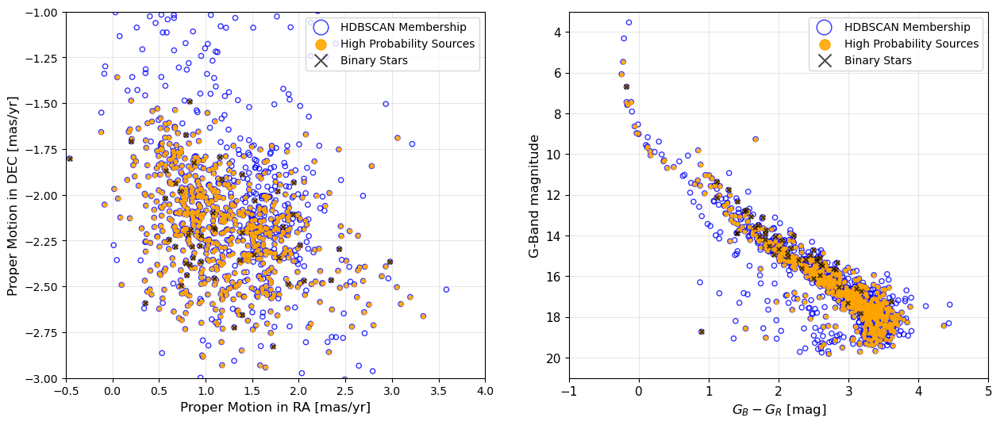

In [70]:
##===== PM + CMD Plot =====##
# region
fig, axes = plt.subplots(1, 2, figsize = (15, 6))

##First Plot
# region First Plot
#axes[0].scatter(ds_LORI["pmRA"], ds_LORI["pmDE"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Original Source Data")
axes[0].scatter(dsHDBSCAN_Cluster["pmRA"], dsHDBSCAN_Cluster["pmDE"], marker = "o", s = 20, facecolor = "none", edgecolor = "blue", alpha = 0.8, zorder = 2, label = "HDBSCAN Membership")
axes[0].scatter(GMM_Cluster_HighMembers["pmRA"], GMM_Cluster_HighMembers["pmDE"], marker = "o", s = 10, facecolor = "orange", edgecolor = "orange", alpha = 0.9, zorder = 2, label = "High Probability Sources")
axes[0].scatter(GMM_Cluster_HighMembers_binaries["pmRA"], GMM_Cluster_HighMembers_binaries["pmDE"], marker = "x", s = 15, facecolor = "black", edgecolor = "black", alpha = 0.7, zorder = 2, label = "Binary Stars")

axes[0].set_xlabel("Proper Motion in RA [mas/yr]", fontsize = 12)
axes[0].set_ylabel("Proper Motion in DEC [mas/yr]", fontsize = 12)
axes[0].set_xlim(-0.5, 4)
axes[0].set_ylim(-1, -3)
#axes[0].set_xticks(np.arange(3500, 6000, 500))
#axes[0].set_yticks(np.arange(2, 8, 1))
axes[0].invert_yaxis()

axes[0].tick_params(axis = "both", labelsize = 10)
axes[0].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[0].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Second Plot
# region Second Plot
#axes[1].scatter(ds_LORI["BP-RP"], ds_LORI["Gmag"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Origianl Source Data")
axes[1].scatter(dsHDBSCAN_Cluster["BP-RP"], dsHDBSCAN_Cluster["Gmag"], marker = "o", s = 20, color = "none", edgecolor = "blue", alpha = 0.8, zorder = 2, label = "HDBSCAN Membership")
axes[1].scatter(GMM_Cluster_HighMembers["BP-RP"], GMM_Cluster_HighMembers["Gmag"], marker = "o", s = 10, color = "orange", edgecolor = "orange", alpha = 0.9, zorder = 3, label = "High Probability Sources")
axes[1].scatter(GMM_Cluster_HighMembers_binaries["BP-RP"], GMM_Cluster_HighMembers_binaries["Gmag"], marker = "x", s = 15, facecolor = "black", edgecolor = "black", alpha = 0.7, zorder = 3, label = "Binary Stars")


axes[1].set_xlabel(r"$G_B - G_R$ [mag]", size = 12)
axes[1].set_ylabel("G-Band magnitude", size = 12)
axes[1].set_xlim(-1, 5)
axes[1].set_ylim(3, 21)
#axes[1].set_xticks(np.arange(0.5, 3.0, 0.5))
#axes[1].set_yticks(np.arange(8, 20, 2))
axes[1].invert_yaxis()

axes[1].tick_params(axis = "both", labelsize = 11)
axes[1].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[1].grid(True, linestyle = "-", alpha = 0.3)
# endregion

# endregion
plt.tight_layout
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/xxx.pdf")
plt.show()

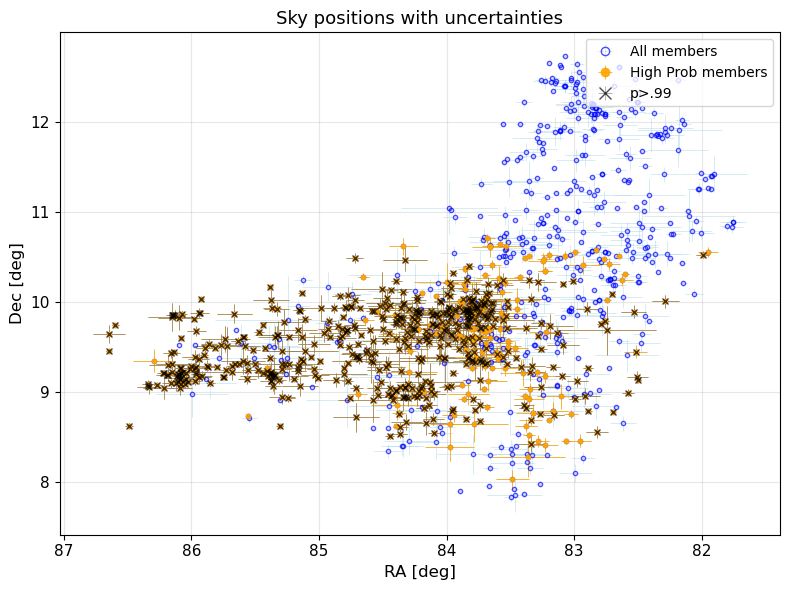

In [83]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(8, 6))

# All members
ax.errorbar(dsHDBSCAN_Cluster["RA_ICRS"], dsHDBSCAN_Cluster["DE_ICRS"],
            xerr=dsHDBSCAN_Cluster["e_RA_ICRS"], yerr=dsHDBSCAN_Cluster["e_DE_ICRS"],
            fmt="o", markersize=3, mfc="none", mec="blue", ecolor="lightblue",
            elinewidth=0.5, alpha=0.7, label="All members")

# High probability
ax.errorbar(GMM_Cluster_HighMembers["RA_ICRS"], GMM_Cluster_HighMembers["DE_ICRS"],
            xerr=GMM_Cluster_HighMembers["e_RA_ICRS"], yerr=GMM_Cluster_HighMembers["e_DE_ICRS"],
            fmt="o", markersize=3, mfc="orange", mec="orange", ecolor="orange",
            elinewidth=0.6, alpha=0.9, label="High Prob members")

# Binaries
#ax.errorbar(GMM_Cluster_HighMembers_binaries["RA_ICRS"], GMM_Cluster_HighMembers_binaries["DE_ICRS"],
#            xerr=GMM_Cluster_HighMembers_binaries["e_RA_ICRS"], 
#            yerr=GMM_Cluster_HighMembers_binaries["e_DE_ICRS"],
#            fmt="x", markersize=4, color="black", ecolor="gray",
#            elinewidth=0.6, alpha=0.7, label="Binaries")

ax.errorbar(GMM_Cluster_MegaHighMembers["RA_ICRS"], GMM_Cluster_MegaHighMembers["DE_ICRS"],
            xerr=GMM_Cluster_MegaHighMembers["e_RA_ICRS"], 
            yerr=GMM_Cluster_MegaHighMembers["e_DE_ICRS"],
            fmt="x", markersize=4, color="black", ecolor="gray",
            elinewidth=0.6, alpha=0.7, label="p>.99")

# Axis labels, formatting
ax.set_xlabel("RA [deg]", fontsize=12)
ax.set_ylabel("Dec [deg]", fontsize=12)
ax.invert_xaxis()  # astronomy convention
ax.tick_params(axis="both", labelsize=11)
ax.legend(prop={"size": 10}, loc="upper right", scatterpoints=1, markerscale=2, fontsize=12)
ax.grid(True, linestyle="-", alpha=0.3)
ax.set_title("Sky positions with uncertainties", fontsize=13)

plt.tight_layout()
plt.show()


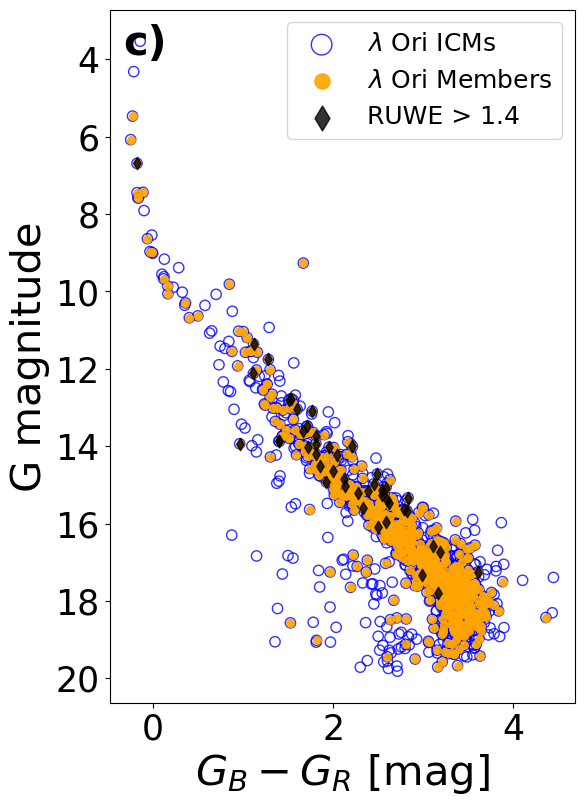

In [539]:
import matplotlib.pyplot as plt

# Create figure and axes
fig, axes = plt.subplots(figsize=(6, 9))

# Scatter plots
#axes.scatter(ds_Pleiades["BP-RP"], ds_Pleiades["Gmag"], marker="o", s=5,color="gray", edgecolor="gray", alpha=0.3, zorder=0, label="Original Source Data")
axes.scatter(dsHDBSCAN_Cluster["BP-RP"], dsHDBSCAN_Cluster["Gmag"], marker="o", s=55, facecolor="none", edgecolor="blue", alpha=0.8, zorder=2, label=r"$\lambda$ Ori ICMs")
axes.scatter(GMM_Cluster_HighMembers["BP-RP"], GMM_Cluster_HighMembers["Gmag"], marker="o", s=30,facecolor="orange", edgecolor="orange", alpha=0.9, zorder=2, label=r"$\lambda$ Ori Members")
axes.scatter(GMM_Cluster_HighMembers_binaries["BP-RP"], GMM_Cluster_HighMembers_binaries["Gmag"], marker="d", s=40,color="black", alpha=0.8, zorder=2, label="RUWE > 1.4")

axes.text(0.03, 0.98, "c)", transform=axes.transAxes, fontsize = 30, fontweight = "bold", va = "top", ha = "left")

# Axis labels and limits
axes.set_xlabel(r"$G_B - G_R$ [mag]", fontsize=30)
axes.set_ylabel("G magnitude", fontsize=30)
#axes.set_xlim(15, 25)
#axes.set_ylim(-55, -30)
axes.invert_yaxis()

# Ticks and grid
axes.tick_params(axis="both", labelsize=25)
#axes.grid(True, linestyle="-", alpha=0.3)

# Legend
axes.legend(prop={"size": 18}, loc="upper right", scatterpoints=1, markerscale=2)

# Layout and display
#plt.tight_layout()
plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/LORI_CMD.pdf", bbox_inches = "tight")
plt.show()


#### Position + PM + CMD

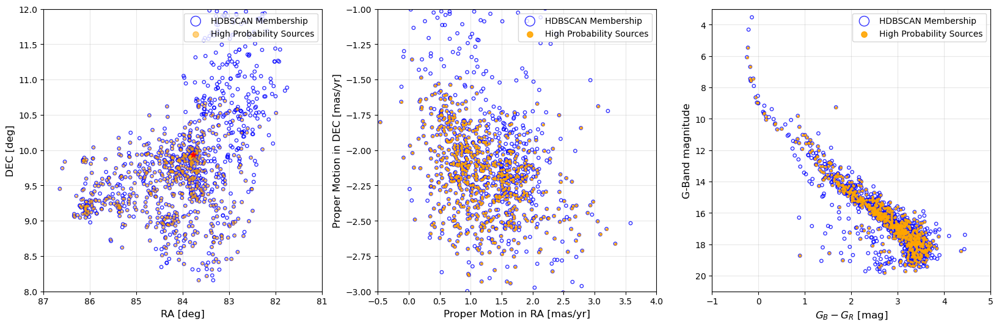

In [79]:
##===== Position + PM + CMD Plot =====##
# region
fig, axes = plt.subplots(1, 3, figsize = (20, 6))

##First Plot
# region First Plot
#axes[0].scatter(ds_LORI["_RAJ2000"], ds_LORI["_DEJ2000"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Original Soruce Data")
axes[0].scatter(dsHDBSCAN_Cluster["_RAJ2000"], dsHDBSCAN_Cluster["_DEJ2000"], marker = "o", s = 15, color = "none", edgecolor = "blue", alpha = 0.8, zorder = 2, label = "HDBSCAN Membership")
axes[0].scatter(GMM_Cluster_HighMembers["_RAJ2000"], GMM_Cluster_HighMembers["_DEJ2000"], marker = "o", s = 5, color = "orange", edgecolor = "orange", alpha = 0.5, zorder = 2, label = "High Probability Sources")
axes[0].scatter(083.78449673651, 09.93415011072, facecolor = "red", edgecolors='red', s=50, marker = "*", zorder = 5)


axes[0].set_xlabel("RA [deg]", fontsize = 12)
axes[0].set_ylabel("DEC [deg]", fontsize = 12)
axes[0].set_xlim(87, 81)
axes[0].set_ylim(12, 8)
#axes[0].set_xticks(np.arange(3500, 6000, 500))
#axes[0].set_yticks(np.arange(2, 8, 1))
axes[0].invert_yaxis()

axes[0].tick_params(axis = "both", labelsize = 10)
axes[0].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[0].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Second Plot
# region Second Plot
#axes[1].scatter(ds_LORI["pmRA"], ds_LORI["pmDE"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Original Source Data")
axes[1].scatter(dsHDBSCAN_Cluster["pmRA"], dsHDBSCAN_Cluster["pmDE"], marker = "o", s = 15, facecolor = "none", edgecolor = "blue", alpha = 0.8, zorder = 2, label = "HDBSCAN Membership")
axes[1].scatter(GMM_Cluster_HighMembers["pmRA"], GMM_Cluster_HighMembers["pmDE"], marker = "o", s = 5, facecolor = "orange", edgecolor = "orange", alpha = 0.9, zorder = 2, label = "High Probability Sources")

axes[1].set_xlabel("Proper Motion in RA [mas/yr]", fontsize = 12)
axes[1].set_ylabel("Proper Motion in DEC [mas/yr]", fontsize = 12)
axes[1].set_xlim(-0.5, 4)
axes[1].set_ylim(-1, -3)
#axes[1].set_xticks(np.arange(3500, 6000, 500))
#axes[1].set_yticks(np.arange(2, 8, 1))
axes[1].invert_yaxis()

axes[1].tick_params(axis = "both", labelsize = 10)
axes[1].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[1].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Third Plot
# region Thrid Plot
#axes[2].scatter(ds_LORI["BP-RP"], ds_LORI["Gmag"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Origianl Source Data")
axes[2].scatter(dsHDBSCAN_Cluster["BP-RP"], dsHDBSCAN_Cluster["Gmag"], marker = "o", s = 15, color = "none", edgecolor = "blue", alpha = 0.8, zorder = 2, label = "HDBSCAN Membership")
axes[2].scatter(GMM_Cluster_HighMembers["BP-RP"], GMM_Cluster_HighMembers["Gmag"], marker = "o", s = 5, color = "orange", edgecolor = "orange", alpha = 0.9, zorder = 2, label = "High Probability Sources")

axes[2].set_xlabel(r"$G_B - G_R$ [mag]", size = 12)
axes[2].set_ylabel("G-Band magnitude", size = 12)
axes[2].set_xlim(-1, 5)
axes[2].set_ylim(3, 21)
#axes[2].set_xticks(np.arange(0.5, 3.0, 0.5))
#axes[2].set_yticks(np.arange(8, 20, 2))
axes[2].invert_yaxis()

axes[2].tick_params(axis = "both", labelsize = 10)
axes[2].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[2].grid(True, linestyle = "-", alpha = 0.3)
# endregion

# endregion
plt.tight_layout
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/xxx.pdf")
plt.show()

### Literature Comparison

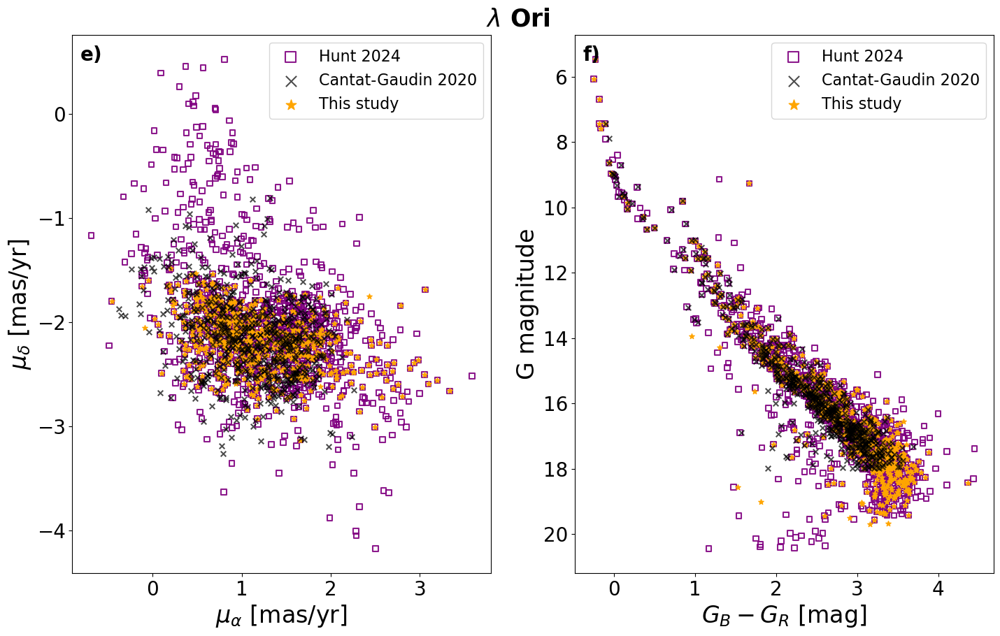

In [ ]:
##====== Comparison with Literature =====##
fig, axes = plt.subplots(1, 2, figsize = (17, 10))
fig.suptitle(r"$\lambda$ Ori", fontsize=25, fontweight="bold", y=0.92)

##First Plot
# region First Plot
axes[0].scatter(dsLD_Hunt2024_LORI["pmRA"], dsLD_Hunt2024_LORI["pmDE"], marker = "s", s = 30, facecolor = "none", edgecolor = "purple", alpha = 0.9, zorder = 1, label = "Hunt 2024", linewidth = 1.5)
axes[0].scatter(dsLD_Cantat_Gaudin2020_LORI["pmRA_"], dsLD_Cantat_Gaudin2020_LORI["pmDE"], marker = "x", s = 30, facecolor = "k", edgecolor = "k", alpha = 0.7, zorder = 4, label = "Cantat-Gaudin 2020")
axes[0].scatter(GMM_Cluster_HighMembers["pmRA"], GMM_Cluster_HighMembers["pmDE"], marker = "*", s = 30, facecolor = "orange", edgecolor = "orange", alpha = 1, zorder = 3, label = "This study")

axes[0].text(0.02, 0.98, "e)", transform=axes[0].transAxes, fontsize = 20, fontweight = "bold", va = "top", ha = "left")

#axes[0].set_xlim(-12.5, -9.5)
#axes[0].set_ylim(-4.5, -1)
#axes[0].set_xticks(np.arange(-12, -9.5, 1))
#axes[0].set_yticks(np.arange(-4, -1, 0.5))

axes[0].set_xlabel(r"$\mu_\alpha$ [mas/yr]", size = 24)
axes[0].set_ylabel(r"$\mu_\delta$ [mas/yr]", size = 24)

axes[0].tick_params(axis = "both", labelsize = 20)
axes[0].legend(prop = {"size": 16}, loc = "upper right", scatterpoints = 1, markerscale = 2, fontsize = 20)
#axes[0].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Second Plot
# region Second Plot
axes[1].scatter(dsLD_Hunt2024_LORI["BPmag"] - dsLD_Hunt2024_LORI["RPmag"], dsLD_Hunt2024_LORI["Gmag"], marker = "s", s = 30, facecolor = "none", edgecolor = "purple", alpha = 0.9, zorder = 1, label = "Hunt 2024", linewidth = 1.5)
axes[1].scatter(dsLD_Cantat_Gaudin2020_LORI["BP-RP"], dsLD_Cantat_Gaudin2020_LORI["Gmag"], marker = "x", s = 30, facecolor = "k", edgecolor = "k", alpha = 0.7, zorder = 4, label = "Cantat-Gaudin 2020")
axes[1].scatter(GMM_Cluster_HighMembers["BP-RP"], GMM_Cluster_HighMembers["Gmag"], marker = "*", s = 30, facecolor = "orange", edgecolor = "orange", alpha = 1, zorder = 3, label = "This study")

axes[1].text(0.02, 0.98, "f)", transform=axes[1].transAxes, fontsize = 20, fontweight = "bold", va = "top", ha = "left")

axes[1].set_xlabel(r"$G_B - G_R$ [mag]", size = 24)
axes[1].set_ylabel("G magnitude", size = 24)
axes[1].invert_yaxis()

#axes[1].set_xlim(-0.5, 3)
#axes[1].set_ylim(-4.5, -1)
#axes[1].set_xticks(np.arange(0, 3, 0.5))
#axes[1].set_yticks(np.arange(-4, -1, 0.5))

axes[1].tick_params(axis = "both", labelsize = 20)
axes[1].legend(prop = {"size": 16}, loc = "upper right", scatterpoints = 1, markerscale = 2, fontsize = 20)
#axes[1].grid(True, linestyle = "-", alpha = 0.3)
# endregion

#plt.tight_layout()
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/LORI_Literature.pdf")
plt.show()

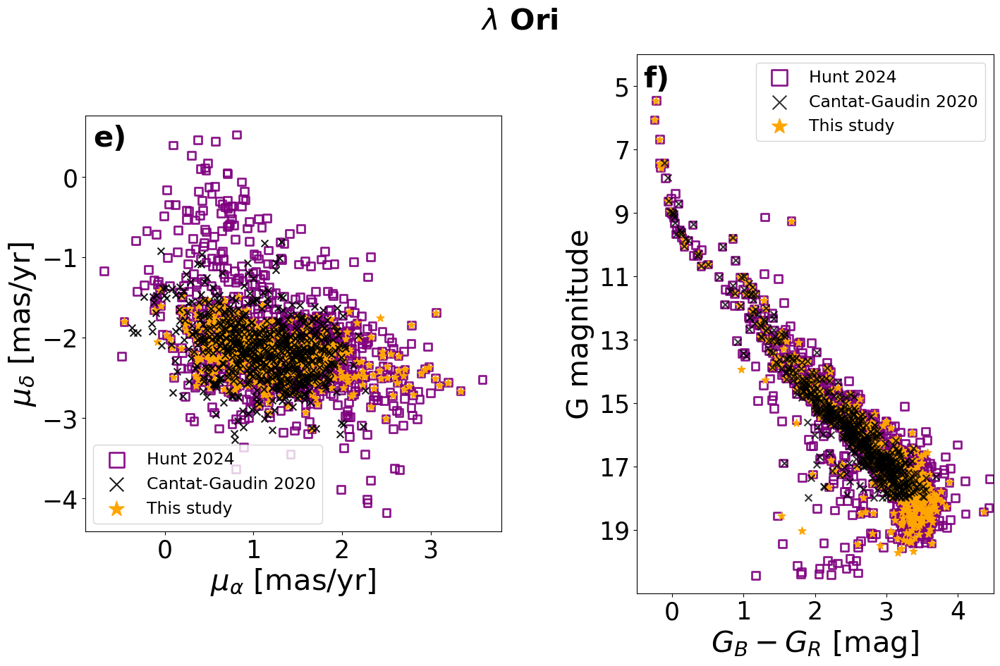

In [554]:
import numpy as np
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt

##Settings
# region
# TOTAL desired physical sizes (inches)
left_w, left_h = 7, 7   # proper-motion panel (width x height)
right_w, right_h = 6, 9  # CMD panel (width x height)

gap = 1  # inches between panels (approx)
fig_width = left_w + right_w + gap
fig_height = max(left_h, right_h)

fig = plt.figure(figsize=(fig_width, fig_height))

# Use finer row division (2 rows per inch)
nrows = int(fig_height * 2)
ncols = 2

width_ratios = [left_w, right_w]
height_ratios = [1] * nrows

gs = gridspec.GridSpec(
    nrows=nrows, ncols=ncols, figure=fig,
    width_ratios=width_ratios, height_ratios=height_ratios,
    hspace=0.15, wspace=0.35
)

# --- Center the left (PM) panel vertically ---
total_rows = nrows
pm_rows = int(left_h * 2)  # number of rows spanned by PM plot
start_row = (total_rows - pm_rows) // 2
end_row = start_row + pm_rows

ax0 = fig.add_subplot(gs[start_row:end_row, 0])   # PM plot, centered vertically
ax1 = fig.add_subplot(gs[:, 1])                   # CMD plot, full height

# endregion

##Plot 1
# region Plot 1
ax0.scatter(dsLD_Hunt2024_LORI["pmRA"], dsLD_Hunt2024_LORI["pmDE"],
            marker="s", s=60, facecolor="none", edgecolor="purple", alpha=0.9, zorder=1, label="Hunt 2024", linewidth=2)
ax0.scatter(dsLD_Cantat_Gaudin2020_LORI["pmRA_"], dsLD_Cantat_Gaudin2020_LORI["pmDE"],
            marker="x", s=50, facecolor="k", edgecolor="k", alpha=0.9, zorder=4, label="Cantat-Gaudin 2020")
ax0.scatter(GMM_Cluster_HighMembers["pmRA"], GMM_Cluster_HighMembers["pmDE"],
            marker="*", s=65, facecolor="orange", edgecolor="orange", alpha=1, zorder=3, label="This study")

ax0.text(0.02, 0.98, "e)", transform=ax0.transAxes, fontsize=30, fontweight="bold", va="top", ha="left")

#ax0.set_xlim(-12.5, -9.5)
#ax0.set_ylim(-4.5, -1)
#ax0.set_xticks(np.arange(-12, -9.5, 1))
#ax0.set_yticks(np.arange(-4, -1, 0.5))
#ax0.invert_yaxis()

ax0.set_xlabel(r"$\mu_\alpha$ [mas/yr]", size=30)
ax0.set_ylabel(r"$\mu_\delta$ [mas/yr]", size=30)
ax0.tick_params(axis="both", labelsize=25)
ax0.legend(prop={"size": 17}, loc="lower left", scatterpoints=1, markerscale=2, fontsize=20)

try:
    ax0.set_box_aspect(1.0)
except Exception:
    ax0.set_aspect('equal', adjustable='box')

# endregion

##Plot 2
# region Plot 2
ax1.scatter(dsLD_Hunt2024_LORI["BPmag"] - dsLD_Hunt2024_LORI["RPmag"], dsLD_Hunt2024_LORI["Gmag"],
            marker="s", s=60, facecolor="none", edgecolor="purple", alpha=0.9, zorder=1, label="Hunt 2024", linewidth=2)
ax1.scatter(dsLD_Cantat_Gaudin2020_LORI["BP-RP"], dsLD_Cantat_Gaudin2020_LORI["Gmag"],
            marker="x", s=50, facecolor="k", edgecolor="k", alpha=0.8, zorder=4, label="Cantat-Gaudin 2020")
ax1.scatter(GMM_Cluster_HighMembers["BP-RP"], GMM_Cluster_HighMembers["Gmag"],
            marker="*", s=65, facecolor="orange", edgecolor="orange", alpha=1, zorder=3, label="This study")

ax1.text(0.02, 0.98, "f)", transform=ax1.transAxes, fontsize=30, fontweight="bold", va="top", ha="left")

ax1.set_xlabel(r"$G_B - G_R$ [mag]", size=30)
ax1.set_ylabel("G magnitude", size=30)
ax1.invert_yaxis()
ax1.tick_params(axis="both", labelsize=25)
ax1.legend(prop={"size": 17}, loc="upper right", scatterpoints=1, markerscale=2, fontsize=20)

ax1.set_xlim(-0.5, 4.5)
ax1.set_ylim(21, 4)
ax1.set_xticks(np.arange(0, 5, 1))
ax1.set_yticks(np.arange(5, 21, 2))

# endregion
# ---------- Global title & layout ----------
fig.suptitle(r"$\lambda$ Ori", fontsize=30, fontweight="bold", y=0.995)
plt.subplots_adjust(left=0.06, right=0.98, top=0.92, bottom=0.07, wspace=0.35, hspace=0.1)

#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/LORI_Literature.pdf", bbox_inches = "tight")
plt.show()


### Comparison between different Takes


In [74]:
##===== Load Data =====##
#Cluster_Take1 = pd.read_csv(r"C:\Users\lenna\Desktop\Code-Backup\Membership\Pleiades_HighProbMembers_v1.csv")
#print(Cluster_Take1.columns.tolist())
#print(Cluster_Take1.shape)

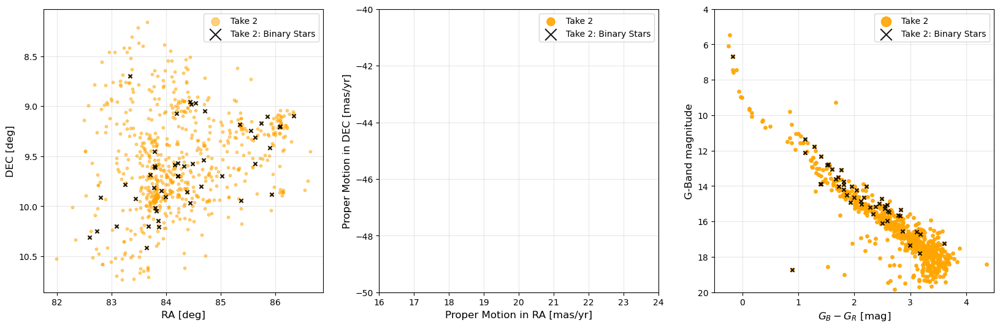

In [75]:
##===== Position + PM + CMD Plot =====##
# region
fig, axes = plt.subplots(1, 3, figsize = (20, 6))

##First Plot
# region First Plot
#axes[0].scatter(ds_Pleiades["_RAJ2000"], ds_Pleiades["_DEJ2000"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Original Soruce Data")
#axes[0].scatter(Cluster_Take1["_RAJ2000"], Cluster_Take1["_DEJ2000"], marker = "o", s = 25, color = "none", edgecolor = "blue", alpha = 0.8, zorder = 2, label = "Take 1")
axes[0].scatter(GMM_Cluster_HighMembers["_RAJ2000"], GMM_Cluster_HighMembers["_DEJ2000"], marker = "o", s = 10, color = "orange", edgecolor = "orange", alpha = 0.5, zorder = 2, label = "Take 2")
axes[0].scatter(GMM_Cluster_HighMembers_binaries["_RAJ2000"], GMM_Cluster_HighMembers_binaries["_DEJ2000"], marker = "x", s = 20, facecolor = "black", edgecolor = "black", alpha = 0.9, zorder = 2, label = "Take 2: Binary Stars")

axes[0].set_xlabel("RA [deg]", fontsize = 12)
axes[0].set_ylabel("DEC [deg]", fontsize = 12)
#axes[0].set_xlim(15, 25)
#axes[0].set_ylim(-30, -55)
#axes[0].set_xticks(np.arange(3500, 6000, 500))
#axes[0].set_yticks(np.arange(2, 8, 1))
axes[0].invert_yaxis()

axes[0].tick_params(axis = "both", labelsize = 10)
axes[0].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[0].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Second Plot
# region Second Plot
#axes[1].scatter(ds_Cluster["pmRA"], ds_Cluster["pmDE"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Original Source Data")
#axes[1].scatter(Cluster_Take1["pmRA"], Cluster_Take1["pmDE"], marker = "o", s = 25, facecolor = "none", edgecolor = "blue", alpha = 0.8, zorder = 2, label = "Take 1")
axes[1].scatter(GMM_Cluster_HighMembers["pmRA"], GMM_Cluster_HighMembers["pmDE"], marker = "o", s = 10, facecolor = "orange", edgecolor = "orange", alpha = 0.9, zorder = 2, label = "Take 2")
axes[1].scatter(GMM_Cluster_HighMembers_binaries["pmRA"], GMM_Cluster_HighMembers_binaries["pmDE"], marker = "x", s = 20, facecolor = "black", edgecolor = "black", alpha = 0.9, zorder = 2, label = "Take 2: Binary Stars")

axes[1].set_xlabel("Proper Motion in RA [mas/yr]", fontsize = 12)
axes[1].set_ylabel("Proper Motion in DEC [mas/yr]", fontsize = 12)
axes[1].set_xlim(16, 24)
axes[1].set_ylim(-40, -50)
#axes[1].set_xticks(np.arange(3500, 6000, 500))
#axes[1].set_yticks(np.arange(2, 8, 1))
axes[1].invert_yaxis()

axes[1].tick_params(axis = "both", labelsize = 10)
axes[1].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[1].grid(True, linestyle = "-", alpha = 0.3)
# endregion

##Third Plot
# region Thrid Plot
#axes[2].scatter(ds_Cluster["BP-RP"], ds_Cluster["Gmag"], marker = "o", s = 5, color = "gray", edgecolor = "gray", alpha = 0.3, zorder = 0, label = "Origianl Source Data")
#axes[2].scatter(Cluster_Take1["BP-RP"], Cluster_Take1["Gmag"], marker = "o", s = 25, color = "none", edgecolor = "blue", alpha = 0.8, zorder = 2, label = "Take 1")
axes[2].scatter(GMM_Cluster_HighMembers["BP-RP"], GMM_Cluster_HighMembers["Gmag"], marker = "o", s = 15, color = "orange", edgecolor = "orange", alpha = 0.9, zorder = 2, label = "Take 2")
axes[2].scatter(GMM_Cluster_HighMembers_binaries["BP-RP"], GMM_Cluster_HighMembers_binaries["Gmag"], marker = "x", s = 20, facecolor = "black", edgecolor = "black", alpha = 0.9, zorder = 2, label = "Take 2: Binary Stars")

axes[2].set_xlabel(r"$G_B - G_R$ [mag]", size = 12)
axes[2].set_ylabel("G-Band magnitude", size = 12)
axes[2].set_xlim(-0.5, 4.5)
axes[2].set_ylim(4, 20)
#axes[2].set_xticks(np.arange(0.5, 3.0, 0.5))
#axes[2].set_yticks(np.arange(8, 20, 2))
axes[2].invert_yaxis()

axes[2].tick_params(axis = "both", labelsize = 10)
axes[2].legend(prop = {"size": 10}, loc = "upper right", scatterpoints = 1, markerscale = 3, fontsize = 12)
axes[2].grid(True, linestyle = "-", alpha = 0.3)
# endregion
# endregion

plt.tight_layout
#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_Pleiades/Figures/xxx.pdf")
plt.show()

# Theoretical Isochrone Fitting

In [87]:
##===== Note =====##
# In order to keep all runs saved for easier comparison, they will be stored in a dictonary.
# This is only a dictonary, thus closing the notebook also closes the dictonary. If one wants to keep a run, save if individually.

##===== Global storage for results =====##
all_fit_results = {}

##===== View global dictionary =====##
#all_fit_results.keys()


In [ ]:
##===== Rename Labels =====##
# The plot functions (below) would automatically use the generated label, thus redefine the labels here for a more appealing visual representation.
# How it works: "auto genertated Label": "own label"
label_name_map = {
    "MIST_v1_t_20250914_150506": "MIST",
    "PARSEC_t_20250914_013555": "PARSEC v1.2S",
    "PARSEC_v2_82": "PARSEC v2.0"
}

In [ ]:
##===== Function to get observables =====##
def get_observables(data):
    obs_bp_rp = data["BP-RP"].values
    obs_gmag = data["AbsMag"].values
    obs_gmag_error = data["e_AbsMag"].values
    return obs_bp_rp, obs_gmag, obs_gmag_error

##===== Plot best fitting values (single) =====##
def plot_best_fit(label, fit_results_dict, obs_bp_rp, obs_gmag):
    """
    Plot the observed cluster members and the best-fit isochrone (MIST or PARSEC).

    Parameters:
    - label: str, the unique run label (e.g., returned by run_mist_tfit or run_parsec_tfit)
    - fit_results_dict: dict, typically 'all_fit_results'
    - obs_bp_rp: array, observed BP - RP colors
    - obs_gmag: array, observed absolute G magnitudes
    """
    import matplotlib.pyplot as plt
    import numpy as np

    result = fit_results_dict[label]
    best_fit = result.get("best_fit", None)
    best_iso = result["best_iso"]

    # === Detect model type by column names === #
    if {"G_mag", "BP_mag", "RP_mag"}.issubset(best_iso.columns):  # MIST model
        G_col = "G_mag"
        BP_col = "BP_mag"
        RP_col = "RP_mag"
        extinction_needs_applying = True
    elif {"Gmag", "G_BPmag", "G_RPmag"}.issubset(best_iso.columns):  # PARSEC v1.2S
        G_col = "Gmag"
        BP_col = "G_BPmag"
        RP_col = "G_RPmag"
        extinction_needs_applying = False
    elif {"G_fSBmag", "G_BP_fSBmag", "G_RP_fSBmag"}.issubset(best_iso.columns):  # PARSEC v2.0 (fSB)
        G_col = "G_fSBmag"
        BP_col = "G_BP_fSBmag"
        RP_col = "G_RP_fSBmag"
        extinction_needs_applying = False
    else:
        raise ValueError("Unrecognized isochrone format. Column names don't match known models.")

    # Default: no correction needed
    abs_G = best_iso[G_col]

    # If MIST, apply extinction correction
    if extinction_needs_applying and best_fit is not None:
        _, _, best_distance, best_AV, *_ = best_fit

        def apparent_to_absolute(mag, distance_pc, AV=0.0):
            return mag - 5 * (np.log10(distance_pc) - 1) - AV

        abs_G = apparent_to_absolute(best_iso[G_col], best_distance, AV=best_AV)

    bp_rp_iso = best_iso[BP_col] - best_iso[RP_col]

    # === Plotting === #
    fig, ax = plt.subplots(figsize=(6, 8))

    ax.scatter(
        GMM_Cluster_HighMembers["BP-RP"], GMM_Cluster_HighMembers["AbsMag"],
        s=8, c="black", edgecolors="black", linewidths=0.5, alpha=0.8,
        label="Cluster Members", marker="o"
    )

    ax.scatter(
        GMM_Cluster_HighMembers_binaries["BP-RP"], GMM_Cluster_HighMembers_binaries["AbsMag"],
        s=12, facecolor="red", edgecolors="red", linewidths=0.5, alpha=1.0,
        label="Cluster Member Binary Stars", marker="x"
    )

    pretty_label = label_name_map.get(label, f"Isochrone: {label}")

    ax.plot(
        bp_rp_iso, abs_G,
        linewidth=1.8,
        #label=f"Isochrone: {label}"
        label = pretty_label
        
    )

    ax.set_xlabel("BP - RP [mag]", fontsize=12)
    ax.set_ylabel("Absolute G Magnitude", fontsize=12)
    ax.set_xlim(-0.5, 4)
    ax.set_ylim(15, -2.5)
    ax.grid(True, linestyle="--", alpha=0.3)
    ax.tick_params(labelsize=10)
    ax.legend(fontsize=9, loc="upper right")

    plt.tight_layout()
    #plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_Pleiades/Figures/xxx.pdf")
    plt.show()

##===== Plot best fitting values (multiple) =====##
def plot_multiple_best_fits(labels, fit_results_dict, obs_bp_rp, obs_gmag):
    """
    Plot observed cluster members and multiple best-fit isochrones for comparison.

    Parameters:
    - labels: list of str, the labels for the runs you want to compare
    - fit_results_dict: dict containing all fit results (e.g. all_fit_results)
    - obs_bp_rp: array, observed BP - RP colors
    - obs_gmag: array, observed absolute G magnitudes
    """
    import numpy as np
    import matplotlib.pyplot as plt

    def apparent_to_absolute(mag, distance_pc, AV=0.0):
        return mag - 5 * (np.log10(distance_pc) - 1) - AV

    fig, ax = plt.subplots(figsize=(6, 8))

    # Predefined color list
    colors = ["black", "blue", "red", "yellow", "teal", "brown", "gray", "magenta", "olive", "cyan"]

    # Plot observed cluster members
    ax.scatter(
        obs_bp_rp, obs_gmag,
        s=50, c="orange", edgecolors="orange", linewidths=0.5, alpha=0.9,
        label=r"$\lambda$ Ori Members", marker="o"
    )

    # Loop over each isochrone fit result
# region Isochrone Loop
    for i, label in enumerate(labels):
        result = fit_results_dict[label]
        best_fit = result.get("best_fit", None)
        best_iso = result["best_iso"]

        # Identify model type
        if {"G_mag", "BP_mag", "RP_mag"}.issubset(best_iso.columns):  # MIST
            G_col = "G_mag"
            BP_col = "BP_mag"
            RP_col = "RP_mag"
            extinction_needs_applying = True
        elif {"Gmag", "G_BPmag", "G_RPmag"}.issubset(best_iso.columns):  # PARSEC v1.2S
            G_col = "Gmag"
            BP_col = "G_BPmag"
            RP_col = "G_RPmag"
            extinction_needs_applying = False
        elif {"G_fSBmag", "G_BP_fSBmag", "G_RP_fSBmag"}.issubset(best_iso.columns):  # PARSEC v2.0
            G_col = "G_fSBmag"
            BP_col = "G_BP_fSBmag"
            RP_col = "G_RP_fSBmag"
            extinction_needs_applying = False
        else:
            raise ValueError(f"Isochrone format for '{label}' not recognized.")

        # Handle extinction correction if MIST and best_fit is available
        if extinction_needs_applying and best_fit is not None:
            _, _, best_distance, best_AV, *_ = best_fit
            abs_G = apparent_to_absolute(best_iso[G_col], best_distance, AV=best_AV)
        else:
            abs_G = best_iso[G_col]

        bp_rp_iso = best_iso[BP_col] - best_iso[RP_col]
        pretty_label = label_name_map.get(label, f"Isochrone: {label}")
# endregion
        ax.plot(
            bp_rp_iso, abs_G,
            linewidth=2.5,
            color=colors[i % len(colors)],  # Assign color from list
            label=pretty_label
        )

    # Plot formatting
    ax.set_xlabel(r"$G_B - G_R$ [mag]", fontsize=30)
    ax.set_ylabel(r"$M_G$ [mag]", fontsize=30)
    ax.set_xlim(-1, 5)
    ax.set_ylim(13, -3)
    #ax.set_yticks(np.arange(4, 20, 2))
    #ax.set_xticks(np.arange(0, 4, 1))
    ax.tick_params(labelsize=25)
    ax.legend(fontsize=18, loc="upper right")

    plt.tight_layout()
    #plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/LORI_TIF.pdf", bbox_inches = "tight")
    plt.show()

##===== Note =====##
# region
    # In order to use these functions, call
    # 1. run_mist_tfit(Your_data, name="MIST", method="t")
    #   -> You will run the sampler based on the selected data
    #   -> make sure, that name and method correspond to the same "labels" used in the function

    # 2. obs_bp_rp, obs_gmag, obs_gmag_error = get_observables(GMM_Cluster_HighMembers)
    #    plot_best_fit("MIST_t_20250730_220428", all_fit_results, obs_bp_rp, obs_gmag) or
    #    plot_multiple_best_fits(["MIST_t_20250730_220426", "Next Element"], all_fits_results, obs_bp_rp, obs_gmag)
    #   -> Use the label that will be auto-generated by step 1 to call the data stores in the dictionary
# endregion

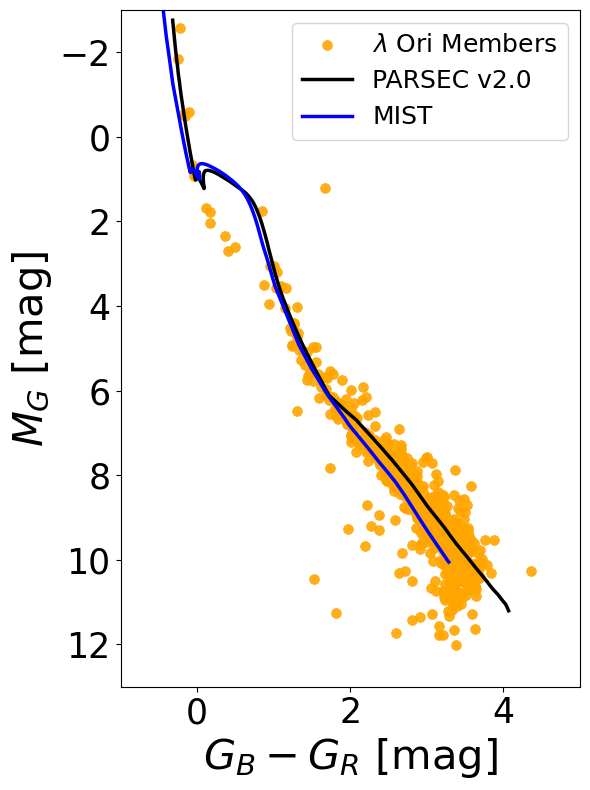

In [599]:
obs_bp_rp, obs_gmag, _ = get_observables(GMM_Cluster_HighMembers_nonBinaries)
plot_multiple_best_fits(["PARSEC_v2_82", "MIST_v1_t_20250914_150506"], all_fit_results, obs_bp_rp, obs_gmag)

## MIST Isochrones

Used for MIST Isochrones is the package (https://github.com/timothydmorton/isochrones/releases) by timotydmorton. This only supports MIST model isochrones for the time of this code (10.07.2025). However, he also wants to expand the package for the use of PARSEC model isochrones.

In [90]:
from isochrones import get_ichrone
import emcee
import numpy as np
import matplotlib.pyplot as plt
import arviz as az
import corner
from scipy.stats import norm, t
from scipy.interpolate import UnivariateSpline
from isochrones.mist import MIST_Isochrone
import emcee
from datetime import datetime

##===== Set Up MIST isochrone Model =====##
MIST_Isochrone.use_mist_defaults = True
mist = get_ichrone("mist")


PyMultiNest not imported.  MultiNest fits will not work.


### Chi2 based MIST analysis

In [ ]:
##===== Main fitting function =====##
def run_mist_fit_chi2(data, name="MIST_v1", method="Chi2"):
    ##Label with timestamp
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    label = f"{name}_{method}_{timestamp}"

    ##Extract observables
    obs_bp_rp, obs_gmag, obs_gmag_error = get_observables(data)

    ##Define likelihood, prior, and posterior
    def log_likelihood(params):
        logage, feh, distance, AV = params
        try:
            iso = mist.isochrone(age=logage, feh=feh, distance=distance, AV=AV)
            model_bp_rp = iso["BP_mag"] - iso["RP_mag"]
            model_gmag = iso["G_mag"]
        except:
            return -np.inf
        if len(model_bp_rp) == 0:
            return -np.inf

        interp_gmag = np.interp(obs_bp_rp, model_bp_rp[::-1], model_gmag[::-1], left=np.nan, right=np.nan)
        mask = ~np.isnan(interp_gmag)
        if np.sum(mask) < len(obs_bp_rp) // 2:
            return -np.inf

        residuals = obs_gmag[mask] - interp_gmag[mask]
        chi2 = np.sum((residuals)**2 / (obs_gmag_error[mask] + 1e-6)**2)
        return -0.5 * chi2

    def log_prior(params):
        logage, feh, distance, AV = params
        if 7.9 < logage < 8.3 and 0 < feh < 0.1 and 120 < distance < 160 and 0.0 < AV < 0.2:
            return 0.0
        return -np.inf

    def log_probability(params):
        lp = log_prior(params)
        if not np.isfinite(lp):
            return -np.inf
        return lp + log_likelihood(params)

    ##Setup MCMC
    ndim = 4
    nwalkers = 32
    initial = np.array([8.1, 0.02, 135, 0.13])
    pos = initial + 1e-3 * np.random.randn(nwalkers, ndim)

    sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability)
    print(f"Running MCMC for {label}...")
    sampler.run_mcmc(pos, 2000, progress=True)
    print("Done.")

    ##Extract samples and best fit
    flat_samples = sampler.get_chain(discard=200, thin=15, flat=True)
    labels = ["log(age)", "[Fe/H]", "distance (pc)", "A_V"]
    best_fit = np.median(flat_samples, axis=0)
    errors = np.std(flat_samples, axis=0)

    ##Isochrone model for best fit
    best_logage, best_feh, best_distance, best_AV = best_fit
    best_iso = mist.isochrone(age=best_logage, feh=best_feh, distance=best_distance, AV=best_AV)
    model_bp_rp = best_iso["BP_mag"] - best_iso["RP_mag"]
    model_gmag = best_iso["G_mag"]

    interp_gmag = np.interp(obs_bp_rp, model_bp_rp[::-1], model_gmag[::-1], left=np.nan, right=np.nan)
    mask = ~np.isnan(interp_gmag)
    residuals = obs_gmag[mask] - interp_gmag[mask]
    chi2 = np.sum((residuals / (obs_gmag_error[mask] + 1e-6)) ** 2)
    dof = len(residuals) - ndim
    chi2_red = chi2 / dof

    ##Extract stellar parameters
    masses = best_iso["mass"]
    teff = best_iso["Teff"]
    logg = best_iso["logg"]
    lum = best_iso["logL"]

    ##===== Store results =====##
    all_fit_results[label] = {
        "label": label,
        "best_fit": best_fit,
        "errors": errors,
        "flat_samples": flat_samples,
        "sampler": sampler,
        "chi2": chi2,
        "chi2_red": chi2_red,
        "best_iso": best_iso,
        "stellar_params": {
            "mass_range": (masses.min(), masses.max()),
            "teff_range": (teff.min(), teff.max()),
            "logg_range": (logg.min(), logg.max()),
            "lum_range": (lum.min(), lum.max())
        }
    }

    ##===== Plot diagnostics =====##
    fig, axes = plt.subplots(ndim, figsize=(10, 7), sharex=True)
    samples = sampler.get_chain()
    for i in range(ndim):
        axes[i].plot(samples[:, :, i], alpha=0.3)
        axes[i].set_ylabel(labels[i])
    axes[-1].set_xlabel("Step")
    plt.tight_layout()
    plt.show()

    corner.corner(flat_samples, labels=labels, quantiles=[0.16, 0.5, 0.84], show_titles=True)
    plt.show()

    ##Gelman-Rubin criteria
    idata = az.from_emcee(sampler, var_names=labels)
    print(f"\n=== {label} ===")
    for val, err, lbl in zip(best_fit, errors, labels):
        print(f"{lbl}: {val:.3f} ± {err:.3f}")
    print(f"χ² = {chi2:.2f}")
    print(f"Reduced χ² = {chi2_red:.2f}")
    print("Gelman-Rubin R-hat:\n", az.rhat(idata))
    print(f"Mass range: {masses.min():.2f}–{masses.max():.2f} M☉")
    print(f"Teff range: {teff.min():.2f}–{teff.max():.2f} K")
    print(f"logg range: {logg.min():.2f}–{logg.max():.2f}")
    print(f"Luminosity range (log L): {lum.min():.2f}–{lum.max():.2f}")

    return label


Running MCMC for MIST_v1_Chi2_20250730_184818...


100%|██████████| 2000/2000 [09:18<00:00,  3.58it/s]


Done.


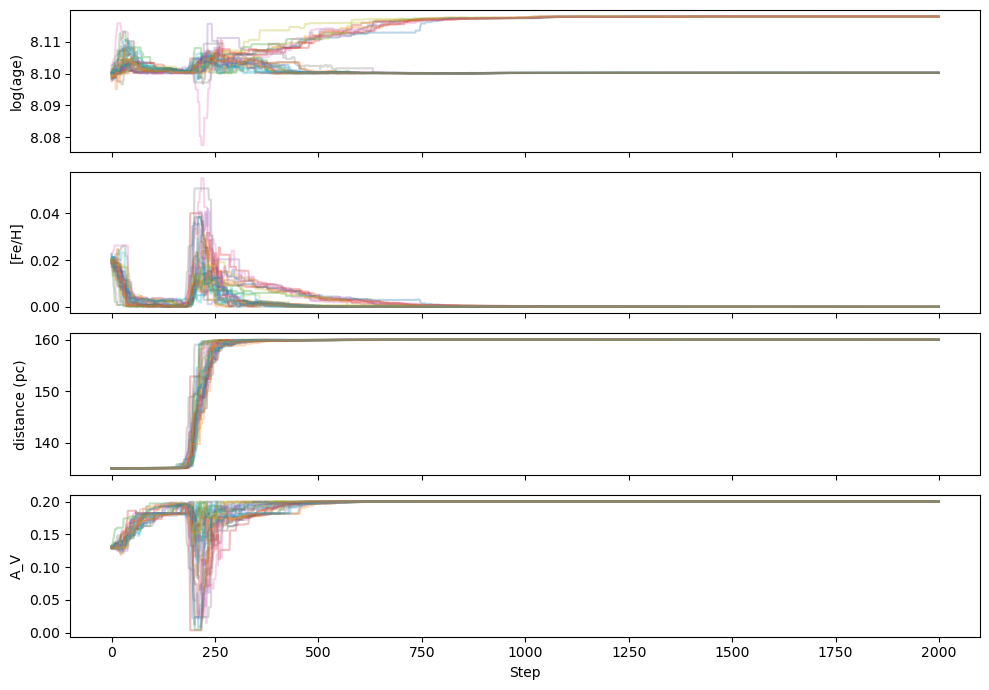

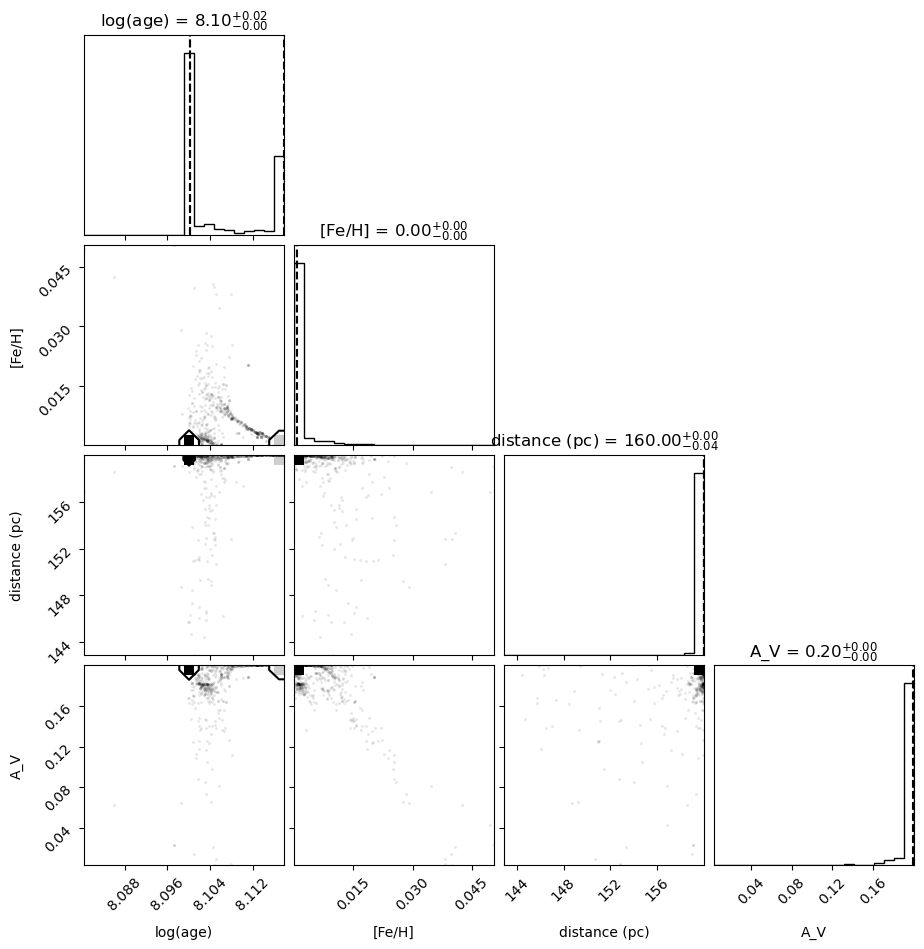


=== MIST_v1_Chi2_20250730_184818 ===
log(age): 8.100 ± 0.008
[Fe/H]: 0.000 ± 0.004
distance (pc): 160.000 ± 1.149
A_V: 0.200 ± 0.013
χ² = 449719464.24
Reduced χ² = 431592.58
Gelman-Rubin R-hat:
 <xarray.Dataset> Size: 32B
Dimensions:        ()
Data variables:
    log(age)       float64 8B 2.091
    [Fe/H]         float64 8B 1.741
    distance (pc)  float64 8B 1.637
    A_V            float64 8B 1.626
Mass range: 0.11–4.86 M☉
Teff range: 2861.77–329836.31 K
logg range: -0.89–8.39
Luminosity range (log L): -2.63–4.48


In [ ]:
##===== Run the Model =====##
# Only here you call the DataSet used
MIST_Chi2_v1 = run_mist_fit_chi2(GMM_Cluster_HighMembers, name="MIST_v1", method="Chi2")


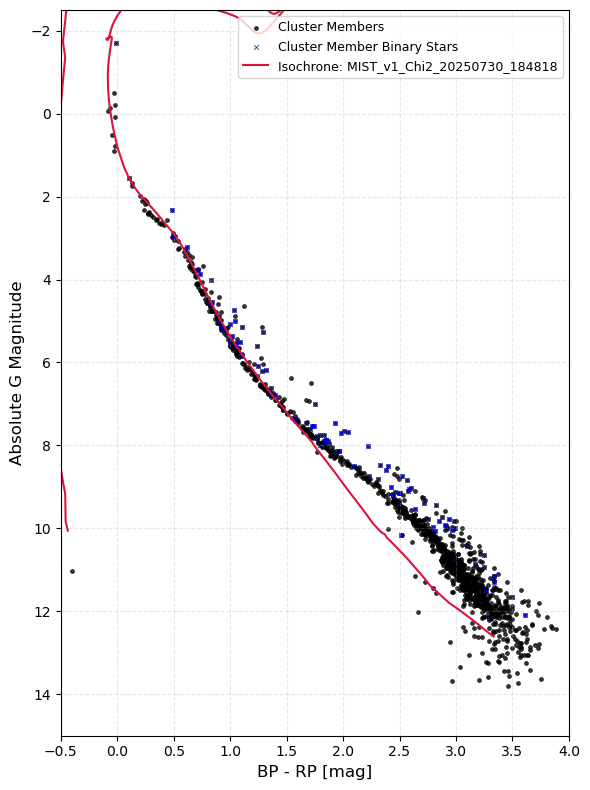

In [118]:
obs_bp_rp, obs_gmag, obs_gmag_error = get_observables(GMM_Cluster_HighMembers)
plot_best_fit(MIST_Chi2_v1, all_fit_results, obs_bp_rp, obs_gmag)


### T-Distribution

This codeblock used the Student t-distribution in addition to weighted stars and Av adjustments in the loglikelihood, to get a better performance by a more dynamic model.

In [234]:
##===== Main Fitting Function: t-distribution =====##
def run_mist_tfit(data, name="MIST_v1", method="t"):
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    label = f"{name}_{method}_{timestamp}"
    print(f"Running fit with label: {label}")

    ##Extract observables
    obs_bp_rp, obs_gmag, obs_gmag_error = get_observables(data)

    ##Define likelihood, prior, and posterior
    def log_likelihood(params):
        logage, feh, distance, AV, sigma_factor, nu = params
        if nu <= 2 or nu >= 30:
            return -np.inf

        try:
            iso = mist.isochrone(age=logage, feh=feh, distance=distance, AV=AV)
        except:
            return -np.inf

        model_bp_rp = np.array(iso["BP_mag"] - iso["RP_mag"])
        model_gmag = np.array(iso["G_mag"])

        if len(model_bp_rp) == 0:
            return -np.inf

        sort_idx = np.argsort(model_bp_rp)
        interp_gmag_spline = UnivariateSpline(model_bp_rp[sort_idx], model_gmag[sort_idx], s=0)
        interp_gmag = interp_gmag_spline(obs_bp_rp)

        mask = ~np.isnan(interp_gmag)
        if np.sum(mask) < len(obs_bp_rp) // 2:
            return -np.inf

        residuals = obs_gmag[mask] - interp_gmag[mask]

        color_weights = np.ones_like(obs_bp_rp)
        color_weights[obs_bp_rp > 1.5] = 1
        color_weights = color_weights[mask]

        model_uncertainty = 0.4
        data_errors = obs_gmag_error[mask]
        total_errors = np.sqrt(data_errors**2 + model_uncertainty**2)
        adjusted_errors = total_errors * sigma_factor / color_weights + 1e-6

        return np.sum(t.logpdf(residuals / adjusted_errors, df=nu))

    def log_prior(params):
        logage, feh, distance, AV, sigma_factor, nu = params
        if not (6.4 < logage < 7.0 and 0 < feh < 0.1 and 390 < distance < 410 and 0.0 < AV < 0.3 and 0.5 < sigma_factor < 2.0 and 2 < nu < 30):
            return -np.inf
        return (
            norm.logpdf(logage, 6.62, 0.1) +
            norm.logpdf(feh, 0.012, 0.02) +
            norm.logpdf(distance, 400, 10) +
            norm.logpdf(AV, 0.075, 0.05) +
            norm.logpdf(sigma_factor, 1.0, 0.2) +
            norm.logpdf(nu, 10, 5)
        )

    def log_probability(params):
        lp = log_prior(params)
        return lp + log_likelihood(params) if np.isfinite(lp) else -np.inf

    ##===== MCMC Setup =====##
    ndim = 6
    nwalkers = 64
    initial = np.array([6.6, 0.01, 401, 0.075, 1.0, 10])

    scale = np.array([1e-2, 1e-2, 1e-0, 1e-2, 1e-2, 1e-2])
    pos = initial + scale * np.random.randn(nwalkers, ndim)
    #pos = initial + 1e-2 * np.random.randn(nwalkers, ndim)

    sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability)
    print("Running MCMC...")
    sampler.run_mcmc(pos, 100, progress=True)
    print("MCMC complete.")

    flat_samples = sampler.get_chain(discard=10, thin=1, flat=True)
    labels = ["log(age)", "[Fe/H]", "distance (pc)", "A_V", "σ_factor", "ν"]
    best_fit = np.median(flat_samples, axis=0)
    errors = np.std(flat_samples, axis=0)

    for val, err, label_name in zip(best_fit, errors, labels):
        print(f"{label_name}: {val:.3f} ± {err:.3f}")

    #corner.corner(flat_samples, labels=labels, quantiles=[0.16, 0.5, 0.84], show_titles=True)
    #plt.show()
    # Select only the first four parameters for plotting
    selected_indices = [0, 1, 2, 3]
    flat_samples_subset = flat_samples[:, selected_indices]
    labels_subset = [labels[i] for i in selected_indices]

    corner.corner(
        flat_samples_subset,
        labels=labels_subset,
        quantiles=[0.16, 0.5, 0.84],
        show_titles=True,
        title_fmt=".3f",
        title_kwargs={"fontsize": 12}
    )
    plt.show()

    ## Store ArviZ inference data
    idata = az.from_emcee(sampler, var_names=labels)
    print("R-hat diagnostic:")
    print(az.rhat(idata))

    ## Compute model for best-fit
    best_logage, best_feh, best_distance, best_AV, best_sigma_factor, best_nu = best_fit
    best_iso = mist.isochrone(age=best_logage, feh=best_feh, distance=best_distance, AV=best_AV)
    model_bp_rp = np.array(best_iso["BP_mag"] - best_iso["RP_mag"])
    model_gmag = np.array(best_iso["G_mag"])

    ##Interpolate and mask
    interp_gmag = np.interp(obs_bp_rp, model_bp_rp[::-1], model_gmag[::-1], left=np.nan, right=np.nan)
    mask = ~np.isnan(interp_gmag)
    residuals = obs_gmag[mask] - interp_gmag[mask]

    ##Chi² diagnostic
    chi2 = np.sum((residuals / (obs_gmag_error[mask] + 1e-6))**2)
    dof = len(residuals) - ndim
    chi2_red = chi2 / dof

    ##Stellar parameters
    masses = best_iso["mass"]
    teff = best_iso["Teff"]
    logg = best_iso["logg"]
    lum = best_iso["logL"]

    ##===== Store in global dictionary =====##
    all_fit_results[label] = {
        "label": label,
        "best_fit": best_fit,
        "errors": errors,
        "flat_samples": flat_samples,
        "sampler": sampler,
        "chi2": chi2,
        "chi2_red": chi2_red,
        "best_iso": best_iso,
        "idata": idata,
        "stellar_params": {
            "mass_range": (masses.min(), masses.max()),
            "teff_range": (teff.min(), teff.max()),
            "logg_range": (logg.min(), logg.max()),
            "lum_range": (lum.min(), lum.max())
        }
    }

    ##Optional summary output
    print(f"\n=== {label} ===")
    print(f"χ² = {chi2:.2f}, Reduced χ² = {chi2_red:.2f}")
    print(f"Mass range: {masses.min():.2f}–{masses.max():.2f} M☉")
    print(f"Teff range: {teff.min():.2f}–{teff.max():.2f} K")
    print(f"logg range: {logg.min():.2f}–{logg.max():.2f}")
    print(f"Luminosity range (log L): {lum.min():.2f}–{lum.max():.2f}")

    return label


Running fit with label: MIST_v1_t_20250914_150506
Running MCMC...


100%|██████████| 100/100 [00:41<00:00,  2.40it/s]


MCMC complete.
log(age): 6.609 ± 0.051
[Fe/H]: 0.008 ± 0.028
distance (pc): 402.666 ± 3.810
A_V: 0.083 ± 0.040
σ_factor: 1.050 ± 0.066
ν: 10.012 ± 0.093


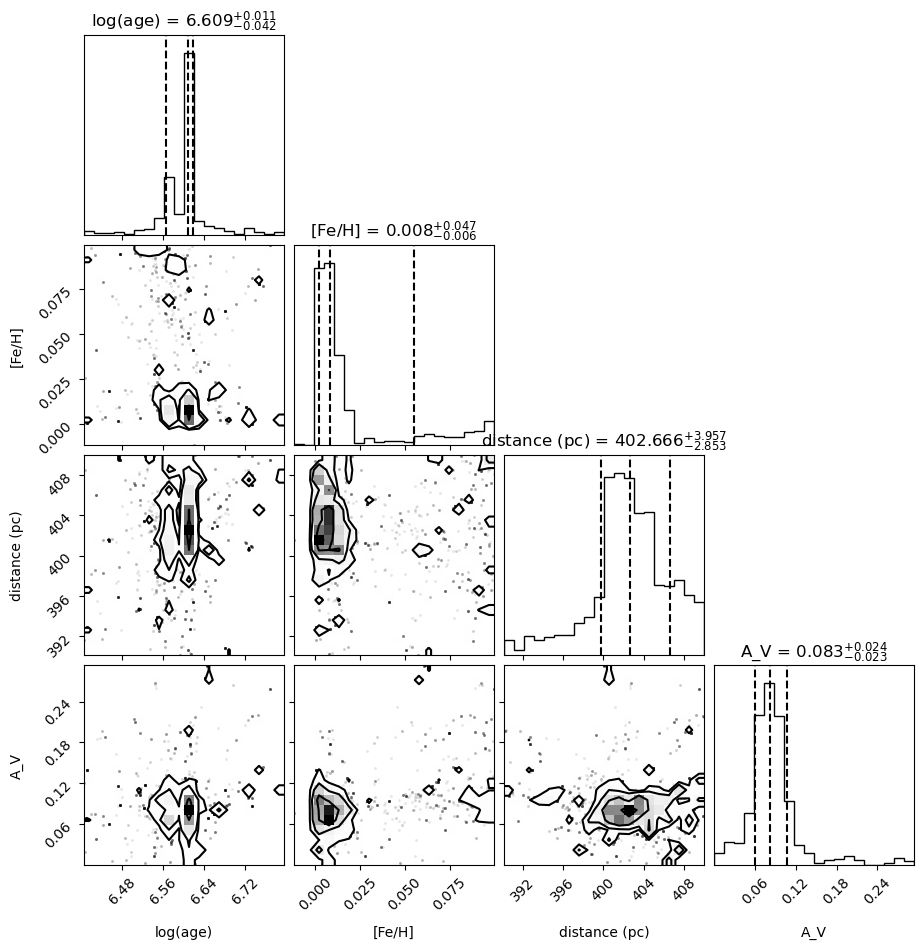

R-hat diagnostic:
<xarray.Dataset> Size: 48B
Dimensions:        ()
Data variables:
    log(age)       float64 8B 2.317
    [Fe/H]         float64 8B 2.096
    distance (pc)  float64 8B 2.261
    A_V            float64 8B 2.229
    σ_factor       float64 8B 2.018
    ν              float64 8B 2.032

=== MIST_v1_t_20250914_150506 ===
χ² = 30246956.66, Reduced χ² = 70835.96
Mass range: 0.11–43.74 M☉
Teff range: 2992.81–110585.23 K
logg range: 0.50–4.98
Luminosity range (log L): -1.57–6.11


'MIST_v1_t_20250914_150506'

In [235]:
run_mist_tfit(GMM_Cluster_HighMembers_nonBinaries, name="MIST_v1", method="t")

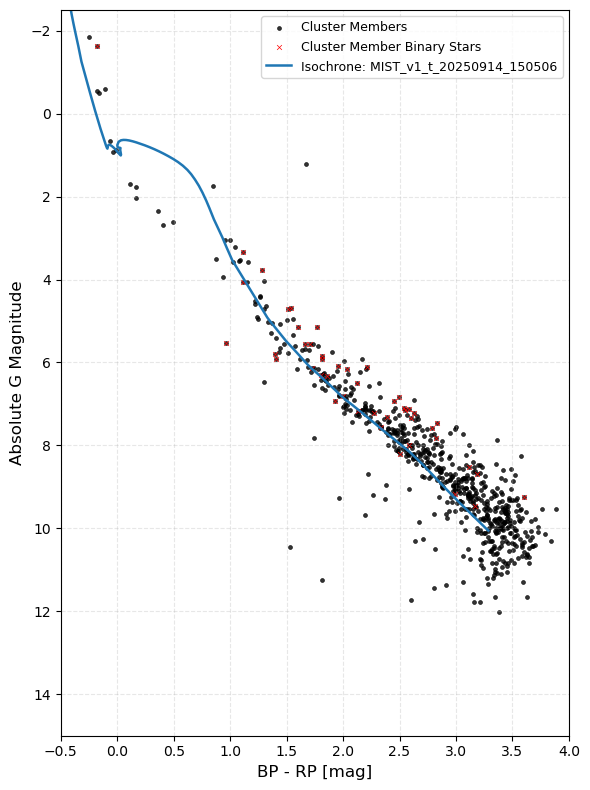

In [236]:
obs_bp_rp, obs_gmag, obs_gmag_error = get_observables(GMM_Cluster_HighMembers)
plot_best_fit("MIST_v1_t_20250914_150506", all_fit_results, obs_bp_rp, obs_gmag)

MIST_v1_t_20250914_144655

## PARSEC Isochrones

For the PARSEC isochrones, I will use the Ezpadova package in order to run my MCMC smapler and get the best fitting values. However, this package uses PARSEC v1.2S and not PARSEC v2.0 (which is better), the PARSEC v1.2S derived parameters will be used to manually download a PARSEC v2.0 Isochrone from the CMDv3.8 Webinterface (http://stev.oapd.inaf.it/cgi-bin/cmd).

In [140]:
import numpy as np
import emcee
from scipy.stats import t, norm
from scipy.interpolate import UnivariateSpline
from functools import lru_cache
import ezpadova
import corner
import matplotlib.pyplot as plt
import arviz as az
from datetime import datetime
from scipy.optimize import fsolve

##===== For fetching PARSEC v2.0 =====##
import requests
from bs4 import BeautifulSoup
from io import StringIO

In [97]:
##===== Note =====##
# region
    # The Webinterface works for metallicity with both Z or M/H not Fe/H.
    # Thus, even though the auto sampler return feh as an output, this actually is M/H.
    # Assumption: M/H = Fe/H also valid
# endregion

### PARSEC v1.2S

This package (https://github.com/mfouesneau/ezpadova/blob/master/README.md) gets the isochrones from the CMD PARSEC website (http://stev.oapd.inaf.it/cgi-bin/cmd).

In [159]:
##===== SET UP =====##
# region SetUp
##Grid Construction
# Note: KEEP boundaries in log-likelihood tight
# Set parameter ranges with (x,x,x) -> (start, end, steps of)
ages = np.arange(6.4, 6.9 + 1e-8, 0.01)
age_range = (ages.min(), ages.max(), 0.01)
# Define extendet [Fe/H] grid, to avoid overload
feh_chunks = [
    (-0.05, 0.00, 0.01),
    (0.00, 0.05, 0.01),
    (0.05, 0.10, 0.01)
]

##Download of the Grid (one-shot)
grid_dfs = []
for feh_range_chunk in feh_chunks:
    try:
        print(f"[INFO] Downloading chunk {feh_range_chunk}...")
        sub_df = ezpadova.get_isochrones(
            logage=age_range,
            MH=feh_range_chunk,
            photsys_file="gaiaEDR3"
        )
        sub_df.columns = sub_df.columns.str.strip()
        grid_dfs.append(sub_df)
    except RuntimeError as e:
        print(f"[ERROR] Chunk {feh_range_chunk} failed: {e}")

##Merge downloaded chunks into one big DataFrame
if grid_dfs:
    grid_df = pd.concat(grid_dfs, ignore_index=True)
    print(f"[INFO] Final grid has {len(grid_df)} rows.")
else:
    grid_df = None
    print("[WARN] Grid download failed completely.")

##Prefetch Loop
# Split into subgroups and cache them
# Loops through every combination in the grid and stores them im memory for later use
iso_cache = {}
if grid_df is not None:
    for (a, z), subdf in grid_df.groupby(["logAge", "MH"]):
        key = (round(float(a), 2), round(float(z), 2))
        iso_cache[key] = subdf.reset_index(drop=True)

##Memory-Efficient Caching
# basically remembers up to "maxsize" unique combinations,
# thus will not download the same combination several times
#   -> Helps save time and avoids re-querying the INAF server during MCMC
@lru_cache(maxsize=256)

##Isochrone Downloader
# querying for a single-point isochrone (no spread in age or metallicity)
# Also clean data if needed and return DataSet of synthetic stellar magnitudes
def fetch_parsec_iso(logage, feh):
    """
    Download or return cached PARSEC isochrone for a single (logage, feh) point.
    Adds protection against CMD server errors.
    """
    try:
        df = ezpadova.get_isochrones(
            logage=(logage, logage, 0.0),
            MH=(feh, feh, 0.0),
            photsys_file="gaiaEDR3"
        )
        df.columns = df.columns.str.strip()
        return df
    except RuntimeError as e:
        print(f"[ERROR] CMD server failed at logage={logage}, [Fe/H]={feh}: {e}")
        return None

##Grid Validation Function
def is_valid_grid_point(logage, feh, age_bounds=(6.4, 6.9), feh_bounds=(-0.05, 0.10)):
    return age_bounds[0] <= logage <= age_bounds[1] and feh_bounds[0] <= feh <= feh_bounds[1]

##Pre-filter for MCMC with Fallback
# rounds the MCMC-samples age and metallicity to the nearest grid point, 
# and returns corresponding preloaded isochrones
# ASSUMPTION: logage and feh stay within grid bounds, if prior strays outside, None will be returned

def get_nearest_iso(logage, feh):
    key = (round(float(logage), 2), round(float(feh), 2))
    if not is_valid_grid_point(logage, feh):
        #print(f"[WARN] ({logage}, {feh}) outside valid bounds.")
        return None

    model = iso_cache.get(key)
    if model is not None:
        return model
    else:
        return fetch_parsec_iso(*key)

# endregion

[INFO] Downloading chunk (-0.05, 0.0, 0.01)...
Querying http://stev.oapd.inaf.it/cgi-bin/cmd...
Retrieving data...
[INFO] Downloading chunk (0.0, 0.05, 0.01)...
Querying http://stev.oapd.inaf.it/cgi-bin/cmd...
Retrieving data...
[INFO] Downloading chunk (0.05, 0.1, 0.01)...
Querying http://stev.oapd.inaf.it/cgi-bin/cmd...
Retrieving data...
[INFO] Final grid has 307709 rows.


In [208]:
##===== Main Fitting Function: t-dristribution v1 =====##
def run_parsec_tfit(data, name="PARSEC", method="t"):
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    label = f"{name}_{method}_{timestamp}"
    print(f"\n[INFO] Running fit with label: {label}")

    ##Ensure global dictionary is accessible
    global all_fit_results

    ##===== Extract observables =====##
    obs_bp_rp, obs_gmag, obs_gmag_error = get_observables(data)

    ##===== Likelihood Function =====##
    def log_likelihood(params):
        logage, feh, distance, AV, sigma_factor, nu = params
        if nu <= 2 or nu >= 30:
            return -np.inf

        iso_df = get_nearest_iso(logage, feh)
        if iso_df is None:
            return -np.inf

        bp, rp, gm = iso_df["G_BPmag"].values, iso_df["G_RPmag"].values, iso_df["Gmag"].values
        x = np.sort(bp - rp)
        y = gm[np.argsort(bp - rp)]
        x_u, idx_u = np.unique(x, return_index=True)
        y_u = y[idx_u]

        spline = UnivariateSpline(x_u, y_u, s=0, k=3)
        interp_g = spline(obs_bp_rp)
        mask = ~np.isnan(interp_g)
        if mask.sum() < len(obs_bp_rp) // 2:
            return -np.inf

        residuals = obs_gmag[mask] - interp_g[mask]
        errs = obs_gmag_error[mask] * sigma_factor + 1e-6
        return np.sum(t.logpdf(residuals / errs, df=nu))

    ##===== Prior & Posterior =====##
    def log_prior(params):
        logage, feh, distance, AV, sigma_factor, nu = params
        if not (6.4 < logage < 7.0 and 0 < feh < 0.3 and 370 < distance < 430 and 0.0 < AV < 0.3 and 0.5 < sigma_factor < 2.0 and 2 < nu < 30):
            return -np.inf
        return (
            norm.logpdf(logage, 6.60, 0.2) +
            norm.logpdf(feh, 0.04, 0.05) +
            norm.logpdf(distance, 400, 10) +
            norm.logpdf(AV, 0.30, 0.1) +
            norm.logpdf(sigma_factor, 1.0, 0.2) +
            norm.logpdf(nu, 10, 5)
        )

    def log_probability(params):
        lp = log_prior(params)
        return lp + log_likelihood(params) if np.isfinite(lp) else -np.inf

    ##==== MCMC Setup =====##
    ndim = 6
    nwalkers = 64
    initial = np.array([6.62, 0.038, 400, 0.3, 1.0, 10])

    scale = np.array([1e-2, 1e-2, 1e-0, 1e-2, 1e-2, 1e-2])
    pos = initial + scale * np.random.randn(nwalkers, ndim)
    #pos = init + 1e-2 * np.random.randn(nwalkers, ndim)

    sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability)
    print("[INFO] Running MCMC...")
    sampler.run_mcmc(pos, 200, progress=True)
    print("[INFO] Sampling done.")

    ##===== Results =====##
    flat_samples = sampler.get_chain(discard=20, thin=1, flat=True)
    best_fit = np.median(flat_samples, axis=0)
    errors = np.std(flat_samples, axis=0)

    ##InferenceData object
    labels_emcee = ["log(age)", "[Fe/H]", "distance", "A_V", "σ_factor", "ν"]
    idata = az.from_emcee(sampler, var_names=labels_emcee)

    for val, err, label_name in zip(best_fit, errors, labels_emcee):
        print(f"{label_name}: {val:.3f} ± {err:.3f}")

    ##Best-fit parameters
    best_logage, best_feh, best_distance, best_AV, sigma_factor, nu = best_fit
    best_iso = get_nearest_iso(best_logage, best_feh)

    ##Interpolation residuals for Chi²
    bp, rp, gm = best_iso["G_BPmag"].values, best_iso["G_RPmag"].values, best_iso["Gmag"].values
    x = np.sort(bp - rp)
    y = gm[np.argsort(bp - rp)]
    x_u, idx_u = np.unique(x, return_index=True)
    y_u = y[idx_u]
    spline = UnivariateSpline(x_u, y_u, s=0, k=3)
    interp_g = spline(obs_bp_rp)
    mask = ~np.isnan(interp_g)
    residuals = obs_gmag[mask] - interp_g[mask]

    ##Chi² diagnostic
    chi2 = np.sum((residuals / (obs_gmag_error[mask] + 1e-6))**2)
    dof = len(residuals) - ndim
    chi2_red = chi2 / dof

    ##Stellar parameters
    masses = best_iso["Mass"]
    teff = best_iso["logTe"]
    logg = best_iso["logg"]
    lum = best_iso["logL"]

    ##===== Store in global dictionary =====##
    all_fit_results[label] = {
        "label": label,
        "best_fit": best_fit,
        "errors": errors,
        "flat_samples": flat_samples,
        "sampler": sampler,
        "chi2": chi2,
        "chi2_red": chi2_red,
        "best_iso": best_iso,
        "idata": idata,
        "stellar_params": {
            "mass_range": (masses.min(), masses.max()),
            "teff_range": (teff.min(), teff.max()),
            "logg_range": (logg.min(), logg.max()),
            "lum_range": (lum.min(), lum.max())
        }
    }

    ##Optional: summary output
    print(f"\n=== {label} ===")
    print(f"χ² = {chi2:.2f}, Reduced χ² = {chi2_red:.2f}")
    print(f"Mass range: {masses.min():.2f}–{masses.max():.2f} M☉")
    print(f"Teff range: {teff.min():.2f}–{teff.max():.2f} K")
    print(f"logg range: {logg.min():.2f}–{logg.max():.2f}")
    print(f"Luminosity range (log L): {lum.min():.2f}–{lum.max():.2f}")

    ##Optional: corner plot
    #corner.corner(flat_samples, labels=labels_emcee, quantiles=[0.16, 0.5, 0.84], show_titles=True)
    #plt.show()

    # Select only the first four parameters for plotting
    selected_indices = [0, 1, 2, 3]
    flat_samples_subset = flat_samples[:, selected_indices]
    labels_subset = [labels_emcee[i] for i in selected_indices]

    corner.corner(
        flat_samples_subset,
        labels=labels_subset,
        quantiles=[0.16, 0.5, 0.84],
        show_titles=True,
        title_fmt=".3f",
        title_kwargs={"fontsize": 12}
    )
    plt.show()

    return label



[INFO] Running fit with label: PARSEC_t_20250914_013555
[INFO] Running MCMC...


100%|██████████| 200/200 [00:08<00:00, 23.45it/s]


[INFO] Sampling done.
log(age): 6.588 ± 0.046
[Fe/H]: 0.025 ± 0.032
distance: 400.414 ± 8.322
A_V: 0.263 ± 0.066
σ_factor: 1.050 ± 0.087
ν: 9.983 ± 0.122

=== PARSEC_t_20250914_013555 ===
χ² = 18882039548298450239889411670016.00, Reduced χ² = 31365514199831310922860724224.00
Mass range: 0.09–41.64 M☉
Teff range: 3.42–5.33 K
logg range: -0.04–6.06
Luminosity range (log L): -1.66–6.04


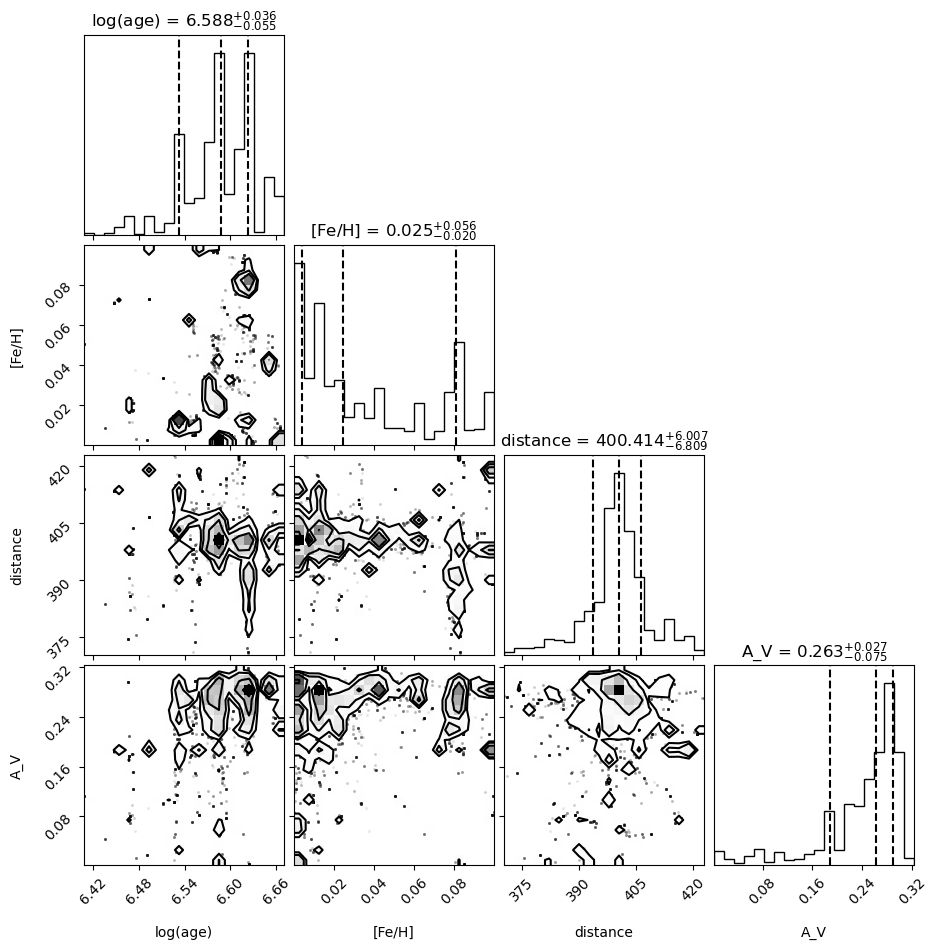

'PARSEC_t_20250914_013555'

In [209]:
run_parsec_tfit(GMM_Cluster_HighMembers_nonBinaries)

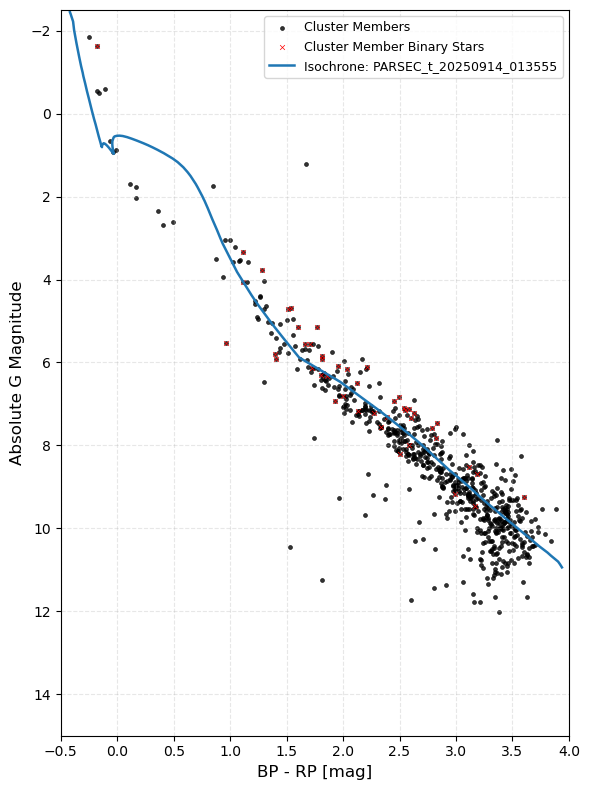

In [210]:
obs_bp_rp, obs_gmag, _ = get_observables(GMM_Cluster_HighMembers)
plot_best_fit("PARSEC_t_20250914_013555", all_fit_results, obs_bp_rp, obs_gmag)

In [391]:
##===== Inspect best_iso =====##
#parsec_result = all_fit_results["PARSEC_t_20250731_012058"]
#best_iso = parsec_result["best_iso"]
#print(best_iso.columns)


### PARSEC v2.0

In [421]:
from scipy.optimize import fsolve
import numpy as np

##===== Convert feh to z =====##
# Take the derived feh value from PARSEC v1.2 to covert to z.
# Not needed, also possible to use the feh value in the M/H selection.
def feh_to_z(feh, zsun_x=0.0207):
    def eq(z):
        Y = 0.2485 + 1.78 * z
        X = 1 - Y - z
        if X <= 0 or z <= 0:
            return 1e6  # avoid division by zero or invalid log
        Z_over_X = z / X
        log_ZX = np.log10(Z_over_X)
        return log_ZX - np.log10(zsun_x) - feh

    # Use a bounded root-finder for safety
    try:
        z_solution = fsolve(eq, x0=0.01)[0]
        # Here, guess (x0) is imporatant and needs to be in range to actual values:
        # -2 -> 0.0001-0.0005 / -1 -> 0.001-0.002 / 0 -> 0.01-0.02 / +0.5 -> 0.03-0.04
        if z_solution <= 0 or not np.isfinite(z_solution):
            raise ValueError("Invalid Z solution")
        return z_solution
    except Exception as e:
        print(f"Failed to convert [Fe/H] = {feh}: {e}")
        return np.nan
    
for feh in [0.11]:
    Z = feh_to_z(feh)
    print(f"[Fe/H] = {feh:.2f} → Z = {Z:.5f}")


[Fe/H] = 0.11 → Z = 0.01866


Manually downloaded Isochrone on PC:

In [99]:
##===== Load the isochrone =====##
# If manually downloaded the isochrone onto PC
# region
##Load data for Isochrone
#Isochrone_80_path = r"C:\Users\lenna\Desktop\Pleides_Isochrone_PARSEC.txt"

#Isochrone_PARSEC = pd.read_csv(Isochrone_80_path, delim_whitespace = True, comment = "#")
#print(Isochrone_PARSEC.columns)
#print(Isochrone_PARSEC.head())

##===== Add to global dictionary =====##
##Manual label 
#manual_label = "PARSEC_m_80"

##Add it to the global dictionary
#all_fit_results[manual_label] = {
#    #"label": manual_label,
#    "best_fit": None,
#    "best_iso": Isochrone_PARSEC
#}
# endregion

Automatic Fetch Isochrone

In [238]:
##===== Setting =====##
##Sumbmission URL for CMDv3.8
cmd_url = "https://stev.oapd.inaf.it/cgi-bin/cmd"

##Parameter Payload (Settings)
# For a more detailed parameter discription, visit the website
payload = {
    "submit_form": "Submit", 
    "cmd_version": "3.8",
    "track_parsec": "parsec_CAF09_v2.0",                        # PARSEC version
    "track_omegai": "0.00",                                     # Rotation setting
    "track_colibri": "parsec_CAF09_v1.2S_S_LMC_08_web",
    "track_postagb": "no",
    "n_inTPC": "10",
    "eta_reimers": "0.2",
    "kind_interp": "1",
    "kind_postagb": "-1",
    "photsys_file": "YBC_tab_mag_odfnew/tab_mag_gaiaEDR3.dat",  # Photometric system
    "photsys_version": "YBCnewVega",                            # Photometric version
    "dust_sourceM": "dpmod60alox40",                            # Dust setting (M-stars)
    "dust_sourceC": "AMCSIC15",                                 # Dust setting (C-Stars)
    "kind_mag": "2",
    "kind_dust": "0",
    "extinction_av": "0.26",                                     # Total extinction [mag]
    "extinction_coeff": "constant",
    "extinction_curve": "cardelli",
    "kind_LPV": "4",
    "imf_file": "tab_imf/imf_chabrier_lognormal.dat",           # Inital Mass Function (IMF) version
    "isoc_agelow": "1.0e9",
    "isoc_ageupp": "1.0e10",
    "isoc_dage": "0.0",
    "isoc_isagelog": "1",                                       # Which age to use (0 -> First option / 1 -> second option)
    "isoc_lagelow": "6.6",                                      # log(age/yr) [dex] inital value
    "isoc_lageupp": "10.13",                                    # log(age/yr) final value
    "isoc_lageupp": "10.13",                                    # log(age/yr) step value
    "isoc_dlage": "0.0",
    "isoc_ismetlog": "0",                                       # Which metallicity to use
    "isoc_zlow": "0.01471",                                     # metal fraction Z
    "isoc_zupp": "0.03",
    "isoc_dz": "0.0",
    "isoc_metlow": "0.00",                                      # [M/H]
    "isoc_metupp": "0.3",
    "isoc_dmet": "0.0",
    "output_kind": "0",
    "output_evstage": "1",
    "lf_maginf": "-15",
    "lf_magsup": "20",
    "lf_deltamag": "0.5",
    "sim_mtot": "1.0e4",
    ".cgifields": [
        "dust_sourceC", "dust_sourceM", "extinction_coeff", "extinction_curve",
        "isoc_isagelog", "isoc_ismetlog", "kind_LPV", "output_gzip", "output_kind",
        "photsys_version", "track_colibri", "track_parsec", "track_postagb"
    ],
}

##===== CMD Request =====##
# region
##Submit CMD request
response = requests.post(cmd_url, data=payload)
response.raise_for_status()
soup = BeautifulSoup(response.text, "html.parser")

##Extract .dat path
dat_links = [a["href"] for a in soup.find_all("a", href=True) if ".dat" in a["href"]]
if not dat_links:
    raise ValueError("No .dat file found in the response.")

raw_link = dat_links[0].lstrip("../")  # remove '../' if present
dat_url = f"https://stev.oapd.inaf.it/{raw_link}"

##Download file content
response = requests.get(dat_url)
response.raise_for_status()
file_content = response.text

##Safety Check
if "PARSEC" not in file_content or len(file_content.splitlines()) < 5:
    raise ValueError("The downloaded content doesn't appear to be valid isochrone data.")

##Full header injection
# Needed, as downloaded file does not include these, thus make sure you use the right headers
columns = [
    "Zini", "MH", "logAge", "Mini", "int_IMF", "Mass", "logL", "logTe", "logg", "label",
    "McoreTP", "C_O", "period0", "period1", "period2", "period3", "period4", "pmode", "Mloss",
    "tau1m", "X", "Y", "Xc", "Xn", "Xo", "Cexcess", "Z", "Teff0", "omega", "angvel", "vtaneq",
    "angmom", "Rpol", "Req", "mbolmag", "G_fSBmag", "G_BP_fSBmag", "G_RP_fSBmag", "G_fSB", "G_f0",
    "G_fk", "G_i00", "G_i05", "G_i10", "G_i15", "G_i20", "G_i25", "G_i30", "G_i35", "G_i40",
    "G_i45", "G_i50", "G_i55", "G_i60", "G_i65", "G_i70", "G_i75", "G_i80", "G_i85", "G_i90",
    "G_BP_fSB", "G_BP_f0", "G_BP_fk", "G_BP_i00", "G_BP_i05", "G_BP_i10", "G_BP_i15", "G_BP_i20",
    "G_BP_i25", "G_BP_i30", "G_BP_i35", "G_BP_i40", "G_BP_i45", "G_BP_i50", "G_BP_i55", "G_BP_i60",
    "G_BP_i65", "G_BP_i70", "G_BP_i75", "G_BP_i80", "G_BP_i85", "G_BP_i90", "G_RP_fSB", "G_RP_f0",
    "G_RP_fk", "G_RP_i00", "G_RP_i05", "G_RP_i10", "G_RP_i15", "G_RP_i20", "G_RP_i25", "G_RP_i30",
    "G_RP_i35", "G_RP_i40", "G_RP_i45", "G_RP_i50", "G_RP_i55", "G_RP_i60", "G_RP_i65", "G_RP_i70",
    "G_RP_i75", "G_RP_i80", "G_RP_i85", "G_RP_i90"
]

Isochrone_PARSEC = pd.read_csv(StringIO(file_content), delim_whitespace=True, comment="#", names=columns)

##Store in dictionary
Manual_label = "PARSEC_v2_82"  
all_fit_results[Manual_label] = {
    #"label": manual_label,
    "best_fit": None,
    "best_iso": Isochrone_PARSEC
}

print(f"\n✅ Isochrone stored under all_fit_results['{Manual_label}']")
print(Isochrone_PARSEC.head())
# endregion


✅ Isochrone stored under all_fit_results['PARSEC_v2_82']
      Zini       MH  logAge      Mini   int_IMF   Mass   logL   logTe   logg  \
0  0.01471  0.00001     6.6  0.090000  1.467654  0.090 -1.677  3.4151  3.682   
1  0.01471  0.00001     6.6  0.090315  1.471052  0.090 -1.676  3.4152  3.683   
2  0.01471  0.00001     6.6  0.090949  1.477859  0.091 -1.674  3.4154  3.684   
3  0.01471  0.00001     6.6  0.091574  1.484516  0.092 -1.672  3.4156  3.686   
4  0.01471  0.00001     6.6  0.092194  1.491095  0.092 -1.670  3.4158  3.688   

   label  ...  G_RP_i45  G_RP_i50  G_RP_i55  G_RP_i60  G_RP_i65  G_RP_i70  \
0      0  ...     9.707     9.707     9.707     9.707     9.707     9.707   
1      0  ...     9.704     9.704     9.704     9.704     9.704     9.704   
2      0  ...     9.698     9.698     9.698     9.698     9.698     9.698   
3      0  ...     9.692     9.692     9.692     9.692     9.692     9.692   
4      0  ...     9.686     9.686     9.686     9.686     9.686     9.686   

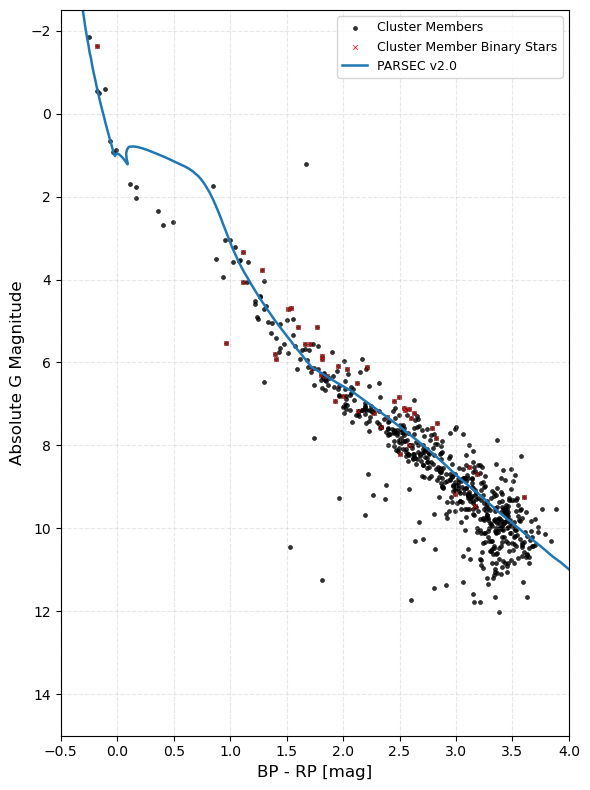

In [240]:
obs_bp_rp, obs_gmag, _ = get_observables(GMM_Cluster_HighMembers_nonBinaries)
plot_best_fit("PARSEC_v2_82", all_fit_results, obs_bp_rp, obs_gmag)

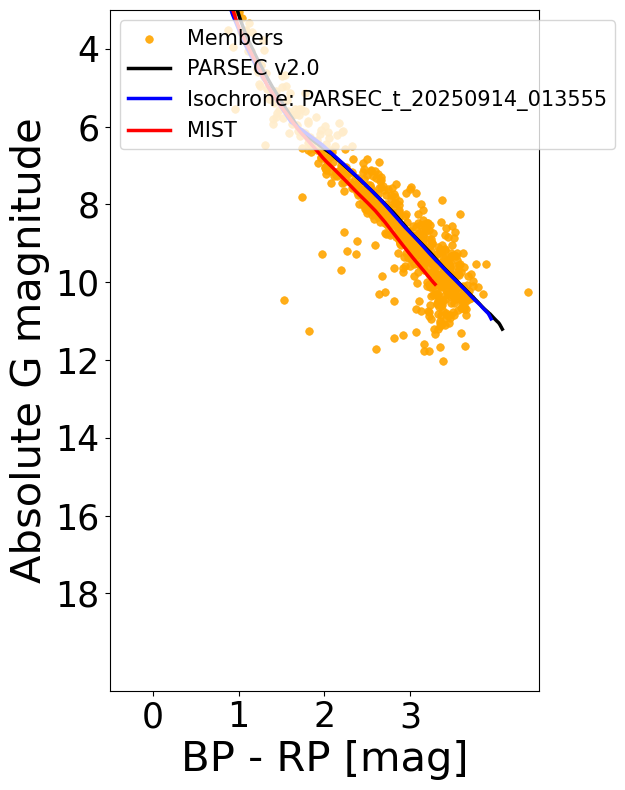

In [241]:
obs_bp_rp, obs_gmag, _ = get_observables(GMM_Cluster_HighMembers)
plot_multiple_best_fits(["PARSEC_v2_82", "PARSEC_t_20250914_013555", "MIST_v1_t_20250914_150506"], all_fit_results, obs_bp_rp, obs_gmag)

## Combined Plot

In [112]:
all_fit_results.keys()

dict_keys(['MIST_v1_t_20250808_171740', 'PARSEC_v2_82', 'PARSEC_t_20250808_173924'])

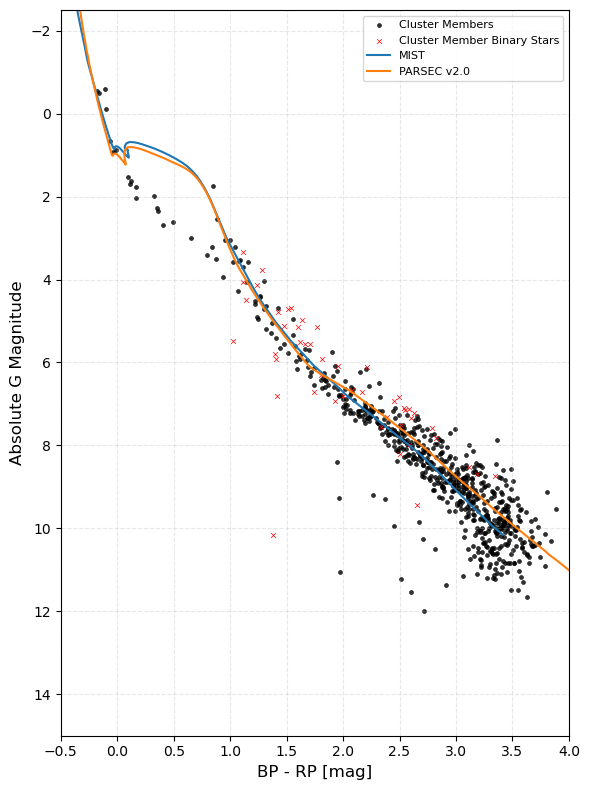

In [120]:
obs_bp_rp, obs_gmag, _ = get_observables(GMM_Cluster_HighMembers_nonBinaries)
plot_multiple_best_fits(["MIST_v1_t_20250808_171740", "PARSEC_v2_82"], all_fit_results, obs_bp_rp, obs_gmag)

### Combined Ranges

Here I provide a function, that combines two different isochrone based on a AbsGmag threshold.

In [208]:
def plot_combined_isochrone(mist_result, parsec_result, gmag_threshold=5.5):
    fig, ax = plt.subplots(figsize=(6, 8))

    # Plot observed stars
    ax.scatter(
        obs_bp_rp, obs_gmag,
        s=8, c="black", edgecolors="black", linewidths=0.5, alpha=0.8,
        label="Cluster Members", marker="o"
    )
    ax.scatter(
        GMM_Cluster_HighMembers_binaries["BP-RP"], GMM_Cluster_HighMembers_binaries["AbsMag"],
        s=12, facecolor="red", edgecolors="blue", linewidths=0.5, alpha=1.0,
        label="Cluster Member Binary Stars", marker="x"
    )

    ##Extract MIST isochrone
    mist_fit = mist_result["best_fit"]
    mist_iso = mist_result["best_iso"]

    def apparent_to_absolute(mag, distance_pc, AV=0.0):
        return mag - 5 * (np.log10(distance_pc) - 1) - AV

    mist_G = apparent_to_absolute(mist_iso["G_mag"], mist_fit[2], AV=mist_fit[3])
    mist_bp_rp = mist_iso["BP_mag"] - mist_iso["RP_mag"]

    ##Extract PARSEC v2.0 isochrone
    parsec_iso = parsec_result["best_iso"]
    parsec_G = parsec_iso["G_fSBmag"]
    parsec_bp_rp = parsec_iso["G_BP_fSBmag"] - parsec_iso["G_RP_fSBmag"]

    ##Mask by Gmag instead of color
    mist_mask = mist_G < gmag_threshold
    parsec_mask = parsec_G >= gmag_threshold

    ##Plot MIST part
    ax.plot(
        mist_bp_rp[mist_mask],
        mist_G[mist_mask],
        label=f"MIST (G < {gmag_threshold})",
        color="tab:orange",
        linewidth=2.0
    )

    ##Plot PARSEC part
    ax.plot(
        parsec_bp_rp[parsec_mask],
        parsec_G[parsec_mask],
        label=f"PARSEC v2.0 (G ≥ {gmag_threshold})",
        color="tab:green",
        linewidth=2.0
    )

    
    ax.set_xlabel("BP − RP [mag]")
    ax.set_ylabel("Absolute G Magnitude")
    ax.set_xlim(-0.5, 4)
    ax.set_ylim(15, -2.5)
    ax.grid(True, linestyle="--", alpha=0.3)
    ax.legend()
    plt.tight_layout()
    plt.show()


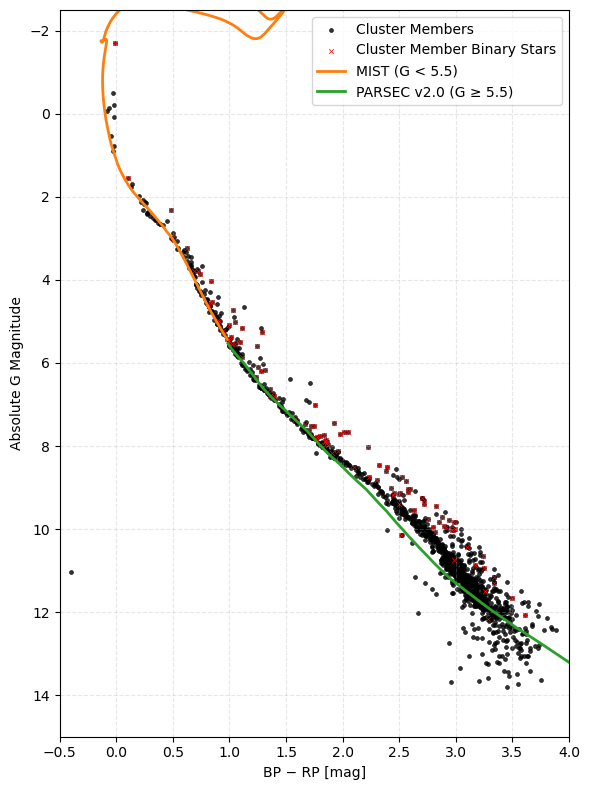

In [209]:
plot_combined_isochrone(
    mist_result=all_fit_results["MIST_v1_t_20250802_145412"],
    parsec_result=all_fit_results["PARSEC_v2_81_01"]
)


Every of the three version Isochrones works.

In [210]:
def plot_combined_all_isochrone(
    lower_model_result,
    upper_model_result,
    lower_label="Model A",
    upper_label="Model B",
    y_threshold=6
):
    fig, ax = plt.subplots(figsize=(6, 8))

    # Plot observed stars
    ax.scatter(
        obs_bp_rp, obs_gmag,
        s=8, c="black", edgecolors="black", linewidths=0.5, alpha=0.8,
        label="Cluster Members", marker="o"
    )
    ax.scatter(
        GMM_Cluster_HighMembers_binaries["BP-RP"], GMM_Cluster_HighMembers_binaries["AbsMag"],
        s=12, facecolor="blue", edgecolors="blue", linewidths=0.5, alpha=1.0,
        label="Cluster Member Binary Stars", marker="x"
    )

    def get_isochrone_components(result, label):
        iso = result["best_iso"]

        if "G_fSBmag" in iso.columns:  # PARSEC v2.0
            G = iso["G_fSBmag"]
            BP = iso["G_BP_fSBmag"]
            RP = iso["G_RP_fSBmag"]

        elif "G_mag" in iso.columns:  # MIST
            fit = result["best_fit"]
            def apparent_to_absolute(mag, distance_pc, AV=0.0):
                return mag - 5 * (np.log10(distance_pc) - 1) - AV
            G = apparent_to_absolute(iso["G_mag"], fit[2], AV=fit[3])
            BP = iso["BP_mag"]
            RP = iso["RP_mag"]

        elif "Gmag" in iso.columns:  # PARSEC v1.2S
            G = iso["Gmag"]
            BP = iso["G_BPmag"]
            RP = iso["G_RPmag"]

        else:
            raise ValueError(f"Unknown column structure for model '{label}'")

        BP_RP = BP - RP
        return np.array(BP_RP), np.array(G)

    # Extract native-order isochrone components
    lower_bp_rp, lower_G = get_isochrone_components(lower_model_result, lower_label)
    upper_bp_rp, upper_G = get_isochrone_components(upper_model_result, upper_label)

    # Apply masks without sorting
    lower_mask = lower_G < y_threshold
    upper_mask = upper_G >= y_threshold

    # Slice only where needed
    lower_bp_rp = lower_bp_rp[lower_mask]
    lower_G = lower_G[lower_mask]

    upper_bp_rp = upper_bp_rp[upper_mask]
    upper_G = upper_G[upper_mask]

    # Plot both segments
    ax.plot(
        lower_bp_rp,
        lower_G,
        label=f"{lower_label} (G < {y_threshold})",
        linewidth=2.0,
        color="tab:orange"
    )
    ax.plot(
        upper_bp_rp,
        upper_G,
        label=f"{upper_label} (G ≥ {y_threshold})",
        linewidth=2.0,
        color="tab:green"
    )

    # Final layout
    ax.set_xlabel("BP − RP [mag]")
    ax.set_ylabel("Absolute G Magnitude")
    ax.set_xlim(-0.5, 4)
    ax.set_ylim(15, -2.5)
    ax.grid(True, linestyle="--", alpha=0.3)
    ax.legend()
    plt.tight_layout()
    plt.show()


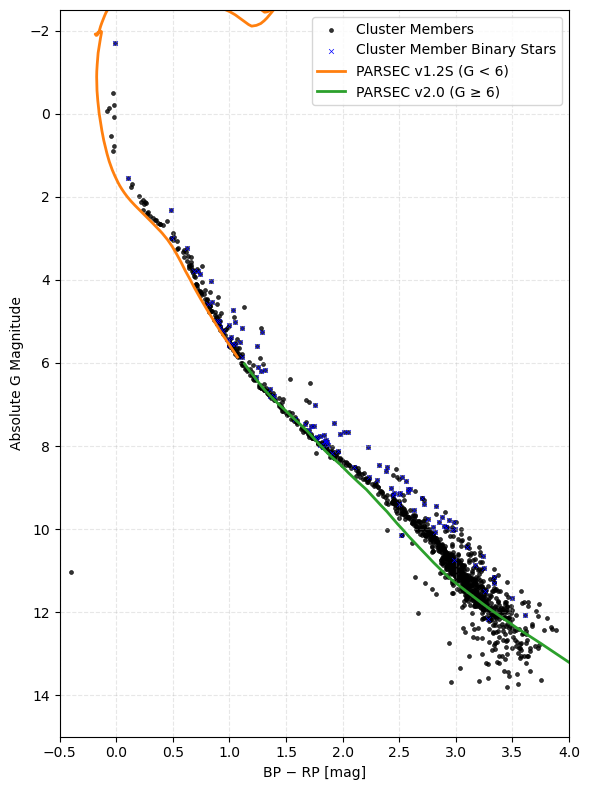

In [211]:
plot_combined_all_isochrone(
    lower_model_result=all_fit_results["PARSEC_t_20250802_145743"],
    upper_model_result=all_fit_results["PARSEC_v2_81_01"],
    lower_label="PARSEC v1.2S",
    upper_label="PARSEC v2.0"
)


### Residuals

In [585]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import UnivariateSpline
from matplotlib.colors import Normalize

def plot_cmd_residuals(label, fit_results_dict, obs_bp_rp, obs_gmag):
    """
    Plot residuals between observed CMD and model isochrone CMD.

    Parameters:
    - label: str, model key in fit_results_dict
    - fit_results_dict: dict with keys like "best_fit" and "best_iso"
    - obs_bp_rp: array of observed BP - RP color
    - obs_gmag: array of observed absolute G magnitude
    """
    # Extract data
    result = fit_results_dict[label]
    best_fit = result.get("best_fit", None)
    best_iso = result["best_iso"]

# region Model Stuff
    # Determine model type
    if {"G_mag", "BP_mag", "RP_mag"}.issubset(best_iso.columns):  # MIST
        G_col, BP_col, RP_col = "G_mag", "BP_mag", "RP_mag"
        extinction_needs_applying = True
    elif {"Gmag", "G_BPmag", "G_RPmag"}.issubset(best_iso.columns):  # PARSEC v1.2S
        G_col, BP_col, RP_col = "Gmag", "G_BPmag", "G_RPmag"
        extinction_needs_applying = False
    elif {"G_fSBmag", "G_BP_fSBmag", "G_RP_fSBmag"}.issubset(best_iso.columns):  # PARSEC v2.0
        G_col, BP_col, RP_col = "G_fSBmag", "G_BP_fSBmag", "G_RP_fSBmag"
        extinction_needs_applying = False
    else:
        raise ValueError(f"Unrecognized isochrone format for label: {label}")

    # Apply extinction and color corrections if needed
    bp = best_iso[BP_col].values
    rp = best_iso[RP_col].values
    G  = best_iso[G_col].values

    if best_fit is not None:
        _, _, distance_pc, AV, *_ = best_fit
    else:
        distance_pc = 135.0
        AV = 0.0

    R_G = 0.85926
    #R_G = 0
    R_BP_RP = 1.289
    #R_BP_RP = 0

    if extinction_needs_applying:
        G_abs = G - 5 * (np.log10(distance_pc) - 1) - AV * R_G
        bp_rp = bp - rp - R_BP_RP * AV
    else:
        G_abs = G + AV * R_G
        bp_rp = bp - rp + AV * R_BP_RP

    # Interpolate model CMD using spline
    x = np.sort(bp_rp)
    y = G_abs[np.argsort(bp_rp)]
    x_u, idx_u = np.unique(x, return_index=True)
    y_u = y[idx_u]

    spline = UnivariateSpline(x_u, y_u, s=0, k=3)
    model_gmag = spline(obs_bp_rp)

    # Compute residuals
    residuals = obs_gmag - model_gmag
    norm = Normalize(vmin=-1.5, vmax=1.5)
# endregion

    ##===Plotting ====##
    fig, ax = plt.subplots(figsize=(6, 9))
    sc = ax.scatter(
        obs_bp_rp, obs_gmag, s=60, c=residuals,
        cmap="coolwarm", norm=norm, edgecolor="k", linewidth=0.3,
        label=r"$\lambda$ Ori Members", alpha = 0.9,
    )

    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label(r"$M_G$ residuals", fontsize=25)
    cbar.ax.tick_params(labelsize=20) 

    # === Styling === #
    ax.set_xlabel(r"$G_B - G_R$ [mag]", fontsize=30)
    ax.set_ylabel(r"$M_G$ [mag]", fontsize=30)
    ax.set_xlim(-1, 5)
    ax.set_ylim(13.0, -3)
    ax.set_xticks(np.arange(0, 5, 1))
    ax.set_yticks(np.arange(-2, 13, 2))
    ax.legend(prop={"size": 17}, loc="upper right", scatterpoints=1, markerscale=1, fontsize = 25)

    #ax.grid(True, linestyle="--", alpha=0.3)
    ax.tick_params(labelsize=30)

    #plt.tight_layout()
    plt.savefig(f"C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/LORI_Residuals_{label}.pdf", bbox_inches = "tight")
    plt.show()


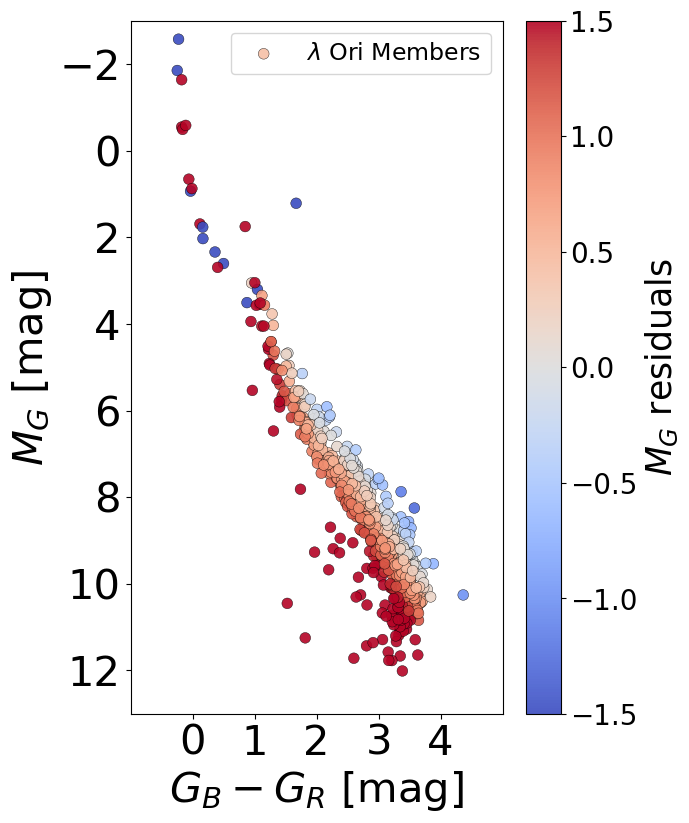

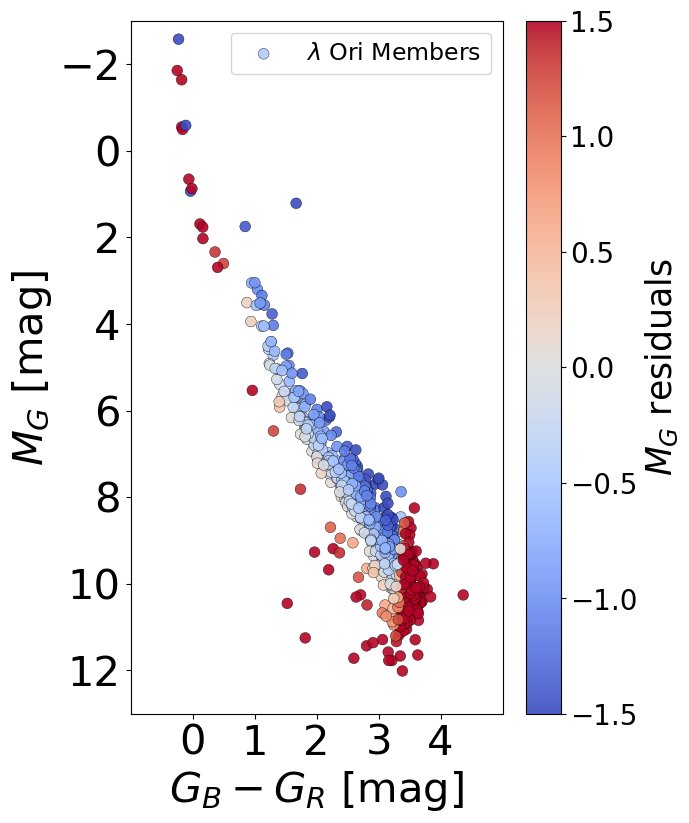

In [586]:
obs_bp_rp, obs_gmag, _ = get_observables(GMM_Cluster_HighMembers)
plot_cmd_residuals("PARSEC_t_20250914_013555", all_fit_results, obs_bp_rp, obs_gmag)
#plot_cmd_residuals("PARSEC_t_20250801_175807", all_fit_results, obs_bp_rp, obs_gmag)
plot_cmd_residuals("MIST_v1_t_20250914_150506", all_fit_results, obs_bp_rp, obs_gmag)

## MADYS

In [269]:
##===== All Packages =====##
import pandas as pd
import madys as madys
import numpy as np
import matplotlib.pyplot as plt

from madys import ModelHandler

### Prepare data

In [270]:
##===== Note =====##
# region
    # The madys package expects certain key arguments (header), like "ID, source_id, etc." for the Source/ ID column.
    # If any error should be considered by the model for a variable x, use x_err
# endregion

In [271]:
ext_path = r"C:\Users\lenna\Documents\Bachelor_Thesis\Preperation_LORI\LORI_HighProbMembers.csv"
dsEx_LORI = pd.read_csv(ext_path)
print(dsEx_LORI.columns.tolist())

['_r', '_RAJ2000', '_DEJ2000', 'RA_ICRS', 'e_RA_ICRS', 'DE_ICRS', 'e_DE_ICRS', 'Source', 'Plx', 'e_Plx', 'PM', 'pmRA', 'e_pmRA', 'pmDE', 'e_pmDE', 'RUWE', 'FG', 'e_FG', 'Gmag', 'e_Gmag', 'FBP', 'e_FBP', 'BPmag', 'e_BPmag', 'FRP', 'e_FRP', 'RPmag', 'e_RPmag', 'BP-RP', 'RVDR2', 'e_RVDR2', 'Tefftemp', 'loggtemp', 'PS1', 'SDSSDR13', 'SkyMapper2', 'URAT1', 'GmagCorr', 'e_GmagCorr', 'FGCorr', 'RAJ2000', 'DEJ2000', 'Lum-Flame', 'Teff', 'logTeff', 'RVcormerg', 'e_RVcormerg', 's_RVcormerg', 'rel_error_Gmag', 'e_BP_RP', 'rel_error_BP_RP', 'AbsMag', 'e_AbsMag', 'RUWE_hardlabel', 'RUWE_bin_RawData', 'dx_arcmin', 'dy_arcmin', 'HDBSCAN_labels', 'RUWE_bin_HDBSCAN', 'GMM_MembProb', 'GMM_labels']


In [272]:
##===== Needed Columns =====##
# Rename columns
ext_columns_madys = dsEx_LORI.rename(columns={
    "Source": "ID",
    "RA_ICRS": "ra",
    "e_RA_ICRS": "ra_err",
    "DE_ICRS": "dec",
    "e_DE_ICRS": "dec_err",
    "Plx": "parallax",
    "e_Plx": "parallax_err",
    "Gmag": "G",
    "e_Gmag": "G_err",
    "BPmag": "BP",
    "e_BPmag": "BP_err",
    "RPmag": "RP",
    "e_RPmag": "RP_err",
    "BP-RP": "bp_rp"
})

# New DateSet with only these variables (to keep it clean for later)
madys_df = ext_columns_madys[["ID", "ra", "ra_err", "dec", "dec_err", "parallax", "parallax_err", "G", "G_err", "BP", "BP_err", "RP", "RP_err", "bp_rp"]].copy()

# To make sure, that the function "SamplerObject" can read the "ID" Column correctly
madys_df["ID"] = madys_df["ID"].astype(str)
#print(madys_df.head())

##===== Additional =====##
# Analyse DataSet
#print(madys_df.info())
# Save to csv
madys_df.to_csv(r"C:\Users\lenna\Documents\Bachelor_Thesis\Preperation_LORI\madys.csv", index = False)
    ##===== Note =====##: This step is important, as the subsequent function "SampleObject" expects a path to a file, not a file directly.

### Download Models

In [275]:
##===== Check database =====##
# Check all model available
#madys.ModelHandler.available("full_model_list")
# Check specifics of one model
#madys.ModelHandler.available("bhac15_p0.00")

##===== Download specific models =====##
# Note: -> p0.00 stands for metallicity 0, but for later functions, MADYS also can find the best fit download
madys.ModelHandler.download_model("bhac15_p0.00")
madys.ModelHandler.download_model("dartmouth_p0.00_p0.0_B1")

Model correctly downloaded.


In [110]:
##===== Available filters =====##
# Call all possible filters
#madys.info_filters()
# Check a specific filter (eg. for model availability)
#madys.into_filters("G")

### Initialize

In [276]:
##===== Note =====##
# region 
    # Subsequently, the code is provided to start the survey query (online).
    # However, as my original used data failed for "SIMBAD" references, the below snippet created a "fake simbad column",
    # so that the rest of the query still can happen.

    # Verbose setting:
        # 0 -> no file is saved
        # 1 -> a csv. file is saved
        # 2/3 -> see documentation
# endregion

In [277]:
##===== Prepare =====##
# region Prepare
##Save original (if needed later)
#_orig = getattr(madys.SampleObject, "_get_simbad_names", None)

##Function to crate fake entries
def _fake_get_simbad_names(self):
    # Tabel lenghts
    n = len(self.ID) if hasattr(self, "ID") else 0
    # Creates emty list
    self.SimbadIDs = [[] for _ in range(n)]
    return

##Monkeypatch
madys.SampleObject._get_simbad_names = _fake_get_simbad_names
# endregion

##===== Initialize =====##
# Set the path
madys_df_path = r"C:\Users\lenna\Documents\Bachelor_Thesis\Preperation_LORI\madys.csv"
madys_obj = madys.SampleObject(madys_df_path, id_type="DR3", ext_map="stilism", verbose = 1, simad_query = True)
print("Created object succesfully (Skipped Simbad).")
print(madys_obj)
##To insect the actual new table
#madys_obj.phot_table

##Optional: Recover Ogiginal function
# if _orig is not None:
#     madys.SampleObject._get_simbad_names = _orig


Created object succesfully (Skipped Simbad).
A SampleObject instance, mode 1 
Input file: 'C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/madys.csv' 
Settings: id_type='DR3', ext_map='stilism', verbose=1, simad_query=True


In [113]:
##===== REMEBER =====##
# region
    # By using "SampleObject", your data is surveyed against other catalogs (2MASS, gaia), thus it will create these entries in the new table.

    # When using internla functions like CMD then, you can call eg. "G" which will call "dr3_phot_g_mean_mag" or "K"->"ks_m".
    # This only works for internal functions, otherwise you need to call the actual column name
        # These parameters like "G"/ "K", are the so called "filters", which are available for only specific models.

    # Remember:
        # When calling .CMD, the magnitides will be automatically corrected for extinction with "app_to_abs", if parallax was provided.
        # However, this function does not work by itself!
# endregion

### Analysis

#### Plot CMD

##### Internal .CMD function

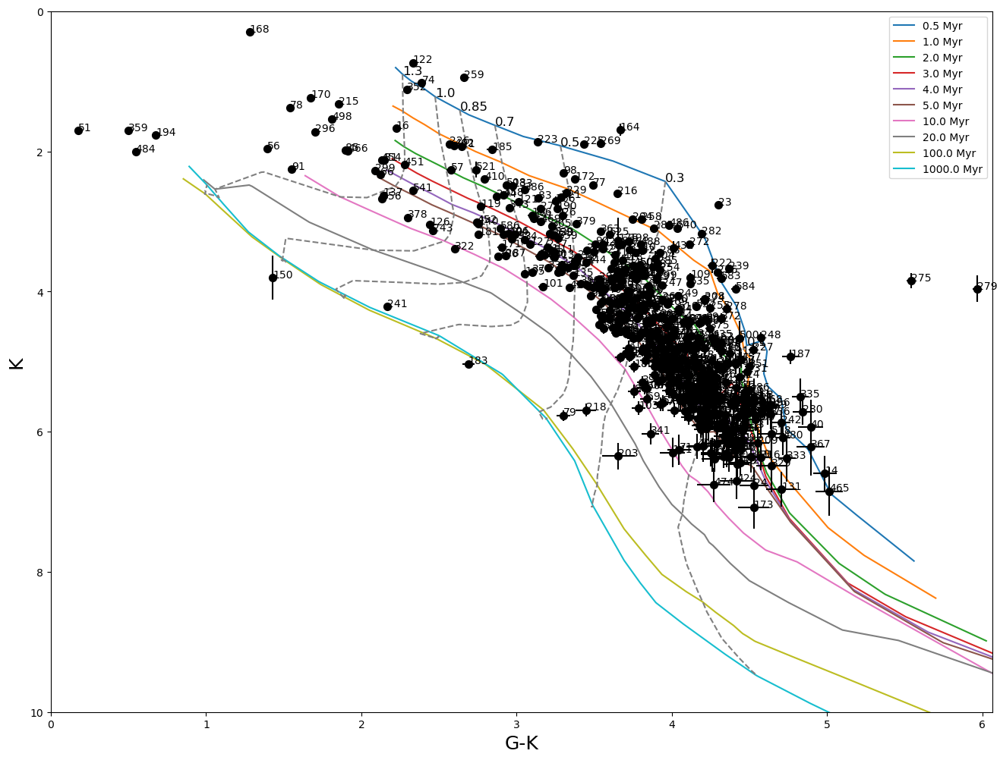

In [280]:
##===== .CMD function =====##
# xx.[x:x] -> manually decide which object you want to plot
madys_obj[0:600].CMD("G-K", "K", "bhac15", plot_ages=[0.5,1,2,3,4,5,10,20,100,1000])

## Note:
    # plot_ages -> ages (in Myr) of isochrones
    # plot_masses -> masses (in M_sun) of the tracks

##### Manually plot CMD

In [278]:
##====== Prepare =====##
# Make sure, that you used "verbose = 1", so that a .csv was created
madys_phot_table_path = r"C:\Users\lenna\Documents\Bachelor_Thesis\Preperation_LORI\madys_phot_table.csv"
MPTv1 = pd.read_csv(madys_phot_table_path)

##Add "Abssolute" magnitude for CMD
MPTv1["AbsGMag"] = MPTv1["dr3_phot_g_mean_mag"] - 5*np.log10(1000/MPTv1["dr3_parallax"])+5

print(MPTv1.columns.tolist())
print(MPTv1.info())


['ID', 'dr3_id', 'dr2_id', 'tmass_id', 'dr3_epoch', 'hipparcos_id', 'ra', 'dec', 'ra_error', 'dec_error', 'dr3_parallax', 'dr3_parallax_error', 'dr3_parallax_over_error', 'dr3_pmra', 'dr3_pmra_error', 'dr3_pmdec', 'dr3_pmdec_error', 'dr3_ra_dec_corr', 'dr3_ra_parallax_corr', 'dr3_ra_pmra_corr', 'dr3_ra_pmdec_corr', 'dr3_dec_parallax_corr', 'dr3_dec_pmra_corr', 'dr3_dec_pmdec_corr', 'dr3_parallax_pmra_corr', 'dr3_parallax_pmdec_corr', 'dr3_pmra_pmdec_corr', 'dr3_phot_g_mean_mag', 'dr3_phot_g_mean_flux', 'dr3_phot_g_mean_flux_error', 'dr3_phot_bp_mean_flux', 'dr3_phot_bp_mean_flux_error', 'dr3_phot_bp_mean_mag', 'dr3_phot_rp_mean_flux', 'dr3_phot_rp_mean_flux_error', 'dr3_phot_rp_mean_mag', 'dr3_bp_rp', 'dr3_phot_bp_rp_excess_factor', 'dr3_ruwe', 'dr3_astrometric_params_solved', 'dr2_epoch', 'dr2_ra', 'dr2_dec', 'dr2_ra_error', 'dr2_dec_error', 'dr2_parallax', 'dr2_parallax_error', 'dr2_parallax_over_error', 'dr2_pmra', 'dr2_pmra_error', 'dr2_pmdec', 'dr2_pmdec_error', 'dr2_ra_dec_corr',

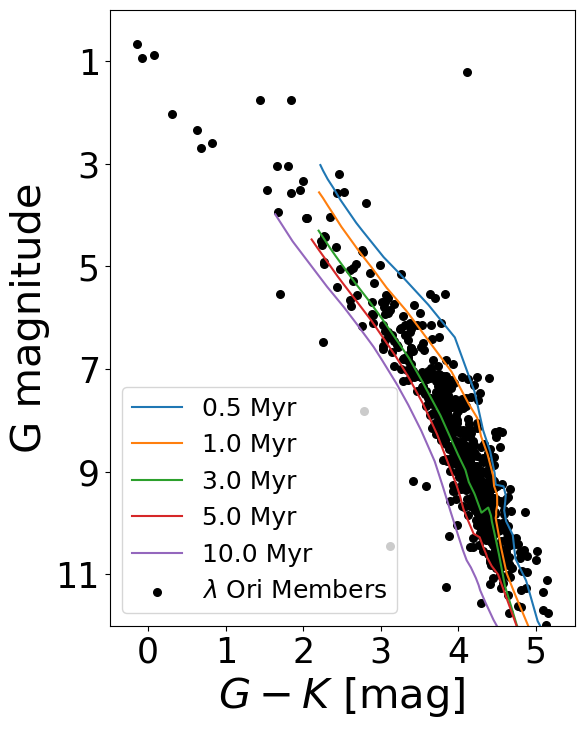

In [ ]:
##===== Plot =====##
fig, ax = plt.subplots(figsize=(6,8))
madys.IsochroneGrid.plot_isochrones("G-K", "G", "bhac15", ax = ax, plot_ages = [0.5,1,3,5,10], plot_masses=[],lw = 2.5)
#madys.IsochroneGrid.plot_isochrones("G-K", "G", "dartmouth", ax = ax, plot_ages = [1,3,5,10], plot_masses=[], linewith = 2.5)
plt.scatter(MPTv1['dr3_phot_g_mean_mag'] - MPTv1['ks_m'], 
            MPTv1['AbsGMag'], 
            color='k', s=30, label=r"$\lambda$ Ori Members")

plt.gca().invert_yaxis()
plt.xlim(-0.5,5.5)
plt.ylim(12,0)

plt.yticks(np.arange(1, 12, 2))
plt.xticks(np.arange(0, 6, 1))

plt.xlabel(r"$G - K$ [mag]", size = 30)
plt.ylabel("G magnitude", size = 30)
plt.tick_params(axis = "both", labelsize = 25)

#plt.grid(True, linestyle = "-", alpha = 0.3)
plt.legend(prop = {"size": 18}, loc = "lower left", scatterpoints = 1, markerscale = 1, fontsize = 25)

#plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/LORI_BHAC.pdf", bbox_inches = "tight")
plt.show()

#### Extinction Map

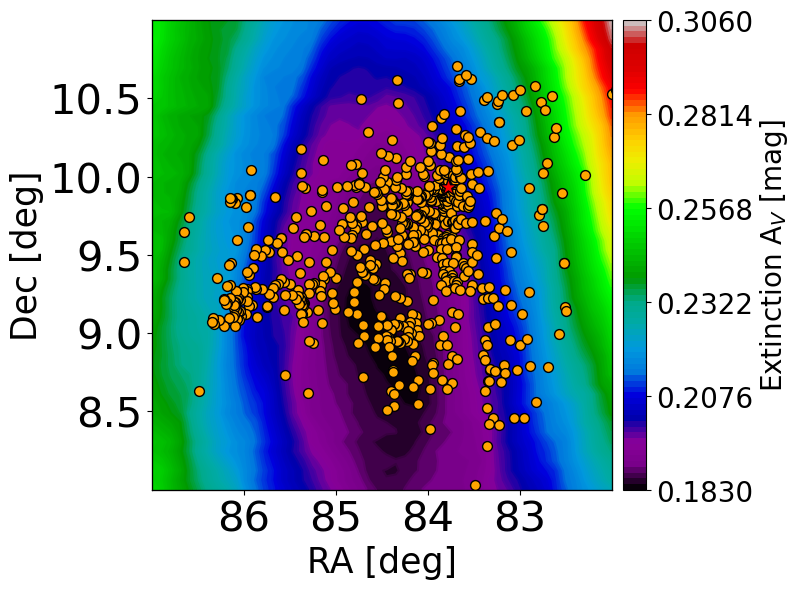

In [390]:
import numpy as np
import matplotlib.pyplot as plt

grid_x = np.linspace(82, 87, 1000)
grid_y = np.linspace(8, 11, 1000)

fontsize = 25
XX, YY = np.meshgrid(grid_x, grid_y)
fig, ax = plt.subplots(figsize=(8,6))

# --- Draw dust map (suppress internal colorbar)
m = madys.SampleObject.plot_2D_ext(
    ra=[82,87], dec=[8,11], d=400,
    color="V", reverse_xaxis=True,
    cmap="nipy_spectral", ax=ax,
    ext_map="stilism", colorbar=False
)

# Try to catch returned object
# If None, grab the last collection artist (for pcolormesh/contourf)
if m is None:
    # look for QuadMesh (pcolormesh) or Collection (contourf)
    for artist in ax.collections:
        m = artist
    if m is None:
        raise RuntimeError("Could not find plotted dust map artist.")

# Format axes
ax.tick_params(axis="x", labelsize=30)
ax.tick_params(axis="y", labelsize=30)
ax.set_xlabel('RA [deg]', fontsize=fontsize)
ax.set_ylabel('Dec [deg]', fontsize=fontsize)

ax.set_xticks(np.arange(83,87,1))
ax.set_yticks(np.arange(8.5,11,0.5))

# --- Add external colorbar
cbar = fig.colorbar(m, ax=ax, orientation="vertical", pad=0.02)
cbar.set_label("Extinction A$_V$ [mag]", fontsize=20)
cbar.ax.tick_params(labelsize=20)

# manually set ticks: start below 0.183
vmin, vmax = m.get_clim()
ticks = np.linspace(vmin, vmax, 6)  # adjust range & number
cbar.set_ticks(ticks)

# --- Overlay data
ax2 = ax.twinx().twiny()
ax2.set_xlim(ax.get_xlim())
ax2.set_ylim(ax.get_ylim())
ax2.scatter(MPTv1['ra'], MPTv1['dec'],
            edgecolors='black', s=50,
            facecolor="orange", marker="o")
ax2.set_xticks([]); ax2.set_yticks([])
ax2.patch.set_alpha(0)  # transparent background

# highlight single object
ax2.scatter(83.78449673651, 9.93415011072,
            facecolor="red", edgecolors="black",
            s=170, marker="*")


plt.tight_layout()
plt.savefig("C:/Users/lenna/Documents/Bachelor_Thesis/Preperation_LORI/Figures/LORI_ExtinctionMap.pdf")
plt.show()


#### More (get_params)

In [308]:
##===== Run Function =====##
# Run get_params function to derive various cluster parameters based on the respective model
#resultss = madys_obj.get_params("bhac15")
results_dartmouth = madys_obj.get_params("dartmouth")

# Quickly inspect table via: resultss.pprint("in_notebook")

Program running. Done: 4/653 (0.6%). Estimated time left: 12644 s.
Program running. Done: 11/653 (1.7%). Estimated time left: 8068 s.
Program running. Done: 20/653 (3.1%). Estimated time left: 6488 s.
Program running. Done: 22/653 (3.4%). Estimated time left: 7948 s.
Program running. Done: 30/653 (4.6%). Estimated time left: 10384 s.
Program running. Done: 33/653 (5.1%). Estimated time left: 10545 s.
Program running. Done: 39/653 (6.0%). Estimated time left: 11861 s.
Program running. Done: 41/653 (6.3%). Estimated time left: 13873 s.
Program running. Done: 48/653 (7.4%). Estimated time left: 12492 s.
Program running. Done: 54/653 (8.3%). Estimated time left: 11782 s.
Program running. Done: 65/653 (10.0%). Estimated time left: 10158 s.
Program running. Done: 72/653 (11.0%). Estimated time left: 9561 s.
Program running. Done: 84/653 (12.9%). Estimated time left: 8444 s.
Program running. Done: 92/653 (14.1%). Estimated time left: 7970 s.
Program running. Done: 102/653 (15.6%). Estimated t

In [285]:
resultss = madys_obj.get_params("bhac15")

Program running. Done: 8/653 (1.2%). Estimated time left: 5714 s.
Program running. Done: 21/653 (3.2%). Estimated time left: 4145 s.
Program running. Done: 30/653 (4.6%). Estimated time left: 7276 s.
Program running. Done: 39/653 (6.0%). Estimated time left: 6668 s.
Program running. Done: 41/653 (6.3%). Estimated time left: 8915 s.
Program running. Done: 51/653 (7.8%). Estimated time left: 7800 s.
Program running. Done: 66/653 (10.1%). Estimated time left: 6455 s.
Program running. Done: 85/653 (13.0%). Estimated time left: 5258 s.
Program running. Done: 102/653 (15.6%). Estimated time left: 4592 s.
Program running. Done: 114/653 (17.5%). Estimated time left: 4315 s.
Program running. Done: 119/653 (18.2%). Estimated time left: 4923 s.
Program running. Done: 120/653 (18.4%). Estimated time left: 5716 s.
Program running. Done: 138/653 (21.1%). Estimated time left: 5070 s.
Program running. Done: 149/653 (22.8%). Estimated time left: 5322 s.
Program running. Done: 155/653 (23.7%). Estimated

In [309]:
##===== Derive Means =====##
# Create table to work with
#table = resultss.to_table()
table = results_dartmouth.to_table()

##=== Calculate Means ===##
# Drop any NaN values
mask = (
    ~np.isnan(table["age"]) &
    ~np.isnan(table["age_min"]) &
    ~np.isnan(table["age_max"]) &
    ~np.isnan(table["ebv"]) &
    ~np.isnan(table["ebv_err"])
)
table_clean = table[mask]

# Compute means
mean_age     = np.mean(table_clean["age"])
mean_age_min = np.mean(table_clean["age_min"])
mean_age_max = np.mean(table_clean["age_max"])
mean_ebv     = np.mean(table_clean["ebv"])
mean_ebv_err = np.mean(table_clean["ebv_err"])

print(f"Mean age:     {mean_age:.3f}")
print(f"Mean age_min: {mean_age_min:.3f}")
print(f"Mean age_max: {mean_age_max:.3f}")
print(f"Mean ebv: {mean_ebv:.3f}")
print(f"Mean ebv_err: {mean_ebv_err:.3f}")

Mean age:     9.010
Mean age_min: 6.984
Mean age_max: 12.651
Mean ebv: 0.064
Mean ebv_err: 0.000
